<font size=7>**Предсказание температуры стали.**</font>

<font size=4>**Описание проекта.**

Для оптимизации потребления электроэнергии на металлургическом комбинате необходимо построить модель, которая предскажет температуру стали на финальном этапе обработки.

<font size=4>**Описание данных.**

Данные состоят из файлов, полученных из разных источников:
- `data_arc_new.csv` — данные об электродах;
- `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time_new.csv` — данные о подаче сыпучих материалов (время);
- `data_gas_new.csv` — данные о продувке сплава газом;
- `data_temp_new.csv` — результаты измерения температуры;
- `data_wire_new.csv` — данные о проволочных материалах (объём);
- `data_wire_time_new.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.

<h1>Содержание.<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Библиотеки-и-константы." data-toc-modified-id="Библиотеки-и-константы.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Библиотеки и константы.</a></span></li><li><span><a href="#Знакомство-с-данными." data-toc-modified-id="Знакомство-с-данными.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Знакомство с данными.</a></span></li><li><span><a href="#Предобработка-данных." data-toc-modified-id="Предобработка-данных.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Предобработка данных.</a></span><ul class="toc-item"><li><span><a href="#df_arc-—-данные-об-электродах." data-toc-modified-id="df_arc-—-данные-об-электродах.-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span><code>df_arc</code> — данные об электродах.</a></span></li><li><span><a href="#df_bulk-—-данные-о-подаче-сыпучих-материалов-(объём)" data-toc-modified-id="df_bulk-—-данные-о-подаче-сыпучих-материалов-(объём)-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span><code>df_bulk</code> — данные о подаче сыпучих материалов (объём)</a></span></li><li><span><a href="#df_bulk_time-—-данные-о-подаче-сыпучих-материалов-(время)." data-toc-modified-id="df_bulk_time-—-данные-о-подаче-сыпучих-материалов-(время).-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span><code>df_bulk_time</code> — данные о подаче сыпучих материалов (время).</a></span></li><li><span><a href="#df_gas-—-данные-о-продувке-сплава-газом" data-toc-modified-id="df_gas-—-данные-о-продувке-сплава-газом-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span><code>df_gas</code> — данные о продувке сплава газом</a></span></li><li><span><a href="#df_temp-—-результаты-измерения-температуры." data-toc-modified-id="df_temp-—-результаты-измерения-температуры.-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span><code>df_temp</code> — результаты измерения температуры.</a></span></li><li><span><a href="#df_wire-—-данные-о-проволочных-материалах-(объём)." data-toc-modified-id="df_wire-—-данные-о-проволочных-материалах-(объём).-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span><code>df_wire</code> — данные о проволочных материалах (объём).</a></span></li><li><span><a href="#df_wire_time-—-данные-о-проволочных-материалах-(время)." data-toc-modified-id="df_wire_time-—-данные-о-проволочных-материалах-(время).-3.7"><span class="toc-item-num">3.7&nbsp;&nbsp;</span><code>df_wire_time</code> — данные о проволочных материалах (время).</a></span></li><li><span><a href="#Моменты,-которые-надо-уточнить-и-согласовать-с-представителем-заказчика." data-toc-modified-id="Моменты,-которые-надо-уточнить-и-согласовать-с-представителем-заказчика.-3.8"><span class="toc-item-num">3.8&nbsp;&nbsp;</span>Моменты, которые надо уточнить и согласовать с представителем заказчика.</a></span></li><li><span><a href="#Результат-предобработки." data-toc-modified-id="Результат-предобработки.-3.9"><span class="toc-item-num">3.9&nbsp;&nbsp;</span>Результат предобработки.</a></span></li></ul></li><li><span><a href="#Объединение-таблиц." data-toc-modified-id="Объединение-таблиц.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Объединение таблиц.</a></span></li><li><span><a href="#Обучение-моделей." data-toc-modified-id="Обучение-моделей.-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Обучение моделей.</a></span><ul class="toc-item"><li><span><a href="#Подготовка-выборок." data-toc-modified-id="Подготовка-выборок.-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Подготовка выборок.</a></span></li><li><span><a href="#Вычислим-среднюю-абсолютную-ошибку-(MAE)-для-модели,-которая-всегда-предсказывает-среднее-значение-целевой-переменной." data-toc-modified-id="Вычислим-среднюю-абсолютную-ошибку-(MAE)-для-модели,-которая-всегда-предсказывает-среднее-значение-целевой-переменной.-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Вычислим среднюю абсолютную ошибку (MAE) для модели, которая всегда предсказывает среднее значение целевой переменной.</a></span></li><li><span><a href="#Линейная-регрессия." data-toc-modified-id="Линейная-регрессия.-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Линейная регрессия.</a></span></li><li><span><a href="#Случайный-лес-RandomForestRegressor." data-toc-modified-id="Случайный-лес-RandomForestRegressor.-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Случайный лес RandomForestRegressor.</a></span></li><li><span><a href="#Градиентный-бустинг-LightGBM" data-toc-modified-id="Градиентный-бустинг-LightGBM-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Градиентный бустинг LightGBM</a></span></li><li><span><a href="#Градиентный-бустинг-CatBoostRegressor." data-toc-modified-id="Градиентный-бустинг-CatBoostRegressor.-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Градиентный бустинг CatBoostRegressor.</a></span></li><li><span><a href="#Support-Vector-Regression." data-toc-modified-id="Support-Vector-Regression.-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>Support Vector Regression.</a></span></li><li><span><a href="#Проанализируем-качество-моделей." data-toc-modified-id="Проанализируем-качество-моделей.-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>Проанализируем качество моделей.</a></span></li></ul></li><li><span><a href="#Тестирование-лучшей-модели." data-toc-modified-id="Тестирование-лучшей-модели.-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Тестирование лучшей модели.</a></span></li><li><span><a href="#Степень-влияния-признаков-на-целевой-показатель." data-toc-modified-id="Степень-влияния-признаков-на-целевой-показатель.-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Степень влияния признаков на целевой показатель.</a></span></li><li><span><a href="#Отчёт-по-решению." data-toc-modified-id="Отчёт-по-решению.-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Отчёт по решению.</a></span></li></ul></div>

## Библиотеки и константы.

In [2]:
# Импорт необходимых библиотек
import os
import optuna
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from time import time
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import KFold, cross_val_score

In [4]:
# Обозначим константы
RANDOM_STATE = 140823

## Знакомство с данными.

In [5]:
# Список локальных файлов
local_files = [
    'data_arc_new.csv',
    'data_bulk_new.csv',
    'data_bulk_time_new.csv',
    'data_gas_new.csv',
    'data_temp_new.csv',
    'data_wire_new.csv',
    'data_wire_time_new.csv'
]
# Список онлайн файлов
online_files = [
    'https://***/data_arc_new.csv',
    'https://***/data_bulk_new.csv',
    'https://***/data_bulk_time_new.csv',
    'https://***/data_gas_new.csv',
    'https://***/data_temp_new.csv',
    'https://***/data_wire_new.csv',
    'https://***/data_wire_time_new.csv'
]
# Создание пустого словаря для хранения наборов данных
datasets = {}
# Цикл по спискам локальных и онлайн файлов
for i in range(len(local_files)):
    local_file = local_files[i]
    online_file = online_files[i]
# Извлечение имени набора данных из имени файла
    dataset_name = local_file.split('.')[0]
# Проверка наличия локального файла
    if os.path.exists(local_file):
        # Если локальный файл существует, считываем его и сохраняем в словаре datasets
        datasets[dataset_name] = pd.read_csv(local_file)
    else:
        # Если локальный файл не существует, считываем онлайн файл по URL и сохраняем в словаре datasets
        datasets[dataset_name] = pd.read_csv(online_file)
# Отображение набора данных и информации о нем
    print(f"{dataset_name}:")
    display(datasets[dataset_name])
    print(datasets[dataset_name].info())
    print('*'*100)
# Присвоение отдельных наборов данных переменным для удобства
df_arc = datasets['data_arc_new']
df_bulk = datasets['data_bulk_new']
df_bulk_time = datasets['data_bulk_time_new']
df_gas = datasets['data_gas_new']
df_temp = datasets['data_temp_new']
df_wire = datasets['data_wire_new']
df_wire_time = datasets['data_wire_time_new']

data_arc_new:


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691
...,...,...,...,...,...
14871,3241,2019-09-06 16:49:05,2019-09-06 16:51:42,0.439735,0.299579
14872,3241,2019-09-06 16:55:11,2019-09-06 16:58:11,0.646498,0.458240
14873,3241,2019-09-06 17:06:48,2019-09-06 17:09:52,1.039726,0.769302
14874,3241,2019-09-06 17:21:58,2019-09-06 17:22:55,0.530267,0.361543


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB
None
****************************************************************************************************
data_bulk_new:


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,NaN,NaN,170.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,252.0,NaN,130.0,206.0
3125,3238,NaN,NaN,126.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,254.0,NaN,108.0,106.0
3126,3239,NaN,NaN,NaN,NaN,NaN,114.0,NaN,NaN,NaN,NaN,NaN,158.0,NaN,270.0,88.0
3127,3240,NaN,NaN,NaN,NaN,NaN,26.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,192.0,54.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB
None
****************************************************************************************************
data_bulk_time_new:


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,NaN,NaN,2019-09-06 11:54:15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-09-06 11:49:45,NaN,2019-09-06 11:45:22,2019-09-06 11:40:06
3125,3238,NaN,NaN,2019-09-06 12:26:52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-09-06 12:18:35,NaN,2019-09-06 12:31:49,2019-09-06 12:26:52
3126,3239,NaN,NaN,NaN,NaN,NaN,2019-09-06 15:06:00,NaN,NaN,NaN,NaN,NaN,2019-09-06 15:01:44,NaN,2019-09-06 14:58:15,2019-09-06 14:48:06
3127,3240,NaN,NaN,NaN,NaN,NaN,2019-09-06 16:24:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-09-06 16:07:29,2019-09-06 16:01:34


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB
None
****************************************************************************************************
data_gas_new:


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
...,...,...
3234,3237,5.543905
3235,3238,6.745669
3236,3239,16.023518
3237,3240,11.863103


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB
None
****************************************************************************************************
data_temp_new:


,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
...,...,...,...
18087,3241,2019-09-06 16:55:01,NaN
18088,3241,2019-09-06 17:06:38,NaN
18089,3241,2019-09-06 17:21:48,NaN
18090,3241,2019-09-06 17:24:44,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           18092 non-null  int64  
 1   Время замера  18092 non-null  object 
 2   Температура   14665 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 424.2+ KB
None
****************************************************************************************************
data_wire_new:


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,38.088959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,56.128799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,143.357761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,34.070400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB
None
****************************************************************************************************
data_wire_time_new:


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,2019-09-06 11:33:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,2019-09-06 12:18:35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,2019-09-06 14:36:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,2019-09-06 15:33:55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB
None
****************************************************************************************************


`df_arc`

Данные содержат информацию о начале и конце нагрева дугой, а также активной и реактивной мощности для каждого ключевого значения. Всего в данных содержится 14876 записей.

Типы данных в столбцах : 
- ключ - целочисленный,
- время начала и конца нагрева - объект,
- мощности - числовые значения.

Пропущенные значения отсутствуют.

In [6]:
# Переведём время из формата строки в формат времени
df_arc['Начало нагрева дугой'] = pd.to_datetime(df_arc['Начало нагрева дугой'])
df_arc['Конец нагрева дугой'] = pd.to_datetime(df_arc['Конец нагрева дугой'])

df_arc.info()
df_arc.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


`df_bulk`

Данные содержат информацию о добавлении сыпучих материалов в процессе обработки. Всего в данных содержится 3129 записей. В столбцах `Bulk 1`...`Bulk 15` указаны объемы добавленных материалов для каждого ключевого значения. 

Отметим, что в данных имеются пропущенные значения для большинства столбцов, что означает, что не все материалы были добавлены для каждого ключевого значения. 

`df_bulk_time`

В таблице представлены данные о времени подачи сыпучих материалов. Всего в таблице 3129 строк и 16 столбцов, как и в `df_bulk`. В столбце `key` указан ключ для каждой записи. В столбцах `Bulk 1`...`Bulk 15` указаны временные метки для выполнения операций `Bulk`. Некоторые столбцы содержат пропущенные значения. Для `key` выполнены несколько операций `Bulk`, для разных`key` разные и в рвзных количествах. (`Bulk 14` выполнялся 2806 раз, а `Bulk 8` - 1)
Данные в столбцах `Bulk 1`...`Bulk 15` представлены в формате object.

In [7]:
# Переведём время из формата строки в формат времени
bulk_columns = df_bulk_time.columns[1:]
for column in bulk_columns:
    df_bulk_time[column] = pd.to_datetime(df_bulk_time[column])

df_bulk_time.info()
df_bulk_time.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   key      3129 non-null   int64         
 1   Bulk 1   252 non-null    datetime64[ns]
 2   Bulk 2   22 non-null     datetime64[ns]
 3   Bulk 3   1298 non-null   datetime64[ns]
 4   Bulk 4   1014 non-null   datetime64[ns]
 5   Bulk 5   77 non-null     datetime64[ns]
 6   Bulk 6   576 non-null    datetime64[ns]
 7   Bulk 7   25 non-null     datetime64[ns]
 8   Bulk 8   1 non-null      datetime64[ns]
 9   Bulk 9   19 non-null     datetime64[ns]
 10  Bulk 10  176 non-null    datetime64[ns]
 11  Bulk 11  177 non-null    datetime64[ns]
 12  Bulk 12  2450 non-null   datetime64[ns]
 13  Bulk 13  18 non-null     datetime64[ns]
 14  Bulk 14  2806 non-null   datetime64[ns]
 15  Bulk 15  2248 non-null   datetime64[ns]
dtypes: datetime64[ns](15), int64(1)
memory usage: 391.2 KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:24:31,NaT,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:53:30,NaT,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:27:13,NaT,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:58:00,NaT,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,2019-05-03 13:34:12,2019-05-03 13:30:47


`df_gas`

Данные предоставляют информацию о продувке сплава газом. Набор данных содержит 3239 строк и 2 столбца: `key` и `Газ 1`. Столбец `key` представляет собой номер партии, а столбец `Газ 1` содержит числовые значения, предположительно, отражающие объем газа для продувки. Оба столбца имеют правильные типы данных.

`df_temp`

Данные из файла содержат информацию о замерах температуры в разных моментах времени. В наборе данных представлено 18092 строк и 3 столбца:
- `key` - номер партии,
- `Время замера` - дата и время проведения замера,
- `Температура` - числовое значение температуры.

Столбец `key` представляет собой уникальный идентификатор, который, вероятно, используется для связи с другими таблицами. Столбец `Время замера` содержит информацию о точной дате и времени проведения замера температуры. Столбец `Температура` содержит числовые значения, предположительно, отражающие измеренную температуру.

Из общей информации о датафрейме видно, что столбец `Температура` содержит недостающие значения (`NaN`) в некоторых строках (14665 непустых значений из 18092). Столбец `Время замера` имеет тип данных `object`, что требует преобразования в тип `datetime` для дальнейшего анализа.

Вывод: данные готовы для анализа, но требуется работа с пропущенными значениями и исправление типа данных столбца `Время замера`.

In [8]:
# Переведём время из формата строки в формат времени
df_temp['Время замера'] = pd.to_datetime(df_temp['Время замера'])
df_temp['Время замера'] = pd.to_datetime(df_temp['Время замера'])

df_temp.info()
df_temp.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           18092 non-null  int64         
 1   Время замера  18092 non-null  datetime64[ns]
 2   Температура   14665 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 424.2 KB


,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0


`df_wire`

Данные о проволочных материалах содержат информацию о проволоках 1-9 и их объемах. Всего в датафрейме 3081 строк и 10 столбцов. В столбцах `Wire 1` ... `Wire 9` содержится информация об объеме проволоки для каждого наблюдения. В столбце `key` указан уникальный идентификатор. 

В данных имеется некоторое количество пропущенных значений в столбцах `Wire 1` ... `Wire 9`. 

`df_wire_time`

Данные о проволочных материалах содержат информацию о времени для каждого типа проволоки 1-9. Всего в датафрейме 3081 строк и 10 столбцов. В столбцах `Wire 1` ... `Wire 9` содержится информация о времени для каждого типа проволоки для каждого наблюдения. В столбце `key` указан уникальный идентификатор. В данных имеется некоторое количество пропущенных значений в столбцах `Wire 1` ... `Wire 9`. 

Тип данных для столбцов `Wire 1` ... `Wire 9` является объектом, что указывает на то, что данные записаны в строковом формате, а не в формате даты и времени. 

In [9]:
# Переведём время из формата строки в формат времени
wire_columns = df_wire_time.columns[1:]
for column in wire_columns:
    df_wire_time[column] = pd.to_datetime(df_wire_time[column])

df_wire_time.info()
df_wire_time.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     3081 non-null   int64         
 1   Wire 1  3055 non-null   datetime64[ns]
 2   Wire 2  1079 non-null   datetime64[ns]
 3   Wire 3  63 non-null     datetime64[ns]
 4   Wire 4  14 non-null     datetime64[ns]
 5   Wire 5  1 non-null      datetime64[ns]
 6   Wire 6  73 non-null     datetime64[ns]
 7   Wire 7  11 non-null     datetime64[ns]
 8   Wire 8  19 non-null     datetime64[ns]
 9   Wire 9  29 non-null     datetime64[ns]
dtypes: datetime64[ns](9), int64(1)
memory usage: 240.8 KB


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
1,2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2,3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3,4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT


## Предобработка данных.

### `df_arc` — данные об электродах.

In [10]:
# Функция вывода уникальных значений столбцов
def get_unique_sorted(df):
    # Итерируемся по каждому столбцу в датафрейме
    for column in df.columns:
        # Получаем уникальные значения столбца и сортируем их
        unique_values = df[column].sort_values().unique()
# Выводим название столбца в кавычках и добавляем двоеточие
        print('Уникальные значения столбца', f"'{column}':")
# Выводим уникальные значения столбца
        print(unique_values)
# Выводим количество уникальных значений
        print(f'Количество уникальных значений: {len(unique_values)}')
# Делаем разделительную линию
        print('*'*100)

In [11]:
get_unique_sorted(df_arc)

Уникальные значения столбца 'key':
[   1    2    3 ... 3239 3240 3241]
Количество уникальных значений: 3214
****************************************************************************************************
Уникальные значения столбца 'Начало нагрева дугой':
['2019-05-03T11:02:14.000000000' '2019-05-03T11:07:28.000000000'
 '2019-05-03T11:11:44.000000000' ... '2019-09-06T17:06:48.000000000'
 '2019-09-06T17:21:58.000000000' '2019-09-06T17:24:54.000000000']
Количество уникальных значений: 14876
****************************************************************************************************
Уникальные значения столбца 'Конец нагрева дугой':
['2019-05-03T11:06:02.000000000' '2019-05-03T11:10:33.000000000'
 '2019-05-03T11:14:36.000000000' ... '2019-09-06T17:09:52.000000000'
 '2019-09-06T17:22:55.000000000' '2019-09-06T17:26:15.000000000']
Количество уникальных значений: 14876
****************************************************************************************************
Уникальные

In [12]:
# Сводная статистика для всех столбцов в `df_arc`
df_arc.describe(include='all', datetime_is_numeric=True)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
count,14876.000000,14876,14876,14876.000000,14876.000000
mean,1615.220422,2019-07-05 12:25:51.921081088,2019-07-05 12:28:43.592027392,0.662752,0.438986
min,1.000000,2019-05-03 11:02:14,2019-05-03 11:06:02,0.223120,-715.479924
25%,806.000000,2019-06-03 23:18:23.249999872,2019-06-03 23:21:35,0.467115,0.337175
50%,1617.000000,2019-07-03 01:31:26.500000,2019-07-03 01:35:13,0.599587,0.441639
75%,2429.000000,2019-08-07 22:52:20.750000128,2019-08-07 22:56:47,0.830070,0.608201
max,3241.000000,2019-09-06 17:24:54,2019-09-06 17:26:15,1.463773,1.270284
std,934.571502,NaN,NaN,0.258885,5.873485


В `df_arc` записи с `2019-05-03 11:02:14` по `2019-09-06 17:26:15`, количество партий - `3214` (видимо проводилась повторная обработка и по этому количество записей - `14876`). `Активная мощность` от `0.223120` до `1.463773`. `Реактивная мощность` от `-715.479924` до `1.270284`. Отрицательное значение одно и выглядит не логично, имеет более высокий порядок(e+02, остальные значения в интервале e-01 - e+00).

Активная мощность и реактивная мощность - это две измеряемые характеристики электрической энергии, которые используются для оценки и контроля энергопотребления в системах электроснабжения.

Активная мощность - это мощность, которая фактически потребляется или генерируется в электрической системе. Она измеряется в ваттах (W) и показывает энергию, которая фактически преобразуется в полезную работу, такую как электрическое освещение, движение или нагружение электрического оборудования.

Реактивная мощность - это мощность, которая обрабатывается или переносится электрическим оборудованием, но не преобразуется в полезную работу. Она измеряется в варах (VAR) и обычно связана с электрическими компонентами, такими как конденсаторы или катушки индуктивности, которые потребляют или генерируют реактивную мощность. Реактивная мощность не используется непосредственно для работы устройств, но она влияет на эффективность и стабильность работы системы электроснабжения.

Обычно активная и реактивная мощности измеряются и контролируются для оптимизации энергопотребления, улучшения энергоэффективности и снижения затрат на электроэнергию.

In [13]:
# Среднее количество обработок для одной партии
print('Среднее количество обработок для одной партии: ', round(
    df_arc['key'].count() / df_arc['key'].nunique(), 2))

Среднее количество обработок для одной партии:  4.63


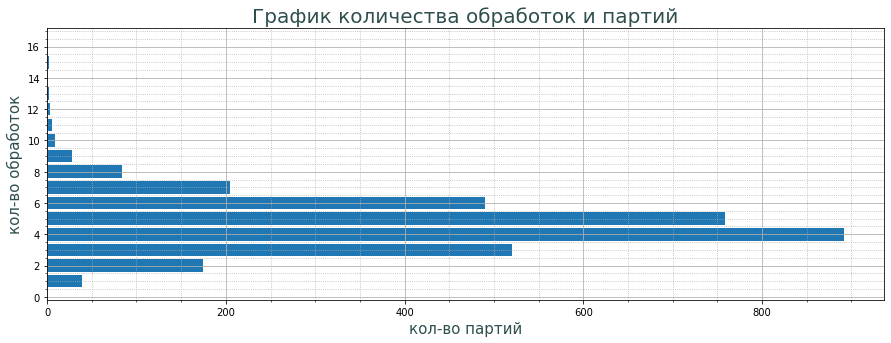

,кол-во обработок,кол-во партий,% кол-ва партий
0,4,892,27.753578
1,5,759,23.615432
2,3,520,16.179216
3,6,490,15.245800
4,7,205,6.378345
5,2,174,5.413815
6,8,84,2.613566
7,1,39,1.213441
8,9,28,0.871189
9,10,9,0.280025


In [14]:
# Распределение партий по количеству обработок
df_count = df_arc.groupby('key')['key'].count().value_counts().reset_index()
df_count.columns = ['кол-во обработок', 'кол-во партий']
total_batches = df_count['кол-во партий'].sum()
df_count['% кол-ва партий'] = df_count['кол-во партий'] / total_batches * 100

plt.figure(figsize=(15, 5))
plt.barh(df_count['кол-во обработок'], df_count['кол-во партий'])
plt.xlabel('кол-во партий', fontsize=15, color='DarkSlateGray')
plt.ylabel('кол-во обработок', fontsize=15, color='DarkSlateGray')
plt.title('График количества обработок и партий',
          fontsize=20, color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.show()
df_count

Анализируя данные по количеству обработок и партий на сталелитейном заводе, можно сделать следующие наблюдения:
- Большинство партий (51.37%) прошли 4 или 5 обработок.
- Примерно треть партий (32.75%) прошли 3, 6 или 7 обработок.
- Оставшиеся партии (15.88%) были подвергнуты 2, 8, 9, 10 или более обработкам.
- Партии с 10 и более обработками составляют менее 1% от общего количества партий.

Таким образом, основная часть партий на сталелитейном заводе проходит 4 или 5 обработок, а среднее количество обработок для одной партии : 4.63.

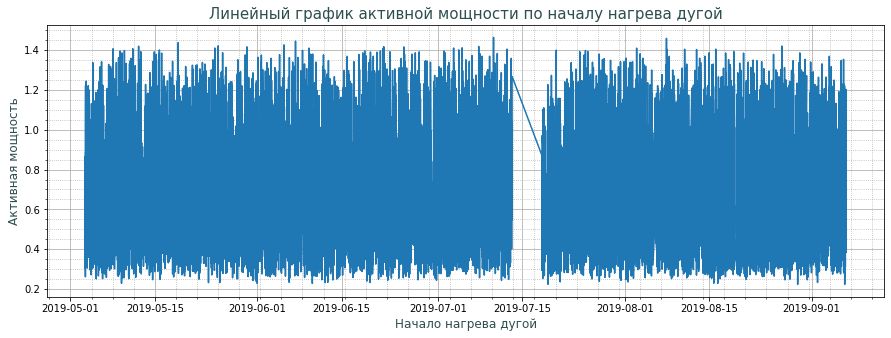

In [15]:
# Посмотрим как мощности распределены по датам
plt.figure(figsize=(15, 5))
plt.plot(df_arc['Начало нагрева дугой'],
         df_arc['Активная мощность'])
plt.title('Линейный график активной мощности по началу нагрева дугой',
          fontsize=15, color='DarkSlateGray')
plt.xlabel('Начало нагрева дугой',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Активная мощность',
           fontsize=12,
           color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.show()

Лицезреем в районе 19-07-15 пустоту

In [16]:
# Посмотрим на пустоту
px.line(df_arc, x='Конец нагрева дугой',
        y='Активная мощность', width=900, height=400).show()
px.line(df_arc, x='Начало нагрева дугой',
        y='Активная мощность', width=900, height=400).show()

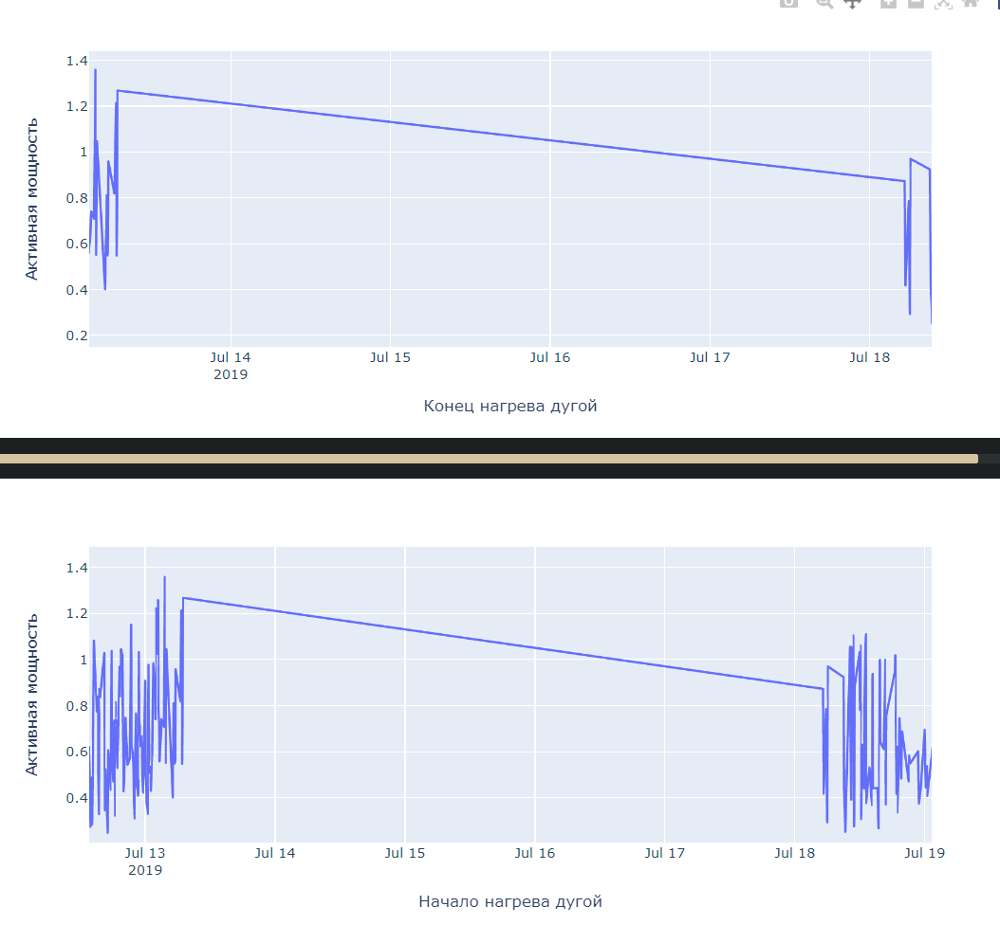

Выделяется промежуток с 13 по 18 июля, в течение которого отсутствуют записи в данных.(Возможно была какая-то неисправность)

In [17]:
# Записи с отрицательной реактивной мощностью
df_arc.query('`Реактивная мощность` < 0')

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,-715.479924


Для корректной замены рассчитаем корреляцию между активной и реактивной мощностью, исключив данное значение. (логика подсказывает, что корреляция будет высокой)

In [19]:
'''
Отфильтруем реактивную мощность меньше нуля и для остальных значений 
вычислим корреляцию между активной и реактивной мощностью
'''
df_arc.query('`Реактивная мощность` > 0')[
    ['Активная мощность', 'Реактивная мощность']].corr().round(2)

,Активная мощность,Реактивная мощность
Активная мощность,1.00,0.97
Реактивная мощность,0.97,1.00


Между активной и реактивной мощностью высокая положительная корреляция.

In [21]:
# Расчитаем реактивную мощность чтоб заменить отрицательное значение
df_arc.loc[df_arc['Реактивная мощность'] < 0,
           'Реактивная мощность'] = df_arc['Активная мощность'] * (df_arc.query('`Реактивная мощность` > 0')['Реактивная мощность'] /
                                                                   df_arc.query('`Реактивная мощность` > 0')['Активная мощность']).mean().round(6)

In [22]:
px.line(df_arc, x='Конец нагрева дугой',
        y='Реактивная мощность', width=900, height=400).show()
px.line(df_arc, x='Начало нагрева дугой',
        y='Реактивная мощность', width=900, height=400).show()

Теперь явно выбивающихся из общей картины значений нет.

Проверим это утверждение.

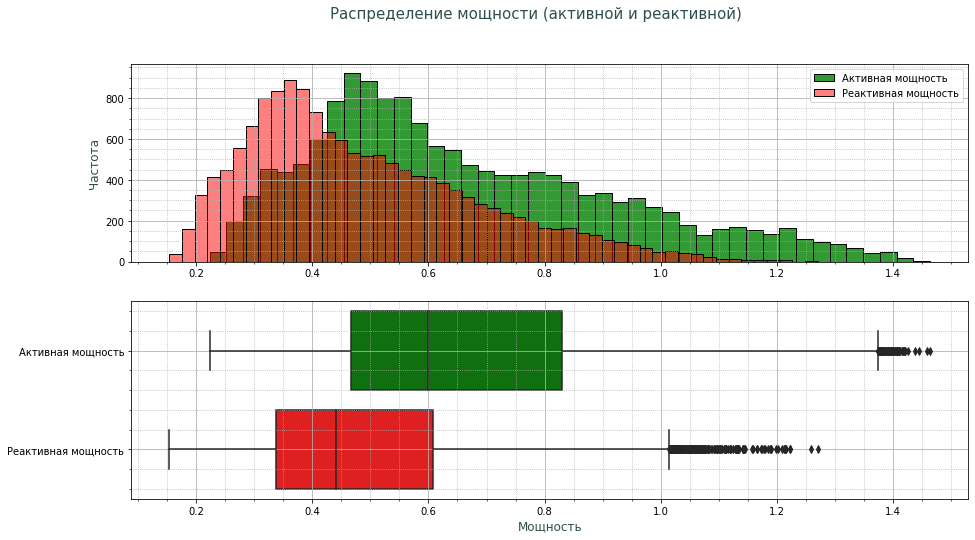

In [23]:
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'Активной мощности'
sns.histplot(data=df_arc['Активная мощность'],
             color='green', alpha=0.8, label='Активная мощность')
# Гистограмма для 'Реактивной мощности'
sns.histplot(data=df_arc['Реактивная мощность'],
             color='red', alpha=0.5, label='Реактивная мощность')

plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота', fontsize=12, color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'Активной мощности' и 'Реактивной мощности'
sns.boxplot(data=df_arc[['Активная мощность', 'Реактивная мощность']],
            orient='horizontal', palette=['green', 'red'])

plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.xlabel('Мощность', fontsize=12, color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение мощности (активной и реактивной)',
             fontsize=15, color='DarkSlateGray')
plt.show()

Действительно, аномалий не наблюдается.

Время окончания процесса должно быть больше времени начала, проверим это условие.

In [24]:
(df_arc['Конец нагрева дугой'] - df_arc['Начало нагрева дугой']).describe()

count                        14876
mean     0 days 00:02:51.670946490
std      0 days 00:01:38.186802680
min                0 days 00:00:11
25%                0 days 00:01:47
50%                0 days 00:02:27
75%                0 days 00:03:34
max                0 days 00:15:07
dtype: object

Процесс длится около 3,5 минут, минимальная продолжительность обработки составляет 11 секунд, максимальная - чуть больше 15 минут.

Нам стало известно,что мощности (активная и реактивная) измерены в одинаковых величинах.

Помимо активной и реактивной мощности в электротехнике широко используется понятие полной мощности. Активная, реактивная и полная мощности связаны следующим соотношением:
$$S=\sqrt{P^2+Q^2}$$
Где:
- $S$ — полная мощность;
- $P$ — активная мощность;
- $Q$ — реактивная мощность.

In [25]:
# Добавим столбец `Полная мощность`
df_arc['Полная мощность'] = np.sqrt(
    df_arc['Активная мощность']**2 + df_arc['Реактивная мощность']**2)

Мы можем вычеслить продолжительность дуги в секундах (разность времени окончания дуги и времени ее начала) и умножив на полную мощность получить потребляемую энергию.

In [26]:
# Вычесляем продолжительность дуги
df_arc['Продолжительность дуги'] = (
    df_arc['Конец нагрева дугой'] - df_arc['Начало нагрева дугой']).astype('timedelta64[s]')
# Вычесляем количество потребляемой энергии
df_arc['Потребляемая энергия'] = df_arc['Полная мощность'] * \
    df_arc['Продолжительность дуги']

In [27]:
df_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность,Продолжительность дуги,Потребляемая энергия
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,0.371123,228.0,84.616003
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,0.902319,185.0,166.928978
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460,0.722536,172.0,124.276277
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979,0.642824,365.0,234.630603
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691,1.079934,148.0,159.830252
...,...,...,...,...,...,...,...,...
14871,3241,2019-09-06 16:49:05,2019-09-06 16:51:42,0.439735,0.299579,0.532085,157.0,83.537345
14872,3241,2019-09-06 16:55:11,2019-09-06 16:58:11,0.646498,0.458240,0.792429,180.0,142.637202
14873,3241,2019-09-06 17:06:48,2019-09-06 17:09:52,1.039726,0.769302,1.293389,184.0,237.983620
14874,3241,2019-09-06 17:21:58,2019-09-06 17:22:55,0.530267,0.361543,0.641792,57.0,36.582120


Агрегируем полученные данные по ключу. Оставим на данном этапе временную составляющую обработки электродами, взяв начальное время и конечное время обработки, добавим столбец с общим количеством этапов обработки.

In [28]:
agg_func_arc = {
    'key': 'count',
    'Начало нагрева дугой': 'first',
    'Конец нагрева дугой': 'last',
    'Активная мощность': 'sum',
    'Реактивная мощность': 'sum',
    'Полная мощность': 'sum',
    'Продолжительность дуги': 'sum',
    'Потребляемая энергия': 'sum'
}

In [29]:
df_arc_key = df_arc.groupby('key').agg(agg_func_arc).rename(columns={'key':'количество этапов обработки'})
df_arc_key

,количество этапов обработки,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность,Продолжительность дуги,Потребляемая энергия
key,,,,,,,,
1,5,2019-05-03 11:02:14,2019-05-03 11:28:37,3.036730,2.142821,3.718736,1098.0,770.282114
2,4,2019-05-03 11:34:14,2019-05-03 11:53:18,2.139408,1.453357,2.588349,811.0,481.760005
3,5,2019-05-03 12:06:54,2019-05-03 12:32:19,4.063641,2.937457,5.019223,655.0,722.837668
4,4,2019-05-03 12:39:37,2019-05-03 12:57:50,2.706489,2.056992,3.400038,741.0,683.455597
5,4,2019-05-03 13:11:13,2019-05-03 13:33:55,2.252950,1.687991,2.816980,869.0,512.169934
...,...,...,...,...,...,...,...,...
3237,5,2019-09-06 11:31:25,2019-09-06 11:53:55,2.541872,2.025417,3.250657,909.0,630.503534
3238,3,2019-09-06 12:16:25,2019-09-06 12:31:35,1.374821,1.038103,1.723937,546.0,286.052252
3239,8,2019-09-06 14:17:00,2019-09-06 15:05:50,4.848005,3.541541,6.014480,1216.0,941.538764


In [30]:
# Приведём таблицу к общепринятому виду
df_arc_key.columns = ['count_arc', 'start_arc', 'end_arc', 'active_power',
                      'reactive_power', 'apparent_power', 'arc_duration', 'energy_consumption']
df_arc_key

,count_arc,start_arc,end_arc,active_power,reactive_power,apparent_power,arc_duration,energy_consumption
key,,,,,,,,
1,5,2019-05-03 11:02:14,2019-05-03 11:28:37,3.036730,2.142821,3.718736,1098.0,770.282114
2,4,2019-05-03 11:34:14,2019-05-03 11:53:18,2.139408,1.453357,2.588349,811.0,481.760005
3,5,2019-05-03 12:06:54,2019-05-03 12:32:19,4.063641,2.937457,5.019223,655.0,722.837668
4,4,2019-05-03 12:39:37,2019-05-03 12:57:50,2.706489,2.056992,3.400038,741.0,683.455597
5,4,2019-05-03 13:11:13,2019-05-03 13:33:55,2.252950,1.687991,2.816980,869.0,512.169934
...,...,...,...,...,...,...,...,...
3237,5,2019-09-06 11:31:25,2019-09-06 11:53:55,2.541872,2.025417,3.250657,909.0,630.503534
3238,3,2019-09-06 12:16:25,2019-09-06 12:31:35,1.374821,1.038103,1.723937,546.0,286.052252
3239,8,2019-09-06 14:17:00,2019-09-06 15:05:50,4.848005,3.541541,6.014480,1216.0,941.538764


### `df_bulk` — данные о подаче сыпучих материалов (объём)

Проверим столбец `key` на уникальность значений и установим в качестве индекса датафрейма.

In [31]:
# Проверим столбец `key` на уникальность значений
df_bulk['key'].duplicated().sum()

0

In [32]:
# Столбец `key` установим в качестве индекса датафрейма
df_bulk = df_bulk.set_index('key')

In [33]:
# Сводная статистика для всех столбцов в `df_bulk`
df_bulk.describe()

,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Объём подачи сыпучих материалов различается в зависимости от партии. Для `Bulk 8` только одна партия была зарегистрирована, для `Bulk 14` - `2806`.

Средние значения объёма подачи сыпучих материалов варьируются от `39.24` до `305.6`.

Стандартное отклонение объёма подачи сыпучих материалов находится в диапазоне от `18.28` до `191.02`, что говорит о разбросе данных внутри каждой партии.

Минимальные значения объёма подачи сыпучих материалов составляют от `6` до `49`, а максимальные значения — от `185` до `772`, что указывает на значительную разницу между минимальными и максимальными значениями внутри каждой партии.

Медианные значения объёма подачи сыпучих материалов колеблются от `31` до `298`.

Значения в первом квартиле (`25%`) варьируются от `27` до `406`, а в третьем квартиле (`75%`) — от `46` до `205`, что указывает на наличие большого разброса данных и значительные отличия между нижними и верхними квартилями.

В целом, данные о подаче сыпучих материалов (объем) показывают значительную вариабельность внутри каждой партии и различия между партиями, что может быть связано с широким ассортиментом выпускаемой продукции (различными условиями производства и требованиями процесса).

In [34]:
# Посмотрим на уникальную запись с добавлением `Bulk 8`
df_bulk[df_bulk['Bulk 8'].notna()]

,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
key,,,,,,,,,,,,,,,
1786,NaN,NaN,123.0,NaN,NaN,NaN,NaN,49.0,147.0,NaN,NaN,NaN,NaN,NaN,NaN


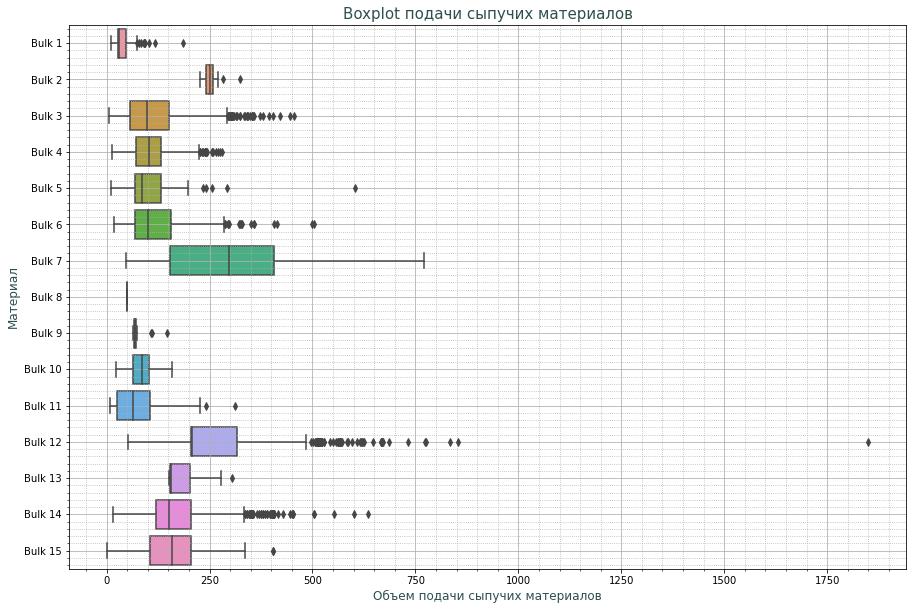

In [35]:
# Визуализируем распределения по колонкам `df_bulk`
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_bulk, orient='horizontal')

plt.xlabel('Объем подачи сыпучих материалов',
           fontsize=12, color='DarkSlateGray')
plt.ylabel('Материал', fontsize=12, color='DarkSlateGray')
plt.title('Boxplot подачи сыпучих материалов',
          fontsize=15, color='DarkSlateGray')

plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)

Всё выглядит хорошо, но у `Bulk 5` и `Bulk 12` есть еденичные случаи, когда значения сильно выбиваются из общей картины.

Сделаем график с возможностью масштабирования. (чтоб можно было визуально оценить интересующие нас моменты)

In [36]:
fig = px.box(df_bulk)
fig.update_layout(
    width=800, 
    height=500,
    xaxis=dict(title='Материал'),
    yaxis=dict(title='Объем подачи сыпучих материалов'),
    title='Boxplot подачи сыпучих материалов'
)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

fig.show()

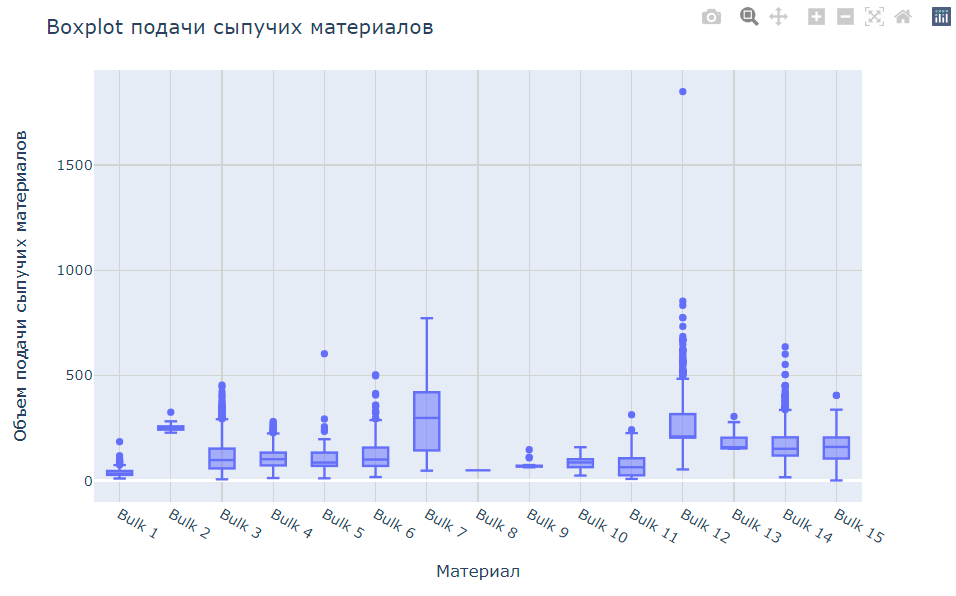

In [37]:
# Посмотрим уникальные значения по колонкам `df_bulk`
get_unique_sorted(df_bulk)

Уникальные значения столбца 'Bulk 1':
[ 10.  16.  19.  21.  22.  24.  26.  27.  28.  29.  30.  31.  32.  33.
  34.  36.  37.  38.  39.  41.  43.  44.  46.  47.  48.  50.  51.  52.
  54.  58.  60.  62.  63.  65.  67.  69.  73.  74.  75.  78.  83.  90.
  92.  94. 104. 118. 185.  nan]
Количество уникальных значений: 48
****************************************************************************************************
Уникальные значения столбца 'Bulk 2':
[228. 232. 233. 236. 242. 246. 247. 248. 249. 254. 257. 258. 270. 282.
 325.  nan]
Количество уникальных значений: 16
****************************************************************************************************
Уникальные значения столбца 'Bulk 3':
[  6.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.  29.
  30.  31.  32.  34.  36.  37.  38.  39.  40.  41.  42.  43.  44.  45.
  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.  57.  58.  59.
  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.  70.  71.  72.  73.
  

Похоже есть моменты, которые надо уточнить и согласовать с представителем заказчика (Список вопросов в конце предобработки данных)

Заменим пропуски на нули. Найдем сумму всех значений объема для каждой партии в качестве дополнительного признака (будем знать общий общем добавок в сплав) и приведём таблицу к общепринятому виду.

In [38]:
# Заполним значения NaN в DataFrame нулями
df_bulk = df_bulk.fillna(0)
# Рассчитаем сумму каждой строки и создим новый столбец с названием "bulk_sum"
df_bulk['bulk_sum'] = df_bulk.sum(axis=1)
# Заменим пробелы в названиях столбцов на нижнее подчеркивание и приведем их к нижнему регистру
df_bulk.columns = [x.replace(' ','_').lower() for x in  df_bulk.columns]
df_bulk

,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,bulk_sum
key,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,553.0
2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,582.0
3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,544.0
4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,595.0
5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,584.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,0.0,0.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,0.0,130.0,206.0,758.0
3238,0.0,0.0,126.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,254.0,0.0,108.0,106.0,594.0
3239,0.0,0.0,0.0,0.0,0.0,114.0,0.0,0.0,0.0,0.0,0.0,158.0,0.0,270.0,88.0,630.0


### `df_bulk_time` — данные о подаче сыпучих материалов (время).

In [39]:
# Проверим столбец `key` на уникальность значений
df_bulk_time['key'].duplicated().sum()

0

In [40]:
# Столбец `key` установим в качестве индекса датафрейма
df_bulk_time = df_bulk_time.set_index('key')

In [41]:
# Посмотрим уникальные значения по колонкам `df_bulk_time`
get_unique_sorted(df_bulk_time)

Уникальные значения столбца 'Bulk 1':
['2019-05-03T17:42:46.000000000' '2019-05-05T16:26:52.000000000'
 '2019-05-05T17:18:36.000000000' '2019-05-05T18:32:50.000000000'
 '2019-05-05T19:34:07.000000000' '2019-05-05T20:36:08.000000000'
 '2019-05-05T21:41:07.000000000' '2019-05-05T22:07:40.000000000'
 '2019-05-06T03:19:35.000000000' '2019-05-07T17:37:05.000000000'
 '2019-05-07T22:54:29.000000000' '2019-05-08T01:46:58.000000000'
 '2019-05-08T01:53:35.000000000' '2019-05-08T09:50:17.000000000'
 '2019-05-08T14:10:47.000000000' '2019-05-08T18:38:10.000000000'
 '2019-05-08T19:41:48.000000000' '2019-05-08T20:35:02.000000000'
 '2019-05-09T00:10:01.000000000' '2019-05-09T14:14:29.000000000'
 '2019-05-11T03:53:30.000000000' '2019-05-11T03:58:38.000000000'
 '2019-05-11T06:21:38.000000000' '2019-05-11T07:01:15.000000000'
 '2019-05-11T22:08:02.000000000' '2019-05-11T23:59:58.000000000'
 '2019-05-12T04:52:28.000000000' '2019-05-13T03:00:10.000000000'
 '2019-05-13T04:58:40.000000000' '2019-05-13T09:44:1

In [42]:
df_bulk_time

,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
key,,,,,,,,,,,,,,,
1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:24:31,NaT,2019-05-03 11:14:50,2019-05-03 11:10:43
2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:53:30,NaT,2019-05-03 11:48:37,2019-05-03 11:44:39
3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:27:13,NaT,2019-05-03 12:21:01,2019-05-03 12:16:16
4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:58:00,NaT,2019-05-03 12:51:11,2019-05-03 12:46:36
5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,2019-05-03 13:34:12,2019-05-03 13:30:47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,NaT,NaT,2019-09-06 11:54:15,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 11:49:45,NaT,2019-09-06 11:45:22,2019-09-06 11:40:06
3238,NaT,NaT,2019-09-06 12:26:52,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 12:18:35,NaT,2019-09-06 12:31:49,2019-09-06 12:26:52
3239,NaT,NaT,NaT,NaT,NaT,2019-09-06 15:06:00,NaT,NaT,NaT,NaT,NaT,2019-09-06 15:01:44,NaT,2019-09-06 14:58:15,2019-09-06 14:48:06


В таком виде нам эти данные мало о чем говорят.

Попробуем расчитать длительность процесса подачи сыпучих материалов.

In [43]:
df_bulk_time['start_time_bulk'] = df_bulk_time.min(axis=1)
df_bulk_time['finish_time_bulk'] = df_bulk_time.max(axis=1)
df_bulk_time['duration_bulk'] = (
    df_bulk_time['finish_time_bulk'] - df_bulk_time['start_time_bulk']).astype('timedelta64[s]')

In [44]:
df_bulk_time

,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,start_time_bulk,finish_time_bulk,duration_bulk
key,,,,,,,,,,,,,,,,,,
1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:24:31,NaT,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:10:43,2019-05-03 11:28:48,1085.0
2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:53:30,NaT,2019-05-03 11:48:37,2019-05-03 11:44:39,2019-05-03 11:36:50,2019-05-03 11:53:30,1000.0
3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:27:13,NaT,2019-05-03 12:21:01,2019-05-03 12:16:16,2019-05-03 12:16:16,2019-05-03 12:32:39,983.0
4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:58:00,NaT,2019-05-03 12:51:11,2019-05-03 12:46:36,2019-05-03 12:43:22,2019-05-03 12:58:00,878.0
5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,2019-05-03 13:34:12,2019-05-03 13:30:47,2019-05-03 13:30:47,2019-05-03 13:34:12,205.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,NaT,NaT,2019-09-06 11:54:15,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 11:49:45,NaT,2019-09-06 11:45:22,2019-09-06 11:40:06,2019-09-06 11:40:06,2019-09-06 11:54:15,849.0
3238,NaT,NaT,2019-09-06 12:26:52,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 12:18:35,NaT,2019-09-06 12:31:49,2019-09-06 12:26:52,2019-09-06 12:18:35,2019-09-06 12:31:49,794.0
3239,NaT,NaT,NaT,NaT,NaT,2019-09-06 15:06:00,NaT,NaT,NaT,NaT,NaT,2019-09-06 15:01:44,NaT,2019-09-06 14:58:15,2019-09-06 14:48:06,2019-09-06 14:48:06,2019-09-06 15:06:00,1074.0


Удалим `Bulk 1` - `Bulk 15`. Получится табличка похожая на `df_arc`.

In [45]:
df_bulk_time = df_bulk_time[['start_time_bulk', 'finish_time_bulk','duration_bulk']]
df_bulk_time

,start_time_bulk,finish_time_bulk,duration_bulk
key,,,
1,2019-05-03 11:10:43,2019-05-03 11:28:48,1085.0
2,2019-05-03 11:36:50,2019-05-03 11:53:30,1000.0
3,2019-05-03 12:16:16,2019-05-03 12:32:39,983.0
4,2019-05-03 12:43:22,2019-05-03 12:58:00,878.0
5,2019-05-03 13:30:47,2019-05-03 13:34:12,205.0
...,...,...,...
3237,2019-09-06 11:40:06,2019-09-06 11:54:15,849.0
3238,2019-09-06 12:18:35,2019-09-06 12:31:49,794.0
3239,2019-09-06 14:48:06,2019-09-06 15:06:00,1074.0


In [46]:
# Сводная статистика для всех столбцов в `df_bulk_time`
df_bulk_time.describe(include='all', datetime_is_numeric=True)

,start_time_bulk,finish_time_bulk,duration_bulk
count,3129,3129,3129.000000
mean,2019-07-05 20:31:19.313518336,2019-07-05 20:47:24.220198144,964.906679
min,2019-05-03 11:10:43,2019-05-03 11:28:48,0.000000
25%,2019-06-04 09:12:47,2019-06-04 09:22:40,485.000000
50%,2019-07-03 04:58:44,2019-07-03 05:17:25,877.000000
75%,2019-08-08 00:03:27,2019-08-08 00:23:14,1311.000000
max,2019-09-06 17:23:15,2019-09-06 17:26:33,13683.000000
std,NaN,NaN,798.088025


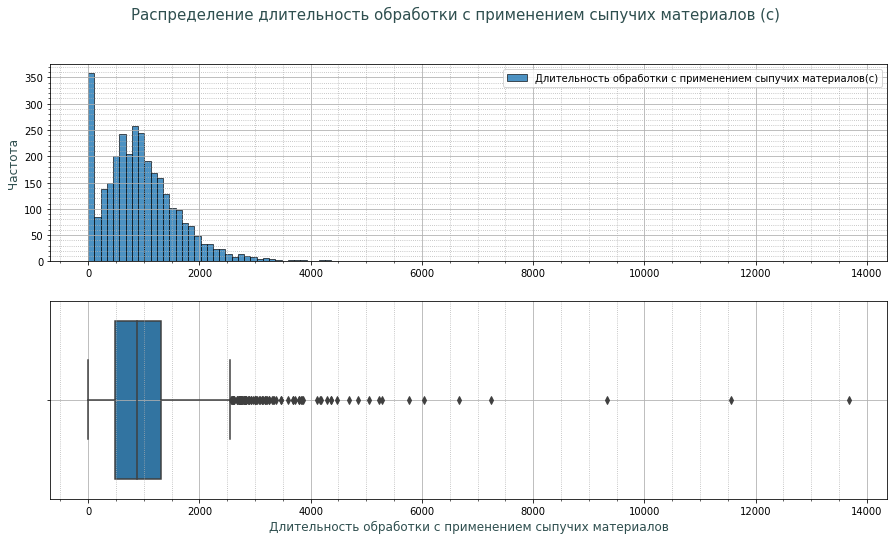

In [47]:
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'duration_bulk'
sns.histplot(data=df_bulk_time['duration_bulk'],
             alpha=0.8,
             label='Длительность обработки с применением сыпучих материалов(с)')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'duration_bulk' 
sns.boxplot(data=df_bulk_time,
            x='duration_bulk',
            orient='horizontal')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Длительность обработки с применением сыпучих материалов',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение длительность обработки с применением сыпучих материалов (с)',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

In [48]:
# Посмотрим уникальные значения по колонкам `df_bulk_time`
get_unique_sorted(df_bulk_time)

Уникальные значения столбца 'start_time_bulk':
['2019-05-03T11:10:43.000000000' '2019-05-03T11:36:50.000000000'
 '2019-05-03T12:16:16.000000000' ... '2019-09-06T14:48:06.000000000'
 '2019-09-06T16:01:34.000000000' '2019-09-06T17:23:15.000000000']
Количество уникальных значений: 3129
****************************************************************************************************
Уникальные значения столбца 'finish_time_bulk':
['2019-05-03T11:28:48.000000000' '2019-05-03T11:53:30.000000000'
 '2019-05-03T12:32:39.000000000' ... '2019-09-06T15:06:00.000000000'
 '2019-09-06T16:24:28.000000000' '2019-09-06T17:26:33.000000000']
Количество уникальных значений: 3129
****************************************************************************************************
Уникальные значения столбца 'duration_bulk':
[    0.    82.   123. ...  9336. 11552. 13683.]
Количество уникальных значений: 1528
***************************************************************************************************

А теперь без учета нулевых значений.

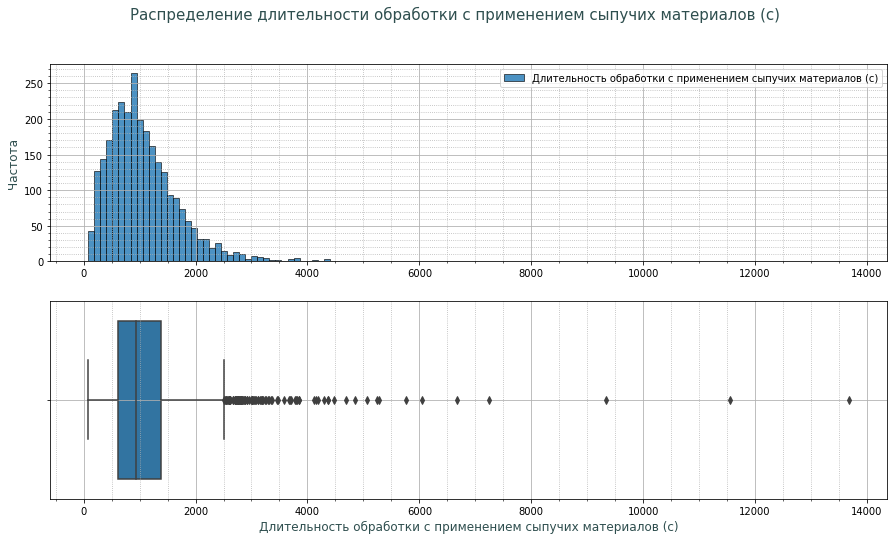

In [49]:
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
sns.histplot(data=df_bulk_time[df_bulk_time['duration_bulk'] != 0]['duration_bulk'],
             alpha=0.8,
             label='Длительность обработки с применением сыпучих материалов (с)')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'duration_bulk' 
sns.boxplot(data=df_bulk_time[df_bulk_time['duration_bulk'] != 0],
            x='duration_bulk',
            orient='horizontal')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Длительность обработки с применением сыпучих материалов (с)',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение длительности обработки с применением сыпучих материалов (с)',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

Аномальных значений не обнаружено.

Время добавления сыпучих материалов находится в тех же промежутках, что и ранее рассмотренные данные по обработке стали. Максимальная длительность обработки одной партии составляет 13683 с (около 4 часов).

### `df_gas` — данные о продувке сплава газом

In [50]:
# Проверим столбец `key` на уникальность значений
df_gas['key'].duplicated().sum()

0

In [51]:
# Столбец `key` установим в качестве индекса датафрейма
df_gas = df_gas.set_index('key')

In [52]:
# Посмотрим уникальные значения по колонкам `df_gas`
get_unique_sorted(df_gas)

Уникальные значения столбца 'Газ 1':
[8.39852910e-03 1.66956024e-02 2.63028954e-01 ... 5.21423726e+01
 6.09356892e+01 7.79950397e+01]
Количество уникальных значений: 3239
****************************************************************************************************


In [53]:
df_gas

,Газ 1
key,
1,29.749986
2,12.555561
3,28.554793
4,18.841219
5,5.413692
...,...
3237,5.543905
3238,6.745669
3239,16.023518


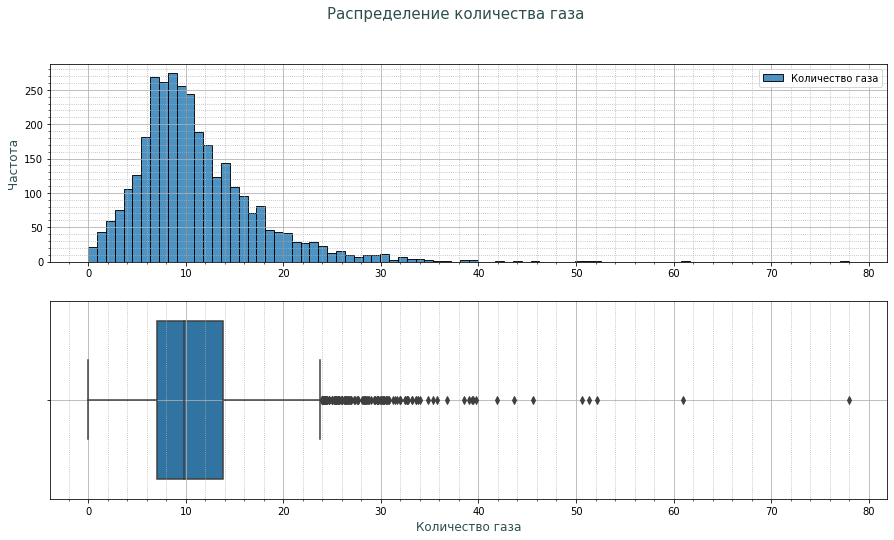

,Газ 1
count,3239.000000
mean,11.002062
std,6.220327
min,0.008399
25%,7.043089
50%,9.836267
75%,13.769915
max,77.995040


In [54]:
# Распределение количества газа
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'Газ 1'
sns.histplot(data=df_gas['Газ 1'],
             alpha=0.8,
             label='Количество газа')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'Газ 1'
sns.boxplot(data=df_gas,
            x='Газ 1',
            orient='horizontal')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Количество газа',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение количества газа',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

# Сводная статистика для всех столбцов в `df_gas`
df_gas.describe()

Аномальных значений не обнаружено.

In [55]:
# Приведём таблицу к общепринятому виду
df_gas = df_gas.rename(columns={'Газ 1':'gas_quantities'})
df_gas

,gas_quantities
key,
1,29.749986
2,12.555561
3,28.554793
4,18.841219
5,5.413692
...,...
3237,5.543905
3238,6.745669
3239,16.023518


Датасет содержит `3239` наблюдений (количество партий), а данные об электродах - `3214`. Среднее значение количества газа составляет примерно `11`. Стандартное отклонение равно приблизительно `6.22`, что указывает на относительно высокую вариацию значений. Минимальное значение количества газа составляет `0.008399`, а максимальное значение равно `77.995040`. Первый квартиль (25%) равен `7.043089`, медиана (50%) составляет `9.836267`, а третий квартиль (75%) равен `13.769915`.

Исходя из этой информации можно сделать вывод, что измерения количества газа имеют широкий диапазон значений с примерным средним значением `11.002062`. Наличие относительно высокого стандартного отклонения указывает на значительную изменчивость значений количества газа. Партий металла обработанных газом больше, чем расплавленных электродами. (Возможно особенность технологии)

### `df_temp` — результаты измерения температуры.

In [56]:
# Проверим столбец `key` на уникальность значений
df_temp['key'].duplicated().sum()

14876

In [57]:
# Посмотрим уникальные значения по колонкам `df_temp`
get_unique_sorted(df_temp)

Уникальные значения столбца 'key':
[   1    2    3 ... 3239 3240 3241]
Количество уникальных значений: 3216
****************************************************************************************************
Уникальные значения столбца 'Время замера':
['2019-05-03T11:02:04.000000000' '2019-05-03T11:07:18.000000000'
 '2019-05-03T11:11:34.000000000' ... '2019-09-06T17:21:48.000000000'
 '2019-09-06T17:24:44.000000000' '2019-09-06T17:30:05.000000000']
Количество уникальных значений: 18092
****************************************************************************************************
Уникальные значения столбца 'Температура':
[1191. 1204. 1208. 1218. 1227. 1515. 1519. 1520. 1521. 1522. 1525. 1526.
 1527. 1528. 1529. 1530. 1531. 1532. 1533. 1534. 1535. 1536. 1537. 1538.
 1539. 1540. 1541. 1542. 1543. 1544. 1545. 1546. 1547. 1548. 1549. 1550.
 1551. 1552. 1553. 1554. 1555. 1556. 1557. 1558. 1559. 1560. 1561. 1562.
 1563. 1564. 1565. 1566. 1567. 1568. 1569. 1570. 1571. 1572. 1573. 1574.


In [58]:
# Сводная статистика для всех столбцов в `df_temp`
df_temp.describe(include='all', datetime_is_numeric=True)

,key,Время замера,Температура
count,18092.000000,18092,14665.000000
mean,1616.460977,2019-07-05 13:36:58.791620608,1590.722741
min,1.000000,2019-05-03 11:02:04,1191.000000
25%,807.750000,2019-06-04 00:35:01.249999872,1580.000000
50%,1618.000000,2019-07-03 02:11:48,1590.000000
75%,2429.000000,2019-08-07 23:10:05.249999872,1599.000000
max,3241.000000,2019-09-06 17:30:05,1705.000000
std,934.641385,NaN,20.394381


Время измерения температуры находится в тех же промежутках, что и ранее рассмотренные данные по обработке стали. 

Количество партий `3216` (количество уникальных записей в столбце `key`) не соотносится ни с одной из предыдущих таблиц, но номера партий доходят до `3241` как в данных о продувке сплава газом (`df_gas`). Количество дубликатов в столбце с номером партии - `14876`из `18092` строк.

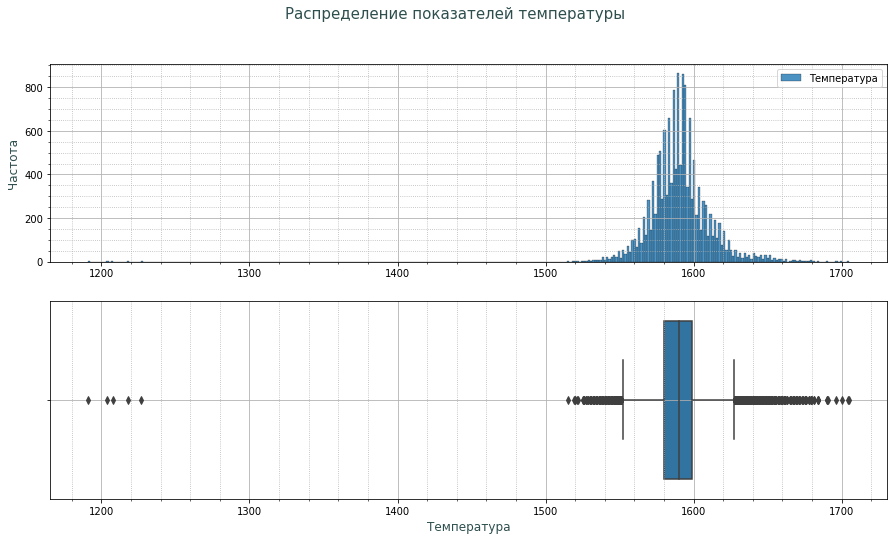

In [59]:
# Распределение количества газа
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'Температура'
sns.histplot(data=df_temp['Температура'],
             alpha=0.8,
             label='Температура')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'Температура'
sns.boxplot(data=df_temp,
            x='Температура',
            orient='horizontal')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Температура',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение показателей температуры',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

Видим пять значений температур, которые выбиваются из общей массы: `1191`, `1204`, `1208`, `1218`, `1227`.
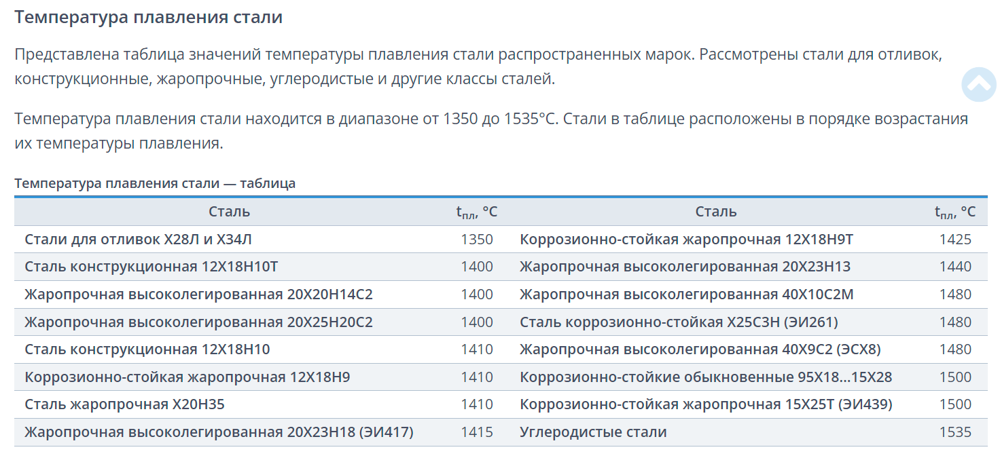
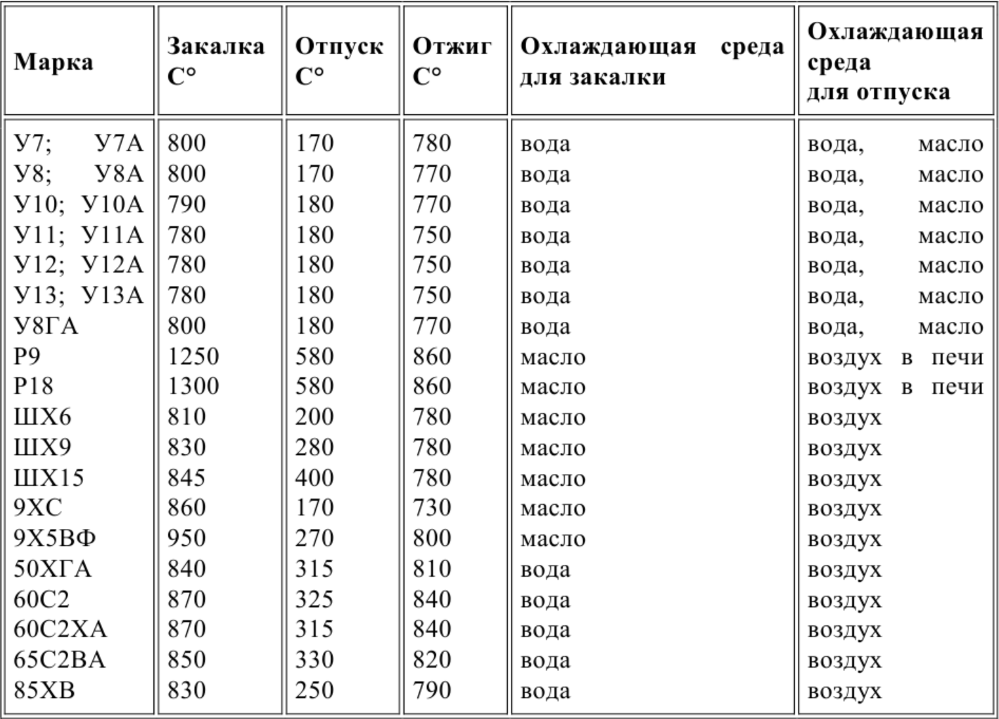
Такие температуры более свойствены для закалки.

Остальные показатили в норме.

In [60]:
df_temp

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
...,...,...,...
18087,3241,2019-09-06 16:55:01,NaN
18088,3241,2019-09-06 17:06:38,NaN
18089,3241,2019-09-06 17:21:48,NaN
18090,3241,2019-09-06 17:24:44,NaN


In [61]:
# Распределение партий по количеству замеров температур
df_count = df_temp.groupby('key')['key'].count().value_counts().reset_index()
df_count.columns = ['кол-во замеров', 'кол-во партий']
total_batches = df_count['кол-во партий'].sum()
df_count['% кол-ва партий'] = df_count['кол-во партий'] / total_batches * 100
df_count

,кол-во замеров,кол-во партий,% кол-ва партий
0,5,892,27.736318
1,6,759,23.600746
2,4,520,16.169154
3,7,490,15.236318
4,8,205,6.374378
5,3,174,5.410448
6,9,84,2.611940
7,2,39,1.212687
8,10,28,0.870647
9,11,9,0.279851


Большинство партий имели `6` или `5` замеров температур (соответственно `27.74%` и `23.6%` всех партий). Это может говорить о том, что такое количество замеров является наиболее распространенным или оптимальным для обеспечения приемлемых результатов.

Партии с количеством замеров `4` и `3` составляют значительную долю (соответственно `16.17%` и `5.41%`). Вероятно, это связано с особенностями процесса производства или проведения замеров температур.

Партии с количеством замеров `7` и `8` составляют значительную долю (соответственно `15.24%` и `6.37%`).

Партии, в которых делали более `8` замеров, составляют меньшую долю (всего около `4%` всех партий). Возможно, такое количество замеров требуется только в особых случаях или для уточнения данных.

Партии с количеством замеров `1` или выше `11` составляют незначительную долю (всего `0.31%` всех партий). Это может свидетельствовать о случайных или ошибочных замерах в этих партиях.

Таким образом, стандартное количество замеров температур в партии составляет 5-6 и оно является наиболее распространенным. Все значения за пределами этого диапазона можно считать исключениями или особыми случаями.

In [62]:
# Удаляем строки, где количество замеров меньше двух и температура NaN
df_temp = df_temp.dropna(subset=['Температура'])
df_temp = df_temp.groupby('key').filter(lambda x: len(x) >= 2)
df_temp

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
...,...,...,...
13921,2499,2019-08-10 13:33:21,1569.0
13922,2499,2019-08-10 13:41:34,1604.0
13923,2499,2019-08-10 13:46:28,1593.0
13924,2499,2019-08-10 13:54:56,1588.0


Есть информация о том, что важна температура первого и последнего замера, по этому создадим датасет с необходимыми нам данными на основе имеющегося.

In [63]:
# Группируем данные по key
grouped_data = df_temp.groupby('key')

# Собираем данные по требуемым колонкам
df_result_temp = pd.DataFrame()
df_result_temp['time_first_measurement'] = grouped_data['Время замера'].first()
df_result_temp['time_last_measurement'] = grouped_data['Время замера'].last()
df_result_temp['temperature_first_measurement'] = grouped_data['Температура'].first()
df_result_temp['temperature_last_measurement'] = grouped_data['Температура'].last()
df_result_temp['time_between_measurements'] = (df_result_temp['time_last_measurement'] - \
    df_result_temp['time_first_measurement']).astype('timedelta64[s]')

# Выводим результат
df_result_temp

,time_first_measurement,time_last_measurement,temperature_first_measurement,temperature_last_measurement,time_between_measurements
key,,,,,
1,2019-05-03 11:02:04,2019-05-03 11:30:38,1571.0,1613.0,1714.0
2,2019-05-03 11:34:04,2019-05-03 11:55:09,1581.0,1602.0,1265.0
3,2019-05-03 12:06:44,2019-05-03 12:35:57,1596.0,1599.0,1753.0
4,2019-05-03 12:39:27,2019-05-03 12:59:47,1601.0,1625.0,1220.0
5,2019-05-03 13:11:03,2019-05-03 13:36:39,1576.0,1602.0,1536.0
...,...,...,...,...,...
2495,2019-08-10 11:27:47,2019-08-10 11:50:47,1570.0,1591.0,1380.0
2496,2019-08-10 11:56:48,2019-08-10 12:25:13,1554.0,1591.0,1705.0
2497,2019-08-10 12:37:26,2019-08-10 12:53:28,1571.0,1589.0,962.0


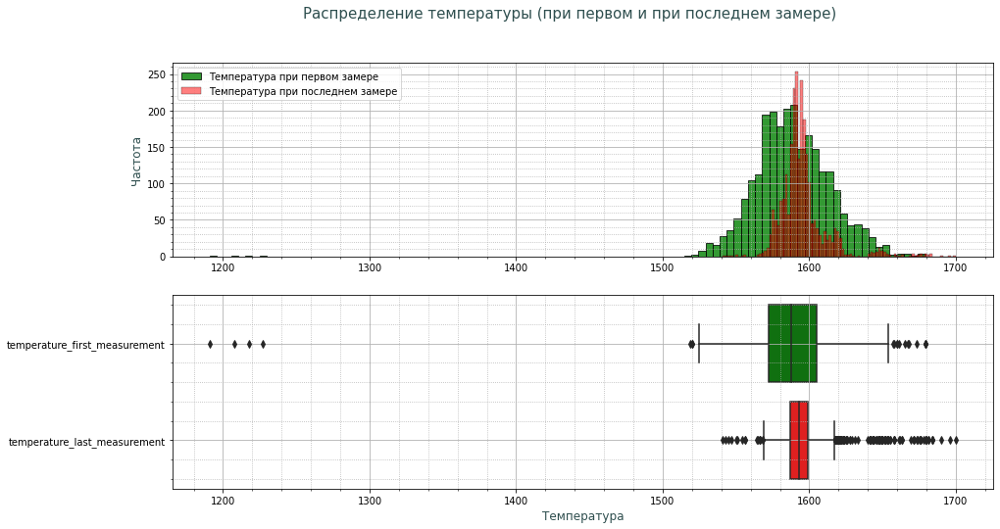

In [64]:
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'temperature_first_measurement'
sns.histplot(data=df_result_temp['temperature_first_measurement'],
             color='green',
             alpha=0.8,
             label='Температура при первом замере')
# Гистограмма для 'temperature_last_measurement'
sns.histplot(data=df_result_temp['temperature_last_measurement'],
             color='red',
             alpha=0.5,
             label='Температура при последнем замере')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'temperature_first_measurement' и 'temperature_last_measurement'
sns.boxplot(data=df_result_temp[['temperature_first_measurement', 'temperature_last_measurement']],
            orient='horizontal',
            palette=['green', 'red'])

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Температура',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение температуры (при первом и при последнем замере)',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

In [65]:
df_result_temp[(df_result_temp['temperature_first_measurement'] < 1300) | (
    df_result_temp['temperature_last_measurement'] < 1300)]

,time_first_measurement,time_last_measurement,temperature_first_measurement,temperature_last_measurement,time_between_measurements
key,,,,,
867,2019-06-06 08:03:39,2019-06-06 08:48:23,1191.0,1599.0,2684.0
1214,2019-06-18 08:01:03,2019-06-18 08:43:56,1208.0,1591.0,2573.0
1619,2019-07-03 02:34:41,2019-07-03 02:43:59,1218.0,1590.0,558.0
2052,2019-07-25 08:49:15,2019-07-25 09:27:03,1227.0,1592.0,2268.0


Вопрос по анамальным температурам остаётся открытым. (Пять значений температур, которые выбиваются из общей массы: 1191, 1204, 1208, 1218, 1227. В чем причина таких показателей? (остыл ковш, неисправность измерительной аппаратуры) Укладываются они в рамки технологии, или это аномалии?
Нужен-ли нагрев (по технологии) выше 1600$^{\circ}$C?)

### `df_wire` — данные о проволочных материалах (объём).

In [66]:
# Проверим столбец `key` на уникальность значений
df_wire['key'].duplicated().sum()

0

In [67]:
# Столбец `key` установим в качестве индекса датафрейма
df_wire = df_wire.set_index('key')

In [68]:
# Сводная статистика для всех столбцов в `df_wire`
df_wire.describe()

,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,100.895853,50.577323,189.482681,57.442841,15.132,48.016974,10.039007,53.625193,34.155752
std,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,126.060483,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


В целом, `Wire 1`, `Wire 2` и `Wire 3` имеют большое количество данных (3055, 1079 и 63 наблюдения соответственно), в то время как количество данных для `Wire 4`- `Wire 9` намного меньше. Различия в средних значениях и стандартных отклонениях между проволоками указывают на разные характеристики и свойства этих материалов.

`Wire 6` использовали только один раз.

In [69]:
# Посмотрим на уникальную запись с добавлением `Wire 5`
df_wire[df_wire['Wire 5'].notna()]

,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
key,,,,,,,,,
2567,18.30192,NaN,96.288193,NaN,15.132,73.307526,NaN,NaN,NaN


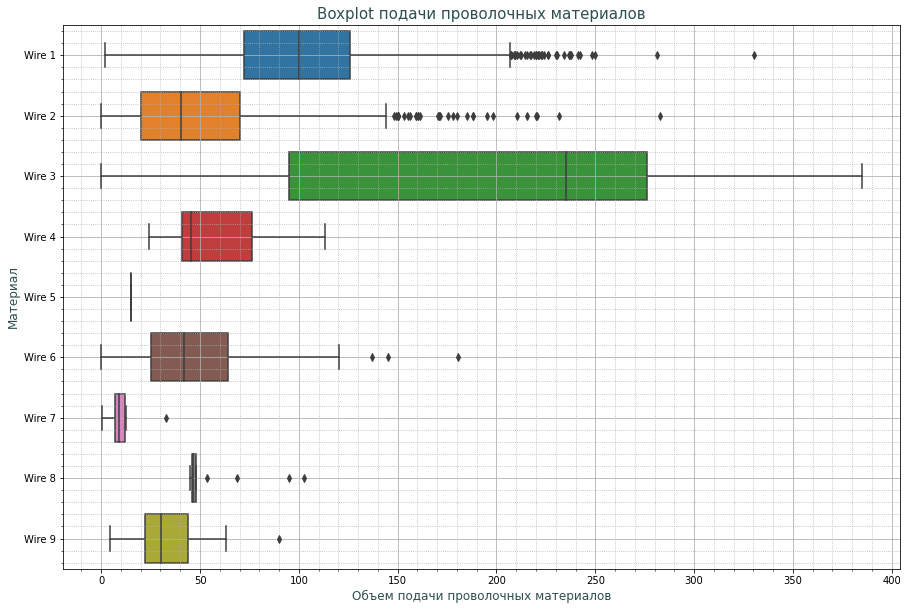

In [70]:
# Визуализируем распределения по колонкам `df_wire`
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_wire,
            orient='horizontal')

plt.xlabel('Объем подачи проволочных материалов',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Материал',
           fontsize=12,
           color='DarkSlateGray')
plt.title('Boxplot подачи проволочных материалов',
          fontsize=15,
          color='DarkSlateGray')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

Всё выглядит хорошо, явных выбросов в объеме проволочных материалов нет.

In [71]:
# Заполним значения NaN в DataFrame нулями
df_wire = df_wire.fillna(0)
# Рассчитаем сумму каждой строки и создим новый столбец с названием `wire_sum`
df_wire['wire_sum'] = df_wire.sum(axis=1)
# Заменим пробелы в названиях столбцов на нижнее подчеркивание и приведем их к нижнему регистру
df_wire.columns = [x.replace(' ','_').lower() for x in  df_wire.columns]
df_wire

,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,wire_sum
key,,,,,,,,,,
1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.059998
2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,96.052315
3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91.160157
4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,89.063515
5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0,98.352796
...,...,...,...,...,...,...,...,...,...,...
3237,38.088959,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.088959
3238,56.128799,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.128799
3239,143.357761,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,143.357761


### `df_wire_time` — данные о проволочных материалах (время).

In [72]:
# Проверим столбец `key` на уникальность значений
df_wire_time['key'].duplicated().sum()

0

In [73]:
# Столбец `key` установим в качестве индекса датафрейма
df_wire_time = df_wire_time.set_index('key')

In [74]:
# Посмотрим уникальные значения по колонкам `df_wire_time`
get_unique_sorted(df_wire_time)

Уникальные значения столбца 'Wire 1':
['2019-05-03T11:06:19.000000000' '2019-05-03T11:36:50.000000000'
 '2019-05-03T12:11:46.000000000' ... '2019-09-06T15:33:55.000000000'
 '2019-09-06T17:10:06.000000000'                           'NaT']
Количество уникальных значений: 3056
****************************************************************************************************
Уникальные значения столбца 'Wire 2':
['2019-05-03T13:15:34.000000000' '2019-05-03T13:48:52.000000000'
 '2019-05-03T15:39:37.000000000' ... '2019-09-06T01:38:22.000000000'
 '2019-09-06T07:35:40.000000000'                           'NaT']
Количество уникальных значений: 1080
****************************************************************************************************
Уникальные значения столбца 'Wire 3':
['2019-05-04T04:34:27.000000000' '2019-05-04T05:41:29.000000000'
 '2019-05-07T15:39:35.000000000' '2019-05-07T17:12:49.000000000'
 '2019-05-07T22:24:56.000000000' '2019-05-07T23:37:44.000000000'
 '2019-05-08T02

In [75]:
df_wire_time

,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
key,,,,,,,,,
1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT
...,...,...,...,...,...,...,...,...,...
3237,2019-09-06 11:33:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3238,2019-09-06 12:18:35,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3239,2019-09-06 14:36:11,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT


В таком виде нам эти данные мало о чем говорят.

Расчитаем длительность процесса подачи проволочных материалов.

In [76]:
df_wire_time['start_time_wire'] = df_wire_time.min(axis=1)
df_wire_time['finish_time_wire'] = df_wire_time.max(axis=1)
df_wire_time['duration_wire'] = (
    df_wire_time['finish_time_wire'] - df_wire_time['start_time_wire']).astype('timedelta64[s]')

In [77]:
df_wire_time

,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9,start_time_wire,finish_time_wire,duration_wire
key,,,,,,,,,,,,
1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:06:19,2019-05-03 11:06:19,0.0
2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:36:50,2019-05-03 11:36:50,0.0
3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:11:46,2019-05-03 12:11:46,0.0
4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:43:22,2019-05-03 12:43:22,0.0
5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:15:34,2019-05-03 13:20:44,310.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3237,2019-09-06 11:33:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 11:33:38,2019-09-06 11:33:38,0.0
3238,2019-09-06 12:18:35,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 12:18:35,2019-09-06 12:18:35,0.0
3239,2019-09-06 14:36:11,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-06 14:36:11,2019-09-06 14:36:11,0.0


Удалим `Wire 1` - `Wire 15`. Получится табличка похожая на df_bulk_time.

In [78]:
df_wire_time = df_wire_time[['start_time_wire', 'finish_time_wire','duration_wire']]
df_wire_time

,start_time_wire,finish_time_wire,duration_wire
key,,,
1,2019-05-03 11:06:19,2019-05-03 11:06:19,0.0
2,2019-05-03 11:36:50,2019-05-03 11:36:50,0.0
3,2019-05-03 12:11:46,2019-05-03 12:11:46,0.0
4,2019-05-03 12:43:22,2019-05-03 12:43:22,0.0
5,2019-05-03 13:15:34,2019-05-03 13:20:44,310.0
...,...,...,...
3237,2019-09-06 11:33:38,2019-09-06 11:33:38,0.0
3238,2019-09-06 12:18:35,2019-09-06 12:18:35,0.0
3239,2019-09-06 14:36:11,2019-09-06 14:36:11,0.0


In [79]:
# Сводная статистика для всех столбцов в `df_wire_time`
df_wire_time.describe(include='all', datetime_is_numeric=True)

,start_time_wire,finish_time_wire,duration_wire
count,3081,3081,3081.000000
mean,2019-07-05 19:30:10.739045632,2019-07-05 19:33:45.258357760,214.519312
min,2019-05-03 11:06:19,2019-05-03 11:06:19,0.000000
25%,2019-06-04 15:15:14,2019-06-04 15:15:14,0.000000
50%,2019-07-03 02:37:20,2019-07-03 02:41:39,0.000000
75%,2019-08-08 02:31:52,2019-08-08 02:31:52,401.000000
max,2019-09-06 17:10:06,2019-09-06 17:10:06,5937.000000
std,NaN,NaN,396.131967


In [80]:
# Посмотрим уникальные значения по колонкам `df_wire_time`
get_unique_sorted(df_wire_time)

Уникальные значения столбца 'start_time_wire':
['2019-05-03T11:06:19.000000000' '2019-05-03T11:36:50.000000000'
 '2019-05-03T12:11:46.000000000' ... '2019-09-06T14:36:11.000000000'
 '2019-09-06T15:33:55.000000000' '2019-09-06T17:10:06.000000000']
Количество уникальных значений: 3081
****************************************************************************************************
Уникальные значения столбца 'finish_time_wire':
['2019-05-03T11:06:19.000000000' '2019-05-03T11:36:50.000000000'
 '2019-05-03T12:11:46.000000000' ... '2019-09-06T14:36:11.000000000'
 '2019-09-06T15:33:55.000000000' '2019-09-06T17:10:06.000000000']
Количество уникальных значений: 3081
****************************************************************************************************
Уникальные значения столбца 'duration_wire':
[   0.   90.  125.  130.  132.  137.  141.  142.  143.  150.  151.  154.
  155.  157.  162.  165.  168.  171.  174.  176.  178.  179.  180.  183.
  184.  187.  193.  194.  196.  199.  

Посмотрим на распределение длительности обработки с применением проволочных материалов без учета нулевых значений.

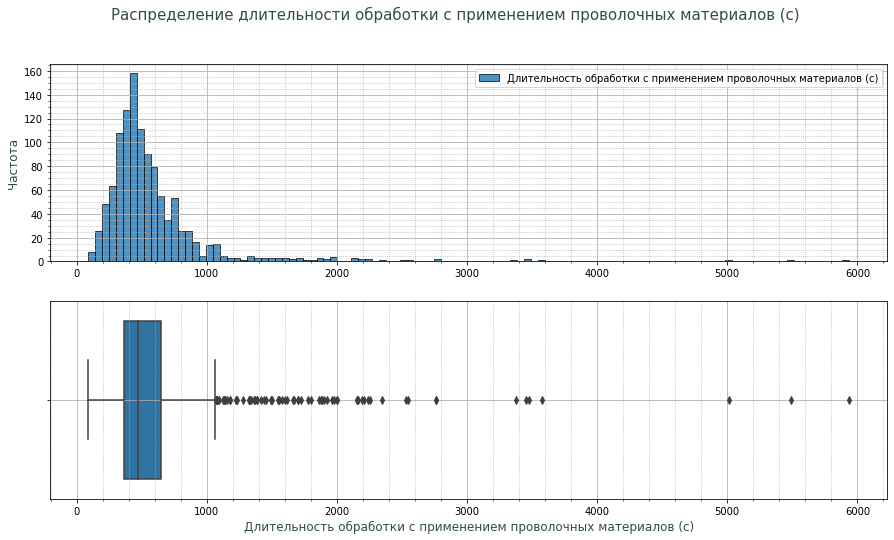

In [81]:
# Создаем графическую фигуру
plt.figure(figsize=(15, 8))
# Pазбиваем графическую фигуру на 2 графика
# Первый график
plt.subplot(2, 1, 1)
# Гистограмма для 'duration_wire'
sns.histplot(data=df_wire_time[df_wire_time['duration_wire'] != 0]['duration_wire'],
             alpha=0.8,
             label='Длительность обработки с применением проволочных материалов (с)')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('')
plt.ylabel('Частота',
           fontsize=12,
           color='DarkSlateGray')
plt.legend()

# Второй график
plt.subplot(2, 1, 2)
# Боксплот для 'duration_wire'
sns.boxplot(data=df_wire_time[df_wire_time['duration_wire'] != 0],
            x='duration_wire',
            orient='horizontal')

plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.xlabel('Длительность обработки с применением проволочных материалов (с)',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('')
plt.suptitle('Распределение длительности обработки с применением проволочных материалов (с)',
             fontsize=15,
             color='DarkSlateGray')
plt.show()

Аномальных значений не обнаружено.

Время добавления проволочных материалов находится в тех же промежутках, что и ранее рассмотренные данные по обработке стали. Максимальная длительность обработки одной партии составляет 5937 с (около 1,6 часа).

### Моменты, которые надо уточнить и согласовать с представителем заказчика.

1. Целевой признак. (**Целевой признак: последняя измеренная температура**)
2. Метрика. (**Метрика: МАЕ. Качество 6.8 и ниже**)
3. Почему отсутствуют записи в данных (`data_arc_new.csv` — данные об электродах) за промежуток с 13 по 18 июля.
4. По `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём):
- `Bulk 1`...`Bulk 15` - это разные материалы? (**Да, разные материалы**)
- `Bulk 8` действительно использовали один раз за период с 2019-05-03 по 2019-09-06?
- `Bulk 5` имеет одно значение `603` при условии, что значения, привышающие максимум (лежат за границей выброса) распределения: `234`, `242`, `256`, `293`. Это нормально?
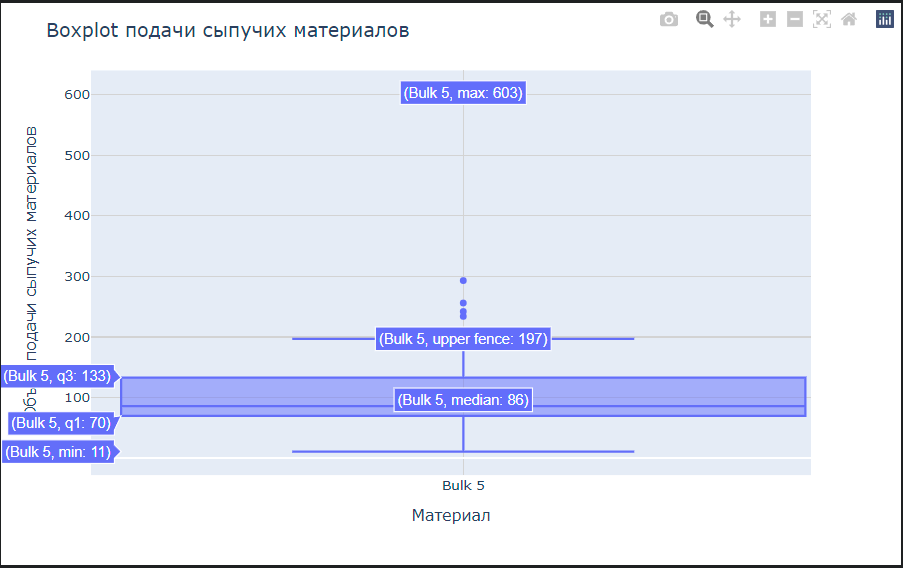
- `Bulk 12` имеет одно значение `1849` при условии, что значения, привышающие максимум (лежат за границей выброса) распределения:  `496` - `853`. Это нормально?
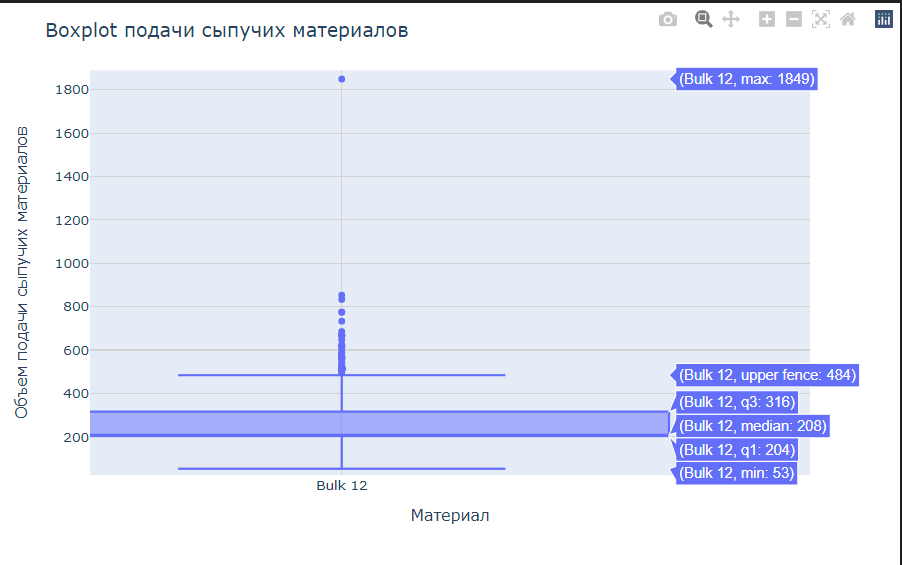
5. Почему партий продутых больше, чем нагретых электродами?
6. Могут-ли быть перепутаны номера партий?
7. Пять значений температур, которые выбиваются из общей массы: 1191, 1204, 1208, 1218, 1227. В чем причина таких показателей? (остыл ковш, неисправность измерительной аппаратуры) Укладываются они в рамки технологии, или это аномалии?
8. Нужен-ли нагрев (по технологии) выше 1600$^{\circ}$C?

После ознакомления с данными и уточнения информациии дообработаем таблички. (удалим редкие (единичные) случаи и аномальные значения.

In [82]:
# Удалим редкий сыпучий материал
df_bulk = df_bulk.drop('bulk_8', axis=1)
# Удалим данные с температурами ниже температуры плавления
df_result_temp = df_result_temp.drop(df_result_temp[(df_result_temp['temperature_first_measurement'] < 1300) | (
    df_result_temp['temperature_last_measurement'] < 1300)].index)
# Удалим редкий проволочный материал
df_wire = df_wire.drop('wire_5', axis=1)

### Результат предобработки.

В результате предобработки получили:

In [83]:
display(df_arc_key, df_bulk, df_bulk_time, df_gas, df_result_temp, df_wire, df_wire_time)

,count_arc,start_arc,end_arc,active_power,reactive_power,apparent_power,arc_duration,energy_consumption
key,,,,,,,,
1,5,2019-05-03 11:02:14,2019-05-03 11:28:37,3.036730,2.142821,3.718736,1098.0,770.282114
2,4,2019-05-03 11:34:14,2019-05-03 11:53:18,2.139408,1.453357,2.588349,811.0,481.760005
3,5,2019-05-03 12:06:54,2019-05-03 12:32:19,4.063641,2.937457,5.019223,655.0,722.837668
4,4,2019-05-03 12:39:37,2019-05-03 12:57:50,2.706489,2.056992,3.400038,741.0,683.455597
5,4,2019-05-03 13:11:13,2019-05-03 13:33:55,2.252950,1.687991,2.816980,869.0,512.169934
...,...,...,...,...,...,...,...,...
3237,5,2019-09-06 11:31:25,2019-09-06 11:53:55,2.541872,2.025417,3.250657,909.0,630.503534
3238,3,2019-09-06 12:16:25,2019-09-06 12:31:35,1.374821,1.038103,1.723937,546.0,286.052252
3239,8,2019-09-06 14:17:00,2019-09-06 15:05:50,4.848005,3.541541,6.014480,1216.0,941.538764


,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,bulk_sum
key,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,553.0
2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,582.0
3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,544.0
4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,595.0
5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,584.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,0.0,0.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,0.0,130.0,206.0,758.0
3238,0.0,0.0,126.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,254.0,0.0,108.0,106.0,594.0
3239,0.0,0.0,0.0,0.0,0.0,114.0,0.0,0.0,0.0,0.0,158.0,0.0,270.0,88.0,630.0


,start_time_bulk,finish_time_bulk,duration_bulk
key,,,
1,2019-05-03 11:10:43,2019-05-03 11:28:48,1085.0
2,2019-05-03 11:36:50,2019-05-03 11:53:30,1000.0
3,2019-05-03 12:16:16,2019-05-03 12:32:39,983.0
4,2019-05-03 12:43:22,2019-05-03 12:58:00,878.0
5,2019-05-03 13:30:47,2019-05-03 13:34:12,205.0
...,...,...,...
3237,2019-09-06 11:40:06,2019-09-06 11:54:15,849.0
3238,2019-09-06 12:18:35,2019-09-06 12:31:49,794.0
3239,2019-09-06 14:48:06,2019-09-06 15:06:00,1074.0


,gas_quantities
key,
1,29.749986
2,12.555561
3,28.554793
4,18.841219
5,5.413692
...,...
3237,5.543905
3238,6.745669
3239,16.023518


,time_first_measurement,time_last_measurement,temperature_first_measurement,temperature_last_measurement,time_between_measurements
key,,,,,
1,2019-05-03 11:02:04,2019-05-03 11:30:38,1571.0,1613.0,1714.0
2,2019-05-03 11:34:04,2019-05-03 11:55:09,1581.0,1602.0,1265.0
3,2019-05-03 12:06:44,2019-05-03 12:35:57,1596.0,1599.0,1753.0
4,2019-05-03 12:39:27,2019-05-03 12:59:47,1601.0,1625.0,1220.0
5,2019-05-03 13:11:03,2019-05-03 13:36:39,1576.0,1602.0,1536.0
...,...,...,...,...,...
2495,2019-08-10 11:27:47,2019-08-10 11:50:47,1570.0,1591.0,1380.0
2496,2019-08-10 11:56:48,2019-08-10 12:25:13,1554.0,1591.0,1705.0
2497,2019-08-10 12:37:26,2019-08-10 12:53:28,1571.0,1589.0,962.0


,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_8,wire_9,wire_sum
key,,,,,,,,,
1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,60.059998
2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,96.052315
3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,91.160157
4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,89.063515
5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,98.352796
...,...,...,...,...,...,...,...,...,...
3237,38.088959,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,38.088959
3238,56.128799,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,56.128799
3239,143.357761,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,143.357761


,start_time_wire,finish_time_wire,duration_wire
key,,,
1,2019-05-03 11:06:19,2019-05-03 11:06:19,0.0
2,2019-05-03 11:36:50,2019-05-03 11:36:50,0.0
3,2019-05-03 12:11:46,2019-05-03 12:11:46,0.0
4,2019-05-03 12:43:22,2019-05-03 12:43:22,0.0
5,2019-05-03 13:15:34,2019-05-03 13:20:44,310.0
...,...,...,...
3237,2019-09-06 11:33:38,2019-09-06 11:33:38,0.0
3238,2019-09-06 12:18:35,2019-09-06 12:18:35,0.0
3239,2019-09-06 14:36:11,2019-09-06 14:36:11,0.0


## Объединение таблиц.

Составим окончательную таблицу для обучения моделей, включая только те партии, для которых доступна информация по каждому этапу подготовки сплава. Причина такого выбора состоит в том, что каждая партия проходит все этапы подготовки.

In [84]:
# Объединим 7 таблиц в одну (присоединять будем к самой короткой)
unified_table = df_result_temp.join(
    [df_arc_key, df_bulk, df_bulk_time, df_gas, df_wire, df_wire_time], how='inner')
unified_table

,time_first_measurement,time_last_measurement,temperature_first_measurement,temperature_last_measurement,time_between_measurements,count_arc,start_arc,end_arc,active_power,reactive_power,...,wire_3,wire_4,wire_6,wire_7,wire_8,wire_9,wire_sum,start_time_wire,finish_time_wire,duration_wire
key,,,,,,,,,,,,,,,,,,,,,
1,2019-05-03 11:02:04,2019-05-03 11:30:38,1571.0,1613.0,1714.0,5,2019-05-03 11:02:14,2019-05-03 11:28:37,3.036730,2.142821,...,0.0,0.0,0.0,0.0,0.0,0.0,60.059998,2019-05-03 11:06:19,2019-05-03 11:06:19,0.0
2,2019-05-03 11:34:04,2019-05-03 11:55:09,1581.0,1602.0,1265.0,4,2019-05-03 11:34:14,2019-05-03 11:53:18,2.139408,1.453357,...,0.0,0.0,0.0,0.0,0.0,0.0,96.052315,2019-05-03 11:36:50,2019-05-03 11:36:50,0.0
3,2019-05-03 12:06:44,2019-05-03 12:35:57,1596.0,1599.0,1753.0,5,2019-05-03 12:06:54,2019-05-03 12:32:19,4.063641,2.937457,...,0.0,0.0,0.0,0.0,0.0,0.0,91.160157,2019-05-03 12:11:46,2019-05-03 12:11:46,0.0
4,2019-05-03 12:39:27,2019-05-03 12:59:47,1601.0,1625.0,1220.0,4,2019-05-03 12:39:37,2019-05-03 12:57:50,2.706489,2.056992,...,0.0,0.0,0.0,0.0,0.0,0.0,89.063515,2019-05-03 12:43:22,2019-05-03 12:43:22,0.0
5,2019-05-03 13:11:03,2019-05-03 13:36:39,1576.0,1602.0,1536.0,4,2019-05-03 13:11:13,2019-05-03 13:33:55,2.252950,1.687991,...,0.0,0.0,0.0,0.0,0.0,0.0,98.352796,2019-05-03 13:15:34,2019-05-03 13:20:44,310.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,2019-08-10 11:27:47,2019-08-10 11:50:47,1570.0,1591.0,1380.0,4,2019-08-10 11:27:57,2019-08-10 11:48:05,3.168133,2.210936,...,0.0,0.0,0.0,0.0,0.0,0.0,89.150879,2019-08-10 11:31:40,2019-08-10 11:31:40,0.0
2496,2019-08-10 11:56:48,2019-08-10 12:25:13,1554.0,1591.0,1705.0,6,2019-08-10 11:56:58,2019-08-10 12:23:07,4.174918,2.872031,...,0.0,0.0,0.0,0.0,0.0,0.0,114.179527,2019-08-10 11:59:10,2019-08-10 11:59:10,0.0
2497,2019-08-10 12:37:26,2019-08-10 12:53:28,1571.0,1589.0,962.0,3,2019-08-10 12:37:36,2019-08-10 12:51:20,3.605239,2.452092,...,0.0,0.0,0.0,0.0,0.0,0.0,103.134723,2019-08-10 12:40:30,2019-08-10 12:46:10,340.0


Так как целевым признаком является последняя измеренная температура, важно, чтоб после измерения температуры больше не каких манипуляций со сплавом не производилось.

In [85]:
''' Подсчитываем количество строк в `unified_table`, 
где столбец `time_last_measurement` не является максимальным значением среди
всех столбцов с типом данных `datetime` в `unified_table`.
'''
unified_table[
    (
        unified_table['time_last_measurement'] >= unified_table[unified_table.select_dtypes(
            'datetime').columns].max(axis=1)
    )
    .astype(int) == 0][unified_table.select_dtypes('datetime').columns].shape[0]

0

In [86]:
# удалим столбцы с типом данных `datetime`
unified_table = unified_table.drop(unified_table.select_dtypes('datetime').columns, axis=1)
unified_table

,temperature_first_measurement,temperature_last_measurement,time_between_measurements,count_arc,active_power,reactive_power,apparent_power,arc_duration,energy_consumption,bulk_1,...,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_8,wire_9,wire_sum,duration_wire
key,,,,,,,,,,,,,,,,,,,,,
1,1571.0,1613.0,1714.0,5,3.036730,2.142821,3.718736,1098.0,770.282114,0.0,...,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,60.059998,0.0
2,1581.0,1602.0,1265.0,4,2.139408,1.453357,2.588349,811.0,481.760005,0.0,...,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,96.052315,0.0
3,1596.0,1599.0,1753.0,5,4.063641,2.937457,5.019223,655.0,722.837668,0.0,...,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,91.160157,0.0
4,1601.0,1625.0,1220.0,4,2.706489,2.056992,3.400038,741.0,683.455597,0.0,...,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,89.063515,0.0
5,1576.0,1602.0,1536.0,4,2.252950,1.687991,2.816980,869.0,512.169934,0.0,...,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,98.352796,310.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1570.0,1591.0,1380.0,4,3.168133,2.210936,3.868721,723.0,694.177326,0.0,...,89.150879,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,89.150879,0.0
2496,1554.0,1591.0,1705.0,6,4.174918,2.872031,5.070316,940.0,815.818538,0.0,...,114.179527,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,114.179527,0.0
2497,1571.0,1589.0,962.0,3,3.605239,2.452092,4.360918,569.0,823.020520,0.0,...,94.086723,9.04800,0.0,0.0,0.0,0.0,0.0,0.0,103.134723,340.0


In [87]:
# Функция визуализации сильно коррелирующих переменных
def plot_highly_correlated_features(df):
    # Вычисляем матрицу корреляции
    high_corr_pairs = df.corr().unstack()
    # Оставляем только пары, где корреляция от 0.7 до 1
    high_corr_pairs = high_corr_pairs[(high_corr_pairs < 1) & (abs(high_corr_pairs) > 0.7)]
    # Проверяем, есть ли сильно коррелирующие признаки
    if high_corr_pairs.empty:
        print("Сильно коррелирующих признаков нет")
    else:
        # Извлекаем уникальные имена переменных из индекса полученных пар
        high_corr_features = high_corr_pairs.index.get_level_values(0).unique()
        # Создаем новый DataFrame, содержащий только сильно коррелирующие переменные
        highly_corr_df = df[high_corr_features]
        # Вычисляем корреляционную матрицу для сильно коррелирующих переменных
        corr_matrix = highly_corr_df.corr()
        # Устанавливаем размер и цвет графика
        sns.set(rc={'figure.figsize': (15, 5)})
        # Создаем тепловую карту корреляционной матрицы
        sns.heatmap(corr_matrix,
                    annot=True,
                    cmap='turbo',
                    vmin=-1,
                    vmax=1,
                    center=0,
                    cbar_kws={'orientation': 'vertical'},
                    mask=np.triu(np.ones_like(corr_matrix)))
        # Добавляем название графику
        plt.title('Корреляционная матрица сильно коррелирующих переменных',
                  fontsize=15,
                  color='DarkSlateGray')
        plt.show()

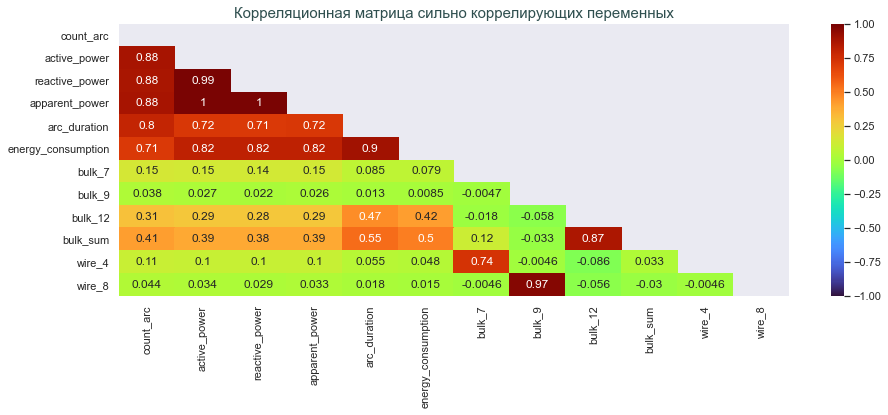

In [88]:
plot_highly_correlated_features(unified_table)

Тот факт, что между активной и реактивной мощностью высокая положительная корреляция был нами отмечен в самом начале обработки даных, была вычеслена полная мощность, которая объединяет оба этих параметра. Мы вычисляли продолжительность дуги и умножая на полную мощность определяли потребляемую энергию. Таким образом потребляемая энергия объединяет все четыре параметра. Можно оставить только потребляемую энергию, чтоб не создавать лишних связей между параметрами и не путать модель.

Общее количество сыпучих материалов коррелирует с материалом `bulk_12` и количество некоторых подаваемых материалов коррелирует между собой, видимо это особенность технологического процесса. Изменять связи внутри технологического процесса не будем.

In [89]:
# Удалим столбцы с активной, реактивной и полной мощностью, с продолжительностью дуги
unified_table.drop(['active_power', 'reactive_power',
                   'arc_duration', 'apparent_power'], axis=1, inplace=True)

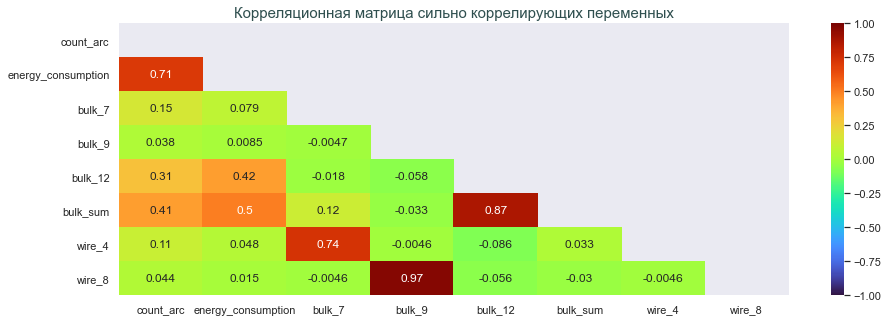

In [90]:
plot_highly_correlated_features(unified_table)

Видно, что некоторые переменные по прежнему имеют высокую корреляцию между собой. Например, `energy_consumption` имеет высокую корреляцию с `count_arc` (0.71) и `bulk_sum` (0.5), `bulk_sum` в свою очередь сильно коррелирует с `bulk_12` (0.87). Удалим `count_arc` и `bulk_sum`.

Видна тесная взаимосвязь `bulk_7`-`wire_4` и `bulk_9`-`wire_8`.

Такая высокая корреляция может указывать на наличие мультиколлинеарности между этими переменными. Мультиколлинеарность может внести нестабильность и неоднозначность в регрессионные модели, и затруднить интерпретацию важности каждой переменной.

Для избавления от мультиколлинеарности удалим `count_arc` и `bulk_sum`, а так-же объеденим попарно `bulk_7`-`wire_4` и `bulk_9`-`wire_8`.

In [91]:
# Удалим столбцы с количеством этапов обработки и общим количеством подаваемых сыпучих материалов.
unified_table.drop(['count_arc', 'bulk_sum'], axis=1, inplace=True)
# Добавление столбца bulk_7_wire_4
unified_table['bulk_7_wire_4'] = unified_table['bulk_7'] + unified_table['wire_4']
# Добавление столбца bulk_9_wire_8
unified_table['bulk_9_wire_8'] = unified_table['bulk_9'] + unified_table['wire_8']
# Удаление столбцов bulk_7, wire_4, bulk_9, wire_8
unified_table.drop(['bulk_7', 'wire_4', 'bulk_9', 'wire_8'], axis=1, inplace=True)

In [92]:
unified_table

,temperature_first_measurement,temperature_last_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_7_wire_4,bulk_9_wire_8
key,,,,,,,,,,,,,,,,,,,,,
1,1571.0,1613.0,1714.0,770.282114,0.0,0.0,0.0,43.0,0.0,0.0,...,60.059998,0.00000,0.0,0.0,0.0,0.0,60.059998,0.0,0.0,0.0
2,1581.0,1602.0,1265.0,481.760005,0.0,0.0,0.0,73.0,0.0,0.0,...,96.052315,0.00000,0.0,0.0,0.0,0.0,96.052315,0.0,0.0,0.0
3,1596.0,1599.0,1753.0,722.837668,0.0,0.0,0.0,34.0,0.0,0.0,...,91.160157,0.00000,0.0,0.0,0.0,0.0,91.160157,0.0,0.0,0.0
4,1601.0,1625.0,1220.0,683.455597,0.0,0.0,0.0,81.0,0.0,0.0,...,89.063515,0.00000,0.0,0.0,0.0,0.0,89.063515,0.0,0.0,0.0
5,1576.0,1602.0,1536.0,512.169934,0.0,0.0,0.0,78.0,0.0,0.0,...,89.238236,9.11456,0.0,0.0,0.0,0.0,98.352796,310.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1570.0,1591.0,1380.0,694.177326,0.0,0.0,21.0,0.0,0.0,0.0,...,89.150879,0.00000,0.0,0.0,0.0,0.0,89.150879,0.0,0.0,0.0
2496,1554.0,1591.0,1705.0,815.818538,0.0,0.0,0.0,63.0,0.0,0.0,...,114.179527,0.00000,0.0,0.0,0.0,0.0,114.179527,0.0,0.0,0.0
2497,1571.0,1589.0,962.0,823.020520,0.0,0.0,0.0,85.0,0.0,0.0,...,94.086723,9.04800,0.0,0.0,0.0,0.0,103.134723,340.0,0.0,0.0


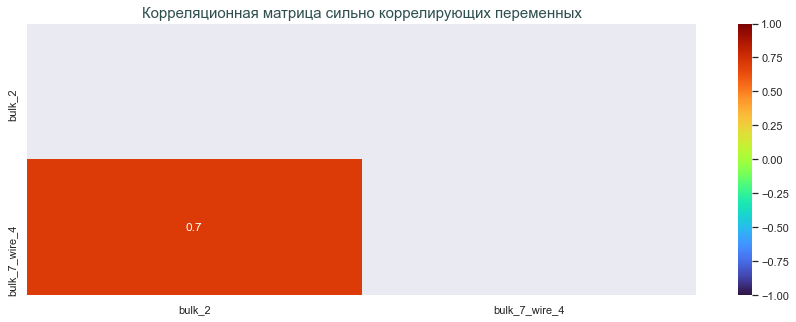

In [93]:
plot_highly_correlated_features(unified_table)

In [94]:
# Добавление столбца bulk_7_wire_4_bulk_2
unified_table['bulk_7_wire_4_bulk_2'] = unified_table['bulk_7_wire_4'] + unified_table['bulk_2']
# Удаление столбцов bulk_7_wire_4, bulk_2
unified_table.drop(['bulk_7_wire_4', 'bulk_2'], axis=1, inplace=True)
plot_highly_correlated_features(unified_table)

Сильно коррелирующих признаков нет


Сильной корреляции между собой признаками нет.

Итоговая таблица:

In [95]:
unified_table

,temperature_first_measurement,temperature_last_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_3,bulk_4,bulk_5,bulk_6,bulk_10,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_9_wire_8,bulk_7_wire_4_bulk_2
key,,,,,,,,,,,,,,,,,,,,,
1,1571.0,1613.0,1714.0,770.282114,0.0,0.0,43.0,0.0,0.0,0.0,...,60.059998,0.00000,0.0,0.0,0.0,0.0,60.059998,0.0,0.0,0.0
2,1581.0,1602.0,1265.0,481.760005,0.0,0.0,73.0,0.0,0.0,0.0,...,96.052315,0.00000,0.0,0.0,0.0,0.0,96.052315,0.0,0.0,0.0
3,1596.0,1599.0,1753.0,722.837668,0.0,0.0,34.0,0.0,0.0,0.0,...,91.160157,0.00000,0.0,0.0,0.0,0.0,91.160157,0.0,0.0,0.0
4,1601.0,1625.0,1220.0,683.455597,0.0,0.0,81.0,0.0,0.0,0.0,...,89.063515,0.00000,0.0,0.0,0.0,0.0,89.063515,0.0,0.0,0.0
5,1576.0,1602.0,1536.0,512.169934,0.0,0.0,78.0,0.0,0.0,0.0,...,89.238236,9.11456,0.0,0.0,0.0,0.0,98.352796,310.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1570.0,1591.0,1380.0,694.177326,0.0,21.0,0.0,0.0,0.0,90.0,...,89.150879,0.00000,0.0,0.0,0.0,0.0,89.150879,0.0,0.0,0.0
2496,1554.0,1591.0,1705.0,815.818538,0.0,0.0,63.0,0.0,0.0,122.0,...,114.179527,0.00000,0.0,0.0,0.0,0.0,114.179527,0.0,0.0,0.0
2497,1571.0,1589.0,962.0,823.020520,0.0,0.0,85.0,0.0,0.0,0.0,...,94.086723,9.04800,0.0,0.0,0.0,0.0,103.134723,340.0,0.0,0.0


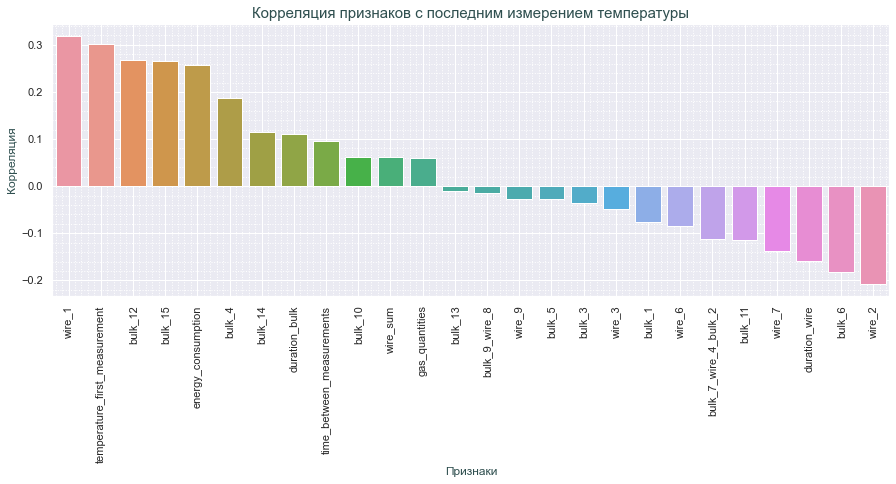

In [96]:
# Создаем пустую серию для хранения корреляций с целевым столбцом
corr_target = pd.Series(dtype='float64')
# Итерируемся по столбцам таблицы
for col in unified_table.columns:
    # Считаем корреляцию между столбцом и целевым столбцом и добавляем в серию
    corr_target[col] = unified_table['temperature_last_measurement'].corr(
        unified_table[col])
# Сортируем серию по убыванию и исключаем целевой столбец
corr_target = corr_target.sort_values(ascending=False)[1:]
# Создаем график
plt.figure(figsize=(15, 5))
sns.barplot(x=corr_target.index,
            y=corr_target.values)
plt.xticks(rotation=90)
plt.title('Корреляция признаков с последним измерением температуры',
          fontsize=15,
          color='DarkSlateGray')
plt.xlabel('Признаки',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Корреляция',
           fontsize=12,
           color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

Прямой зависимости целевого признака от какого-либо параметра нет. Без построения модели нельзя сказать от чего зависит температура на заключительном этапе.

## Обучение моделей.

### Подготовка выборок.

In [97]:
# Разделим данные на обучающую и тестовую выборки
train, test = train_test_split(
    unified_table, test_size=0.25, random_state=RANDOM_STATE)
# Определим целевой признак для обучающей выборки
target_train = train['temperature_last_measurement']
# Определим признаки для обучающей выборки
features_train = train.drop(['temperature_last_measurement'], axis=1)
# Определим целевой признак для тестовой выборки
target_test = test['temperature_last_measurement']
# Определим признаки для тестовой выборки
features_test = test.drop(['temperature_last_measurement'], axis=1)
# Отобразим результат
display(target_train, features_train, target_test, features_test)

key
1973    1579.0
802     1592.0
959     1617.0
680     1588.0
970     1579.0
         ...  
119     1593.0
809     1604.0
1775    1596.0
1966    1578.0
1580    1593.0
Name: temperature_last_measurement, Length: 1743, dtype: float64

,temperature_first_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_3,bulk_4,bulk_5,bulk_6,bulk_10,bulk_11,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_9_wire_8,bulk_7_wire_4_bulk_2
key,,,,,,,,,,,,,,,,,,,,,
1973,1562.0,1066.0,598.994020,0.0,310.0,0.0,0.0,93.0,0.0,0.0,...,40.098240,0.000000,0.000000,0.000000,0.0,0.0,40.098240,0.0,0.0,0.0
802,1580.0,3871.0,688.957621,0.0,190.0,0.0,0.0,46.0,0.0,0.0,...,29.249999,80.376400,0.000000,0.000000,0.0,0.0,109.626399,546.0,0.0,0.0
959,1586.0,8222.0,1229.980397,0.0,66.0,23.0,0.0,0.0,0.0,0.0,...,123.037201,0.000000,0.000000,0.000000,0.0,0.0,123.037201,0.0,0.0,0.0
680,1613.0,2993.0,578.532433,0.0,44.0,0.0,0.0,0.0,0.0,0.0,...,120.042000,0.000000,0.000000,0.000000,0.0,0.0,120.042000,0.0,0.0,0.0
970,1574.0,1498.0,219.296917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,84.099601,0.000000,0.000000,0.000000,0.0,0.0,84.099601,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,1628.0,3897.0,200.972392,51.0,0.0,50.0,86.0,0.0,0.0,0.0,...,0.000000,0.000000,93.117027,43.174561,0.0,0.0,136.291588,1926.0,0.0,233.0
809,1587.0,2795.0,856.165815,0.0,405.0,0.0,0.0,0.0,0.0,0.0,...,137.638809,0.000000,0.000000,0.000000,0.0,0.0,137.638809,0.0,0.0,0.0
1775,1604.0,1744.0,351.696370,0.0,21.0,0.0,0.0,0.0,0.0,0.0,...,145.126801,0.000000,0.000000,0.000000,0.0,0.0,145.126801,0.0,0.0,0.0


key
1480    1597.0
2322    1590.0
673     1614.0
660     1590.0
1357    1600.0
         ...  
335     1612.0
2151    1620.0
537     1585.0
650     1621.0
569     1625.0
Name: temperature_last_measurement, Length: 582, dtype: float64

,temperature_first_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_3,bulk_4,bulk_5,bulk_6,bulk_10,bulk_11,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_9_wire_8,bulk_7_wire_4_bulk_2
key,,,,,,,,,,,,,,,,,,,,,
1480,1567.0,1255.0,443.225773,0.0,0.0,107.0,0.0,0.0,0.0,0.0,...,122.990398,0.000000,0.0,0.0,0.0,0.0,122.990398,0.0,0.0,0.0
2322,1616.0,3225.0,793.032361,52.0,154.0,0.0,0.0,0.0,0.0,0.0,...,172.273911,0.000000,0.0,0.0,0.0,0.0,172.273911,0.0,0.0,0.0
673,1609.0,2671.0,715.322078,0.0,87.0,0.0,0.0,0.0,0.0,0.0,...,134.877605,0.000000,0.0,0.0,0.0,0.0,134.877605,0.0,0.0,0.0
660,1619.0,3440.0,768.955278,0.0,0.0,110.0,0.0,0.0,0.0,0.0,...,76.143600,0.000000,0.0,0.0,0.0,0.0,76.143600,0.0,0.0,0.0
1357,1538.0,1989.0,1046.797454,0.0,0.0,231.0,0.0,0.0,0.0,0.0,...,105.112795,0.000000,0.0,0.0,0.0,0.0,105.112795,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
335,1564.0,4258.0,1556.605508,0.0,0.0,0.0,0.0,162.0,0.0,0.0,...,73.429200,0.000000,0.0,0.0,0.0,0.0,73.429200,0.0,0.0,0.0
2151,1622.0,7772.0,1257.999589,0.0,0.0,0.0,0.0,0.0,126.0,0.0,...,145.236007,0.000000,0.0,0.0,0.0,0.0,145.236007,0.0,0.0,0.0
537,1590.0,4248.0,974.347090,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.011597,0.000000,0.0,0.0,0.0,0.0,100.011597,0.0,0.0,0.0


In [98]:
# Получаем названия числовых признаков
numeric = features_train.columns
# Создаем экземпляр стандартизатора
scaler = StandardScaler()
# Обучаем и проводим стандартизацию на тренировочных данных
scaler.fit(features_train[numeric])
features_train[numeric] = scaler.transform(features_train[numeric])
# Проводим ту же стандартизацию на тестовых данных
features_test[numeric] = scaler.transform(features_test[numeric])
# Выводим преобразованные тренировочные и тестовые данные
display(features_train, features_test)

,temperature_first_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_3,bulk_4,bulk_5,bulk_6,bulk_10,bulk_11,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_9_wire_8,bulk_7_wire_4_bulk_2
key,,,,,,,,,,,,,,,,,,,,,
1973,-1.068818,-0.869244,-0.222219,-0.278179,3.468995,-0.627861,-0.125004,1.221972,-0.243976,-0.186131,...,-1.431246,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-1.321379,-0.522456,-0.072593,-0.076135
802,-0.304182,1.037816,0.057718,-0.278179,1.879286,-0.627861,-0.125004,0.404780,-0.243976,-0.186131,...,-1.680569,1.880855,-0.124387,-0.120551,-0.035756,-0.091804,-0.245646,0.794695,-0.072593,-0.076135
959,-0.049304,3.995967,1.741205,-0.278179,0.236587,-0.238342,-0.125004,-0.395024,-0.243976,-0.186131,...,0.474928,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.038155,-0.522456,-0.072593,-0.076135
680,1.097649,0.440882,-0.285889,-0.278179,-0.054860,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,0.406090,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.084496,-0.522456,-0.072593,-0.076135
970,-0.559061,-0.575536,-1.403713,-0.278179,-0.637753,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,-0.419969,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.640594,-0.522456,-0.072593,-0.076135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,1.734846,1.055492,-1.460733,4.077678,-0.637753,0.218919,3.494437,-0.395024,-0.243976,-0.186131,...,-2.352818,-0.524372,3.085229,4.644601,-0.035756,-0.091804,0.166916,4.123757,-0.072593,4.430674
809,-0.006824,0.306266,0.578016,-0.278179,4.727515,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,0.810515,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,0.187760,-0.522456,-0.072593,-0.076135
1775,0.715332,-0.408286,-0.991729,-0.278179,-0.359554,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,0.982610,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,0.303614,-0.522456,-0.072593,-0.076135


,temperature_first_measurement,time_between_measurements,energy_consumption,bulk_1,bulk_3,bulk_4,bulk_5,bulk_6,bulk_10,bulk_11,...,wire_1,wire_2,wire_3,wire_6,wire_7,wire_9,wire_sum,duration_wire,bulk_9_wire_8,bulk_7_wire_4_bulk_2
key,,,,,,,,,,,,,,,,,,,,,
1480,-0.856419,-0.740747,-0.706919,-0.278179,-0.637753,1.184248,-0.125004,-0.395024,-0.243976,-0.186131,...,0.473853,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.038879,-0.522456,-0.072593,-0.076135
2322,1.225089,0.598614,0.381565,4.163087,1.402373,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,1.606528,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,0.723631,-0.522456,-0.072593,-0.076135
673,0.927730,0.221961,0.139756,-0.278179,0.514786,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,0.747054,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,0.145039,-0.522456,-0.072593,-0.076135
660,1.352528,0.744788,0.306645,-0.278179,-0.637753,1.235055,-0.125004,-0.395024,-0.243976,-0.186131,...,-0.602821,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.763689,-0.522456,-0.072593,-0.076135
1357,-2.088332,-0.241716,1.171199,-0.278179,-0.637753,3.284263,-0.125004,-0.395024,-0.243976,-0.186131,...,0.062974,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.315480,-0.522456,-0.072593,-0.076135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
335,-0.983858,1.300929,2.757556,-0.278179,-0.637753,-0.627861,-0.125004,2.421678,-0.243976,-0.186131,...,-0.665205,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.805686,-0.522456,-0.072593,-0.076135
2151,1.479967,3.690021,1.828392,-0.278179,-0.637753,-0.627861,-0.125004,-0.395024,5.645407,-0.186131,...,0.985120,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,0.305303,-0.522456,-0.072593,-0.076135
537,0.120615,1.294130,0.945757,-0.278179,-0.637753,-0.627861,-0.125004,-0.395024,-0.243976,-0.186131,...,-0.054266,-0.524372,-0.124387,-0.120551,-0.035756,-0.091804,-0.394405,-0.522456,-0.072593,-0.076135


### Вычислим среднюю абсолютную ошибку (MAE) для модели, которая всегда предсказывает среднее значение целевой переменной.

In [99]:
round(mae(target_train, np.ones(features_train.shape[0])*target_train.mean()), 2)

7.88

Теперь у нас есть точка отсчета MAE=7.88

In [100]:
# Cоздадим объект `KFold`, который будем использовать для разделения данных
kf = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

### Линейная регрессия.

In [101]:
# Создаем Pipeline с масштабированием и регрессией
pipeline = make_pipeline(StandardScaler(), regressor)
# Вычисляем значение метрики с помощью кросс-валидации
cv_MAE_LR = round(abs(cross_val_score(pipeline,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
print('Значение метрики:', cv_MAE_LR)

Значение метрики: 6.55
Wall time: 2.68 s


### Случайный лес RandomForestRegressor.

[I 2023-08-24 10:15:19,986] A new study created in memory with name: no-name-c5093fcd-01c0-457c-9ffc-6126a90c4d3a
[I 2023-08-24 10:15:27,559] Trial 0 finished with value: 8.16 and parameters: {'n_estimators': 476, 'max_depth': 15, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': False}. Best is trial 0 with value: 8.16.
[I 2023-08-24 10:15:29,151] Trial 1 finished with value: 6.65 and parameters: {'n_estimators': 428, 'max_depth': 14, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': True}. Best is trial 1 with value: 6.65.
[I 2023-08-24 10:15:30,342] Trial 2 finished with value: 6.62 and parameters: {'n_estimators': 343, 'max_depth': 22, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 2 with value: 6.62.
[I 2023-08-24 10:15:30,761] Trial 3 finished with value: 6.7 and parameters: {'n_estimators': 123, 'max_depth': 28, 'min_samples_split': 5, 'min_samples_leaf': 3

Лучшие параметры: {'n_estimators': 102, 'max_depth': 18, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}
Лучшее значение метрики: 6.43


,n_estimators,max_depth,min_samples_split,min_samples_leaf,max_features,bootstrap,score
0,102.0,18.0,6.0,3.0,None,1.0,6.43
1,102.0,11.0,5.0,3.0,None,1.0,6.43
2,107.0,27.0,5.0,3.0,None,1.0,6.43


<timed exec>:57: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:73: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



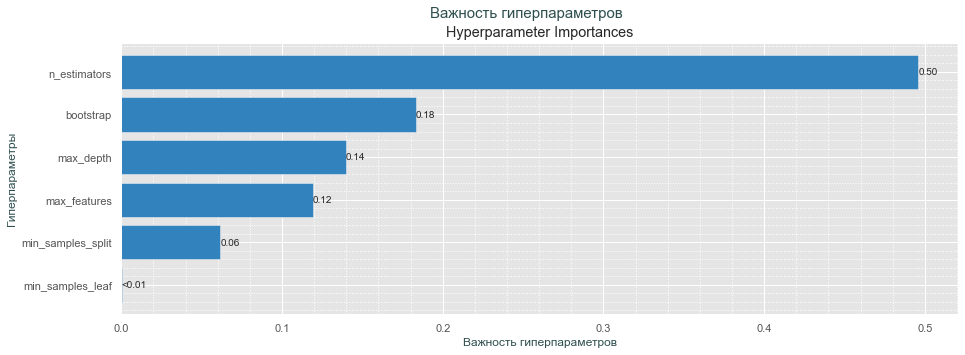

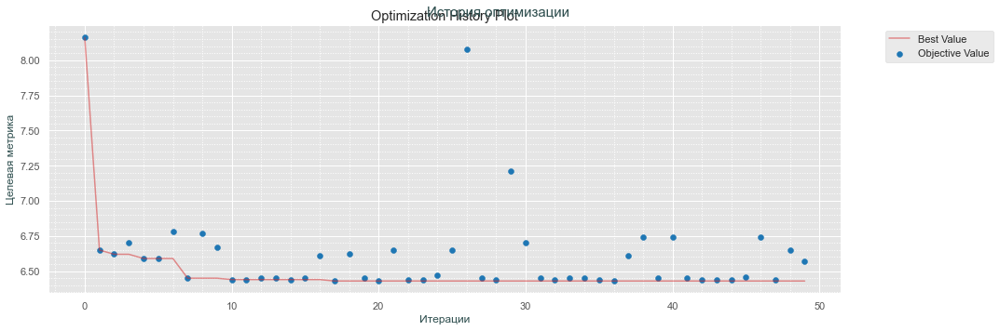

Wall time: 1min 24s


In [103]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 10, 500)
    max_depth = trial.suggest_int('max_depth', 5, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 6)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 3)
    max_features = trial.suggest_categorical(
        'max_features', ['sqrt', 'log2', None])
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])

# Создадём модель случайного леса с определенными параметрами
    model = RandomForestRegressor(n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  min_samples_split=min_samples_split,
                                  min_samples_leaf=min_samples_leaf,
                                  max_features=max_features,
                                  bootstrap=bootstrap,
                                  random_state=RANDOM_STATE,
                                  n_jobs=-1)

# Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
# Возврщаем значения метрики
    return score.mean()


# Создаём объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаём датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                        'min_samples_split': [],
                        'min_samples_leaf': [],
                        'max_features': [],
                        'bootstrap': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)
# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)
# Выводим 10 лучших моделей
display(results.head(10))

# Создаём график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

#  Создаём график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [104]:
# Создаём график контура
fig = optuna.visualization.plot_contour(
    study, params=['max_depth', 'n_estimators'])
fig.show()

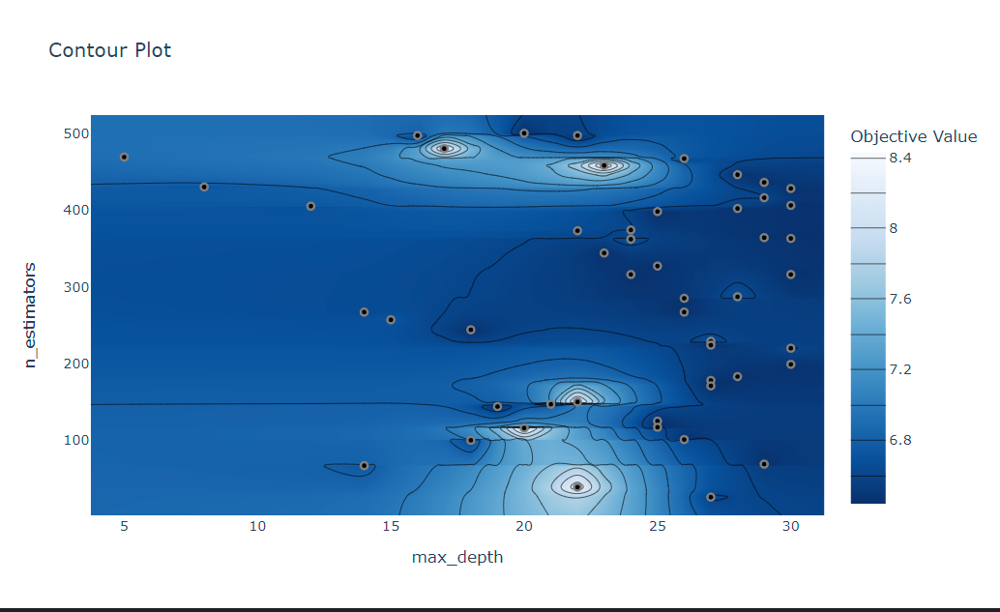

Подредактируем интервалы параметров для подбора.

[I 2023-08-24 10:16:44,629] A new study created in memory with name: no-name-e5ecc5e4-5c56-477e-b241-b6f1db4aba45
[I 2023-08-24 10:16:47,215] Trial 0 finished with value: 6.46 and parameters: {'n_estimators': 211, 'max_depth': 25, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 6.46.
[I 2023-08-24 10:16:50,149] Trial 1 finished with value: 6.45 and parameters: {'n_estimators': 262, 'max_depth': 16, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 6.45.
[I 2023-08-24 10:16:50,958] Trial 2 finished with value: 6.44 and parameters: {'n_estimators': 84, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}. Best is trial 2 with value: 6.44.
[I 2023-08-24 10:16:52,729] Trial 3 finished with value: 6.46 and parameters: {'n_estimators': 157, 'max_depth': 18, 'min_samples_split': 4, 'min_samples_leaf': 1, 'ma

Лучшие параметры: {'n_estimators': 85, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}
Лучшее значение метрики: 6.43


,n_estimators,max_depth,min_samples_split,min_samples_leaf,max_features,bootstrap,score
0,85.0,12.0,4.0,3.0,None,1.0,6.43
1,111.0,12.0,6.0,3.0,None,1.0,6.43
2,106.0,11.0,6.0,3.0,None,1.0,6.43
3,54.0,12.0,5.0,2.0,None,1.0,6.43
4,54.0,12.0,5.0,2.0,None,1.0,6.43
5,92.0,17.0,3.0,3.0,None,1.0,6.43


<timed exec>:56: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:72: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



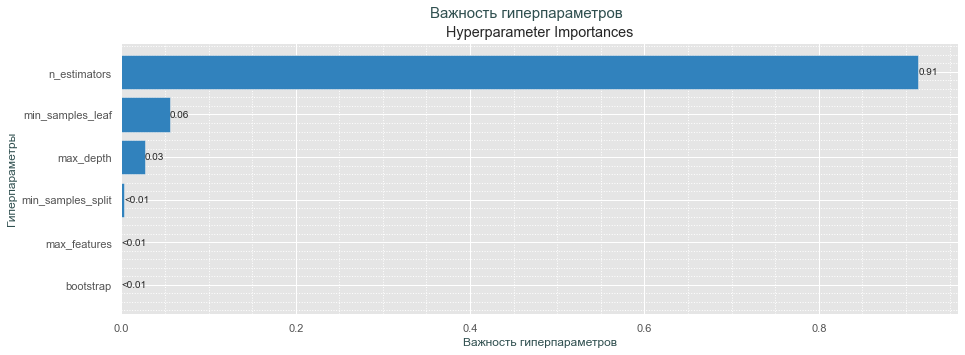

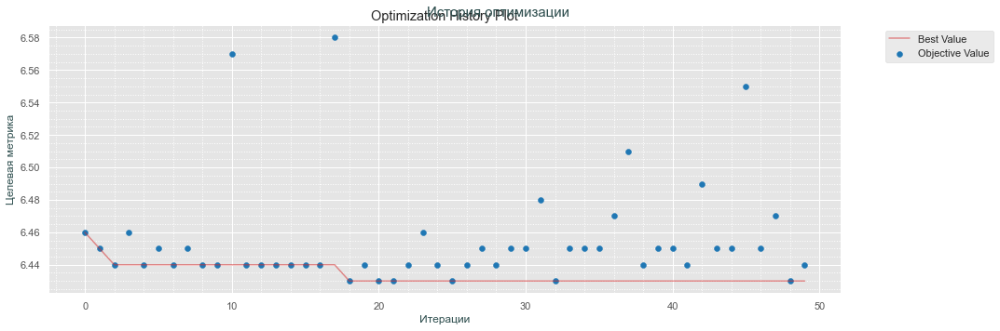

Wall time: 1min 13s


In [105]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 14, 450)
    max_depth = trial.suggest_int('max_depth', 10, 26)
    min_samples_split = trial.suggest_int('min_samples_split', 3, 6)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 3)
    max_features = trial.suggest_categorical('max_features', [None])
    bootstrap = trial.suggest_categorical('bootstrap', [True])

# Создадём модель случайного леса с определенными параметрами
    model = RandomForestRegressor(n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  min_samples_split=min_samples_split,
                                  min_samples_leaf=min_samples_leaf,
                                  max_features=max_features,
                                  bootstrap=bootstrap,
                                  random_state=RANDOM_STATE, 
                                  n_jobs=-1)

# Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
# Возврщаем значения метрики
    return score.mean()


# Создаём объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаём датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                        'min_samples_split': [],
                        'min_samples_leaf': [],
                        'max_features': [],
                        'bootstrap': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)
# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)
# Выводим 10 лучших моделей
display(results.head(10))

# Создаём график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

#  Создаём график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [106]:
# Создаём график контура
fig = optuna.visualization.plot_contour(
    study, params=["max_depth", "n_estimators"])
fig.show()

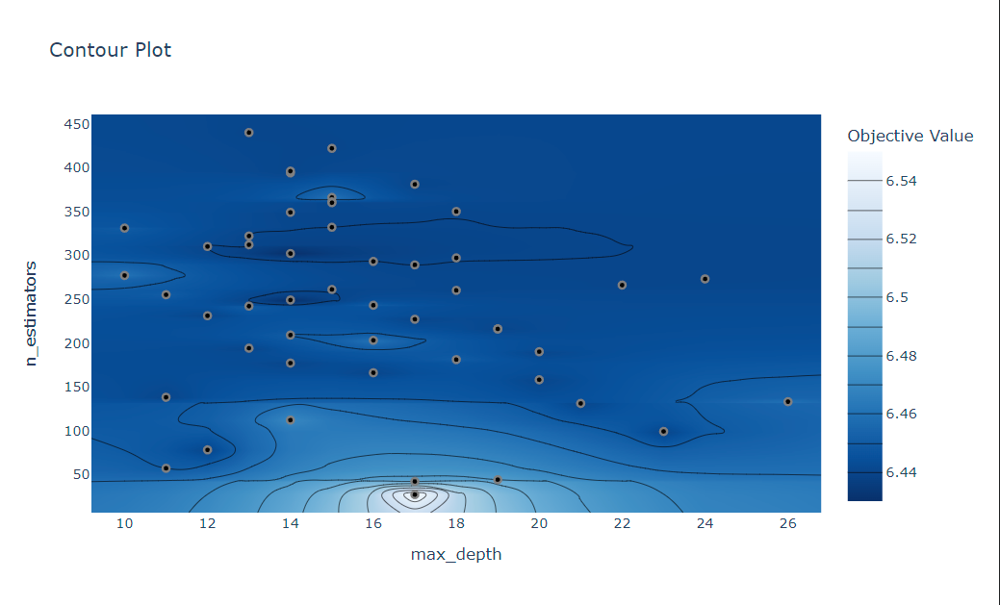

Делаем окончательный подбор параметров модели.

[I 2023-08-24 10:17:58,391] A new study created in memory with name: no-name-9db2dd26-faab-49fa-8f6d-24d21c2b734b
[I 2023-08-24 10:18:01,598] Trial 0 finished with value: 6.44 and parameters: {'n_estimators': 319, 'max_depth': 25, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 6.44.
[I 2023-08-24 10:18:03,801] Trial 1 finished with value: 6.44 and parameters: {'n_estimators': 233, 'max_depth': 21, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 6.44.
[I 2023-08-24 10:18:05,271] Trial 2 finished with value: 6.44 and parameters: {'n_estimators': 158, 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 6.44.
[I 2023-08-24 10:18:07,962] Trial 3 finished with value: 6.44 and parameters: {'n_estimators': 281, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 3, 'm

Лучшие параметры: {'n_estimators': 272, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': None, 'bootstrap': True}
Лучшее значение метрики: 6.43


,n_estimators,max_depth,min_samples_split,min_samples_leaf,max_features,bootstrap,score
0,272.0,14.0,6.0,2.0,None,1.0,6.43
43,291.0,14.0,6.0,2.0,None,1.0,6.43
31,257.0,14.0,6.0,2.0,None,1.0,6.43
32,282.0,14.0,6.0,2.0,None,1.0,6.43
33,259.0,14.0,6.0,2.0,None,1.0,6.43
34,287.0,14.0,6.0,2.0,None,1.0,6.43
35,260.0,14.0,6.0,2.0,None,1.0,6.43
36,254.0,14.0,6.0,2.0,None,1.0,6.43
37,280.0,14.0,6.0,2.0,None,1.0,6.43
38,275.0,14.0,6.0,2.0,None,1.0,6.43


<timed exec>:56: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:72: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



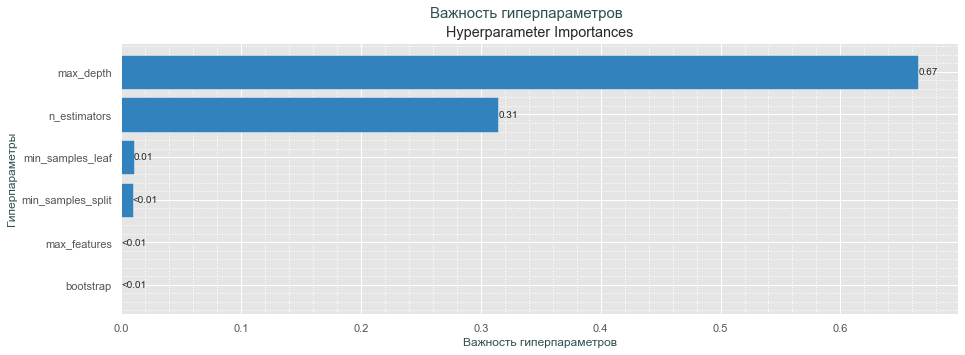

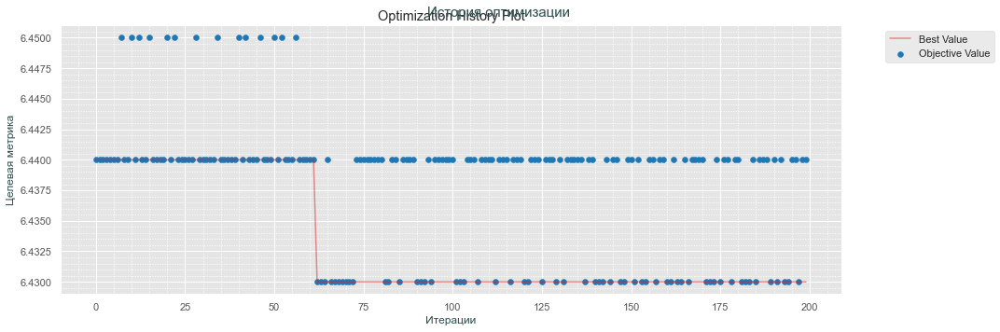

Wall time: 8min 49s


In [107]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 150, 355)
    max_depth = trial.suggest_int('max_depth', 12, 26)
    min_samples_split = trial.suggest_int('min_samples_split', 3, 6)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 3)
    max_features = trial.suggest_categorical('max_features', [None])
    bootstrap = trial.suggest_categorical('bootstrap', [True])

# Создадём модель случайного леса с определенными параметрами
    model = RandomForestRegressor(n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  min_samples_split=min_samples_split,
                                  min_samples_leaf=min_samples_leaf,
                                  max_features=max_features,
                                  bootstrap=bootstrap,
                                  random_state=RANDOM_STATE,  
                                  n_jobs=-1)

# Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
# Возврщаем значения метрики
    return score.mean()


# Создаём объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаём датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                        'min_samples_split': [],
                        'min_samples_leaf': [],
                        'max_features': [],
                        'bootstrap': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)
# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)
# Выводим 10 лучших моделей
display(results.head(10))

# Создаём график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

#  Создаём график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

# Сохранение модели с наилучшими параметрами
forest = RandomForestRegressor(n_estimators=study.best_params['n_estimators'],
                               max_depth=study.best_params['max_depth'],
                               min_samples_split=study.best_params['min_samples_split'],
                               min_samples_leaf=study.best_params['min_samples_leaf'],
                               max_features=study.best_params['max_features'],
                               bootstrap=study.best_params['bootstrap'],
                               random_state=RANDOM_STATE, n_jobs=-1)

In [108]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"])
fig.show()

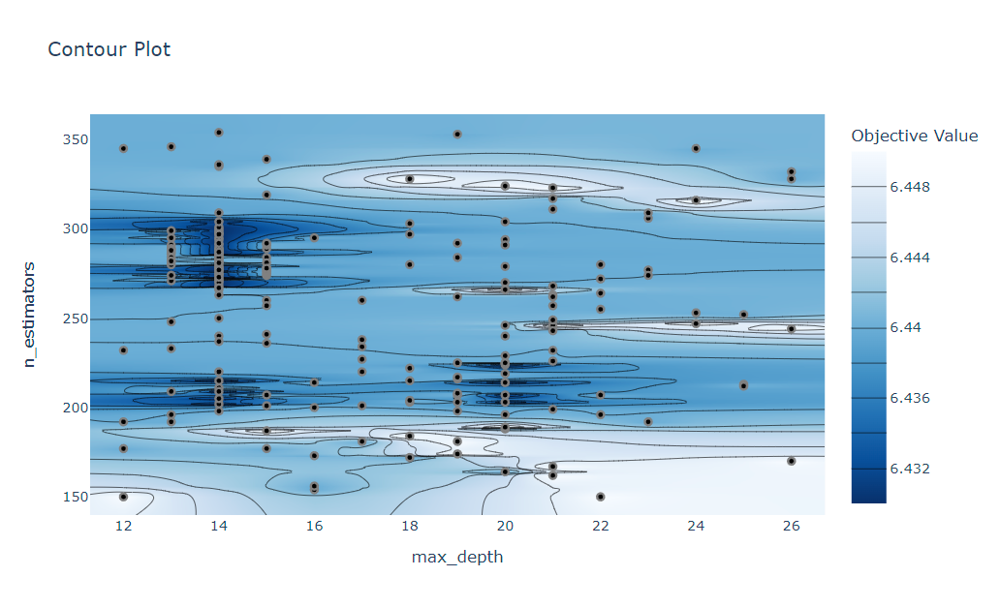

In [109]:
forest

RandomForestRegressor(max_depth=14, max_features=None, min_samples_leaf=2,
                      min_samples_split=6, n_estimators=272, n_jobs=-1,
                      random_state=140823)

### Градиентный бустинг LightGBM

[I 2023-08-24 10:26:48,440] A new study created in memory with name: no-name-7dc85ea7-653b-4253-aba0-5241b419d609
[I 2023-08-24 10:26:49,709] Trial 0 finished with value: 6.49 and parameters: {'n_estimators': 494, 'max_depth': 20, 'min_child_samples': 7, 'learning_rate': 0.060000000000000005, 'subsample': 0.8200000000000001, 'colsample_bytree': 0.75}. Best is trial 0 with value: 6.49.
[I 2023-08-24 10:26:50,844] Trial 1 finished with value: 6.53 and parameters: {'n_estimators': 450, 'max_depth': 15, 'min_child_samples': 3, 'learning_rate': 0.04, 'subsample': 0.9299999999999999, 'colsample_bytree': 0.8200000000000001}. Best is trial 0 with value: 6.49.
[I 2023-08-24 10:26:51,021] Trial 2 finished with value: 6.76 and parameters: {'n_estimators': 58, 'max_depth': 9, 'min_child_samples': 7, 'learning_rate': 0.02, 'subsample': 0.5, 'colsample_bytree': 0.86}. Best is trial 0 with value: 6.49.
[I 2023-08-24 10:26:52,065] Trial 3 finished with value: 6.55 and parameters: {'n_estimators': 448,

Лучшие параметры: {'n_estimators': 417, 'max_depth': 6, 'min_child_samples': 4, 'learning_rate': 0.02, 'subsample': 0.71, 'colsample_bytree': 0.8200000000000001}
Лучшее значение метрики: 6.3


,n_estimators,max_depth,min_child_samples,learning_rate,subsample,colsample_bytree,score
0,417.0,6.0,4.0,0.02,0.71,0.82,6.3


<timed exec>:57: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:73: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



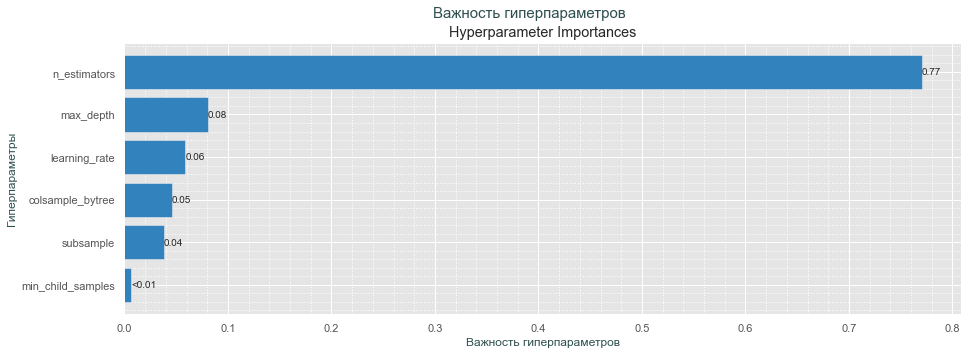

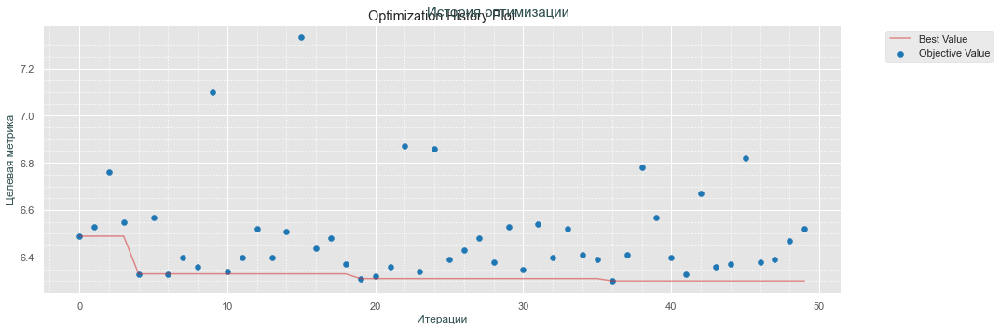

Wall time: 28.6 s


In [110]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 10, 500)
    max_depth = trial.suggest_int('max_depth', 2, 30)
    min_child_samples = trial.suggest_int('min_child_samples', 1, 8)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1, step=0.01)
    subsample = trial.suggest_float('subsample', 0.5, 1.0, step=0.01)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0, step=0.01)
    
    # Создаем модель с определенными параметрами
    model = LGBMRegressor(n_estimators=n_estimators,
                          max_depth=max_depth,
                          min_child_samples=min_child_samples,
                          learning_rate=learning_rate,
                          subsample=subsample,
                          colsample_bytree=colsample_bytree,
                          random_state=RANDOM_STATE)
    
    # Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
    
    # Возвращаем значения метрики
    return score.mean()

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                       'min_child_samples': [],
                       'learning_rate': [],
                       'subsample': [],
                       'colsample_bytree': [],
                       'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [111]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"])
fig.show()

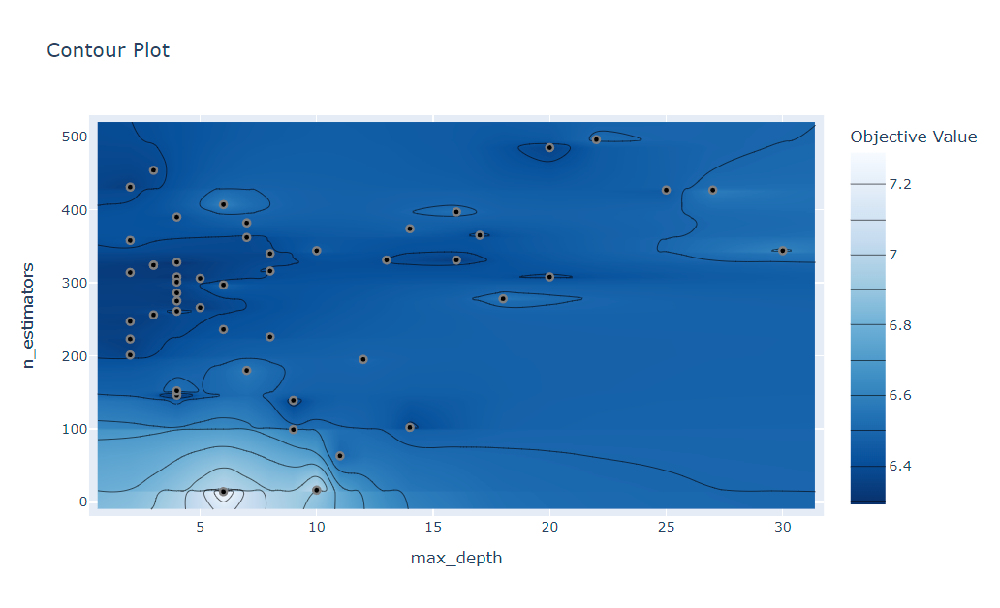

Коректируем интервалы параметров для подбора.

[I 2023-08-24 10:27:17,065] A new study created in memory with name: no-name-b9e8db1d-6e83-4904-b89d-56697bd66880
[I 2023-08-24 10:27:17,198] Trial 0 finished with value: 6.35 and parameters: {'n_estimators': 120, 'max_depth': 4, 'min_child_samples': 8, 'learning_rate': 0.04, 'subsample': 0.8400000000000001, 'colsample_bytree': 0.7999999999999999}. Best is trial 0 with value: 6.35.
[I 2023-08-24 10:27:17,531] Trial 1 finished with value: 6.41 and parameters: {'n_estimators': 241, 'max_depth': 5, 'min_child_samples': 7, 'learning_rate': 0.08, 'subsample': 0.59, 'colsample_bytree': 0.7}. Best is trial 0 with value: 6.35.
[I 2023-08-24 10:27:18,420] Trial 2 finished with value: 6.56 and parameters: {'n_estimators': 372, 'max_depth': 9, 'min_child_samples': 8, 'learning_rate': 0.08, 'subsample': 0.6799999999999999, 'colsample_bytree': 1.0}. Best is trial 0 with value: 6.35.
[I 2023-08-24 10:27:18,669] Trial 3 finished with value: 6.57 and parameters: {'n_estimators': 101, 'max_depth': 10, 

Лучшие параметры: {'n_estimators': 269, 'max_depth': 4, 'min_child_samples': 8, 'learning_rate': 0.04, 'subsample': 0.77, 'colsample_bytree': 0.7999999999999999}
Лучшее значение метрики: 6.26


,n_estimators,max_depth,min_child_samples,learning_rate,subsample,colsample_bytree,score
0,269.0,4.0,8.0,0.04,0.77,0.8,6.26
1,321.0,3.0,9.0,0.06,0.84,0.7,6.26


<timed exec>:57: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:73: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



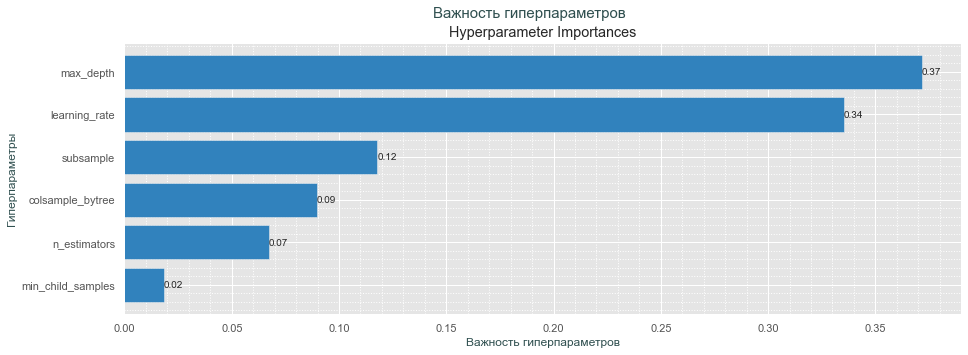

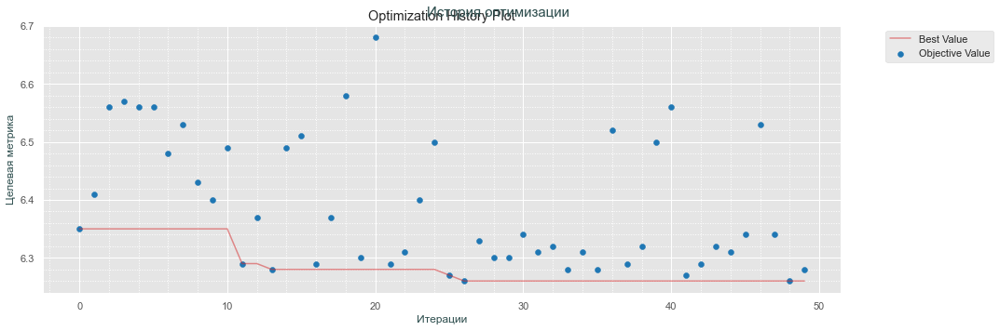

Wall time: 17.2 s


In [112]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 100, 400)
    max_depth = trial.suggest_int('max_depth', 1, 10)
    min_child_samples = trial.suggest_int('min_child_samples', 6, 10)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1, step=0.01)
    subsample = trial.suggest_float('subsample', 0.5, 0.9, step=0.01)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.7, 1, step=0.1)
    
    # Создаем модель с определенными параметрами
    model = LGBMRegressor(n_estimators=n_estimators,
                          max_depth=max_depth,
                          min_child_samples=min_child_samples,
                          learning_rate=learning_rate,
                          subsample=subsample,
                          colsample_bytree=colsample_bytree,
                          random_state=RANDOM_STATE)
    
    # Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
    
    # Возвращаем значения метрики
    return score.mean()

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                       'min_child_samples': [],
                       'learning_rate': [],
                       'subsample': [],
                       'colsample_bytree': [],
                       'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [113]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"])
fig.show()

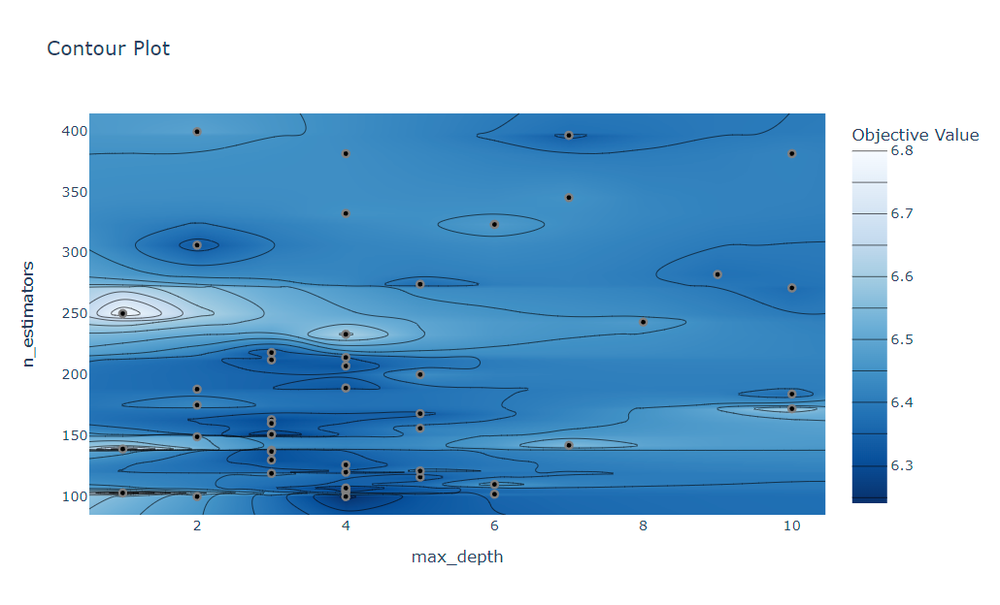

In [114]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["learning_rate", "n_estimators"])
fig.show()

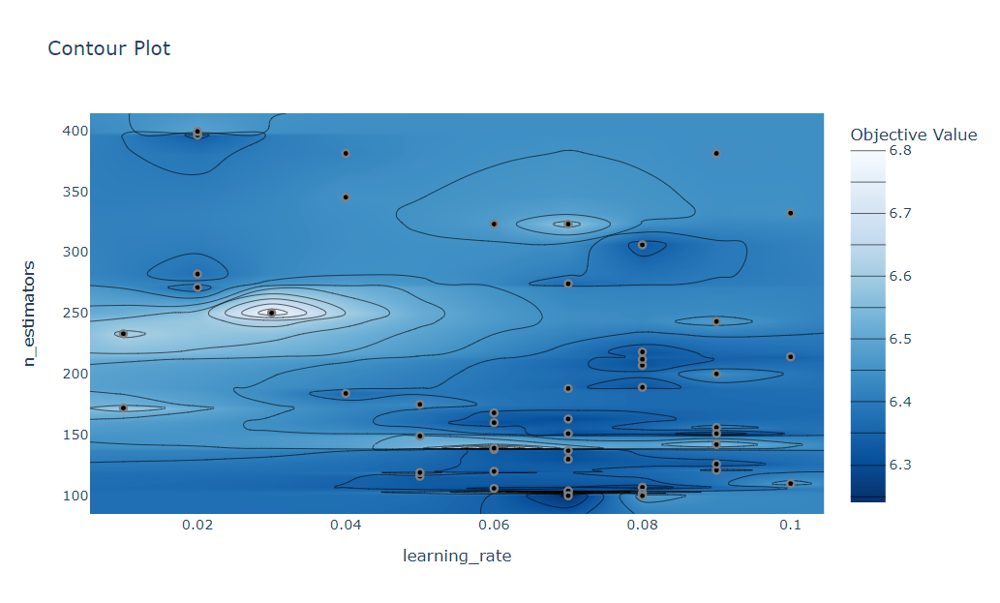

In [115]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["subsample", "n_estimators"])
fig.show()

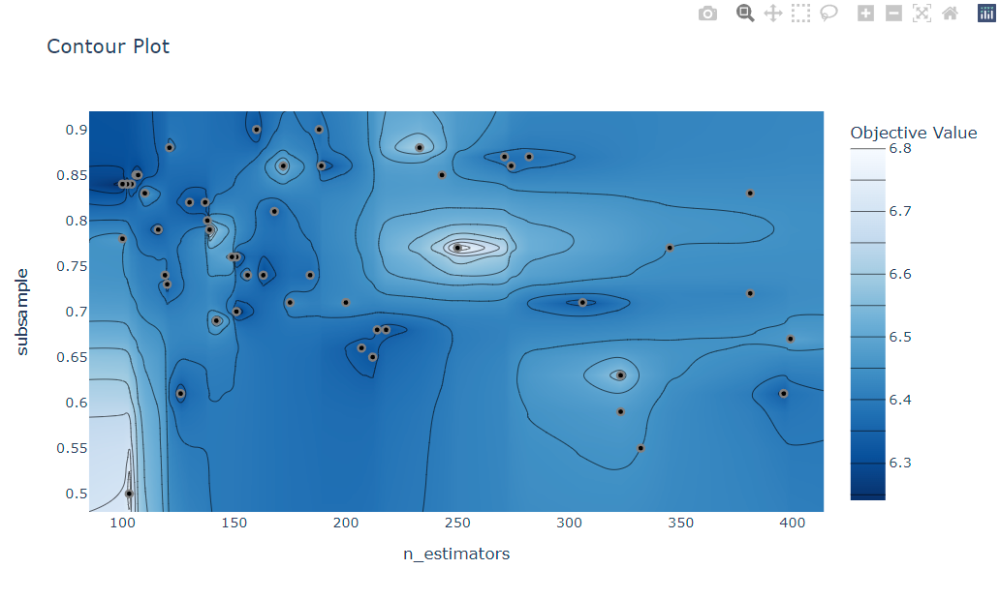

Делаем корректировку параметров и окончательный подбор.

[I 2023-08-24 10:27:34,602] A new study created in memory with name: no-name-3796d158-4163-482b-ad38-0999a9d62315
[I 2023-08-24 10:27:34,746] Trial 0 finished with value: 6.3 and parameters: {'n_estimators': 290, 'max_depth': 2, 'min_child_samples': 6, 'learning_rate': 0.09999999999999999, 'subsample': 0.8, 'colsample_bytree': 1.0}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:27:34,934] Trial 1 finished with value: 6.37 and parameters: {'n_estimators': 265, 'max_depth': 3, 'min_child_samples': 6, 'learning_rate': 0.08, 'subsample': 0.78, 'colsample_bytree': 1.0}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:27:35,130] Trial 2 finished with value: 6.39 and parameters: {'n_estimators': 197, 'max_depth': 4, 'min_child_samples': 8, 'learning_rate': 0.09, 'subsample': 0.81, 'colsample_bytree': 1.0}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:27:35,224] Trial 3 finished with value: 6.31 and parameters: {'n_estimators': 190, 'max_depth': 2, 'min_child_samples': 8, 'learning_

Лучшие параметры: {'n_estimators': 276, 'max_depth': 2, 'min_child_samples': 7, 'learning_rate': 0.09, 'subsample': 0.76, 'colsample_bytree': 0.7}
Лучшее значение метрики: 6.25


,n_estimators,max_depth,min_child_samples,learning_rate,subsample,colsample_bytree,score
0,276.0,2.0,7.0,0.09,0.76,0.7,6.25
16,274.0,2.0,7.0,0.09,0.67,0.7,6.25
29,264.0,2.0,7.0,0.09,0.67,0.7,6.25
28,281.0,2.0,7.0,0.09,0.69,0.7,6.25
27,276.0,2.0,7.0,0.09,0.67,0.7,6.25
26,279.0,2.0,7.0,0.09,0.68,0.7,6.25
25,278.0,2.0,7.0,0.09,0.67,0.7,6.25
24,276.0,2.0,7.0,0.09,0.67,0.7,6.25
23,281.0,2.0,7.0,0.09,0.69,0.7,6.25
22,276.0,2.0,7.0,0.09,0.68,0.7,6.25


<timed exec>:57: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:73: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



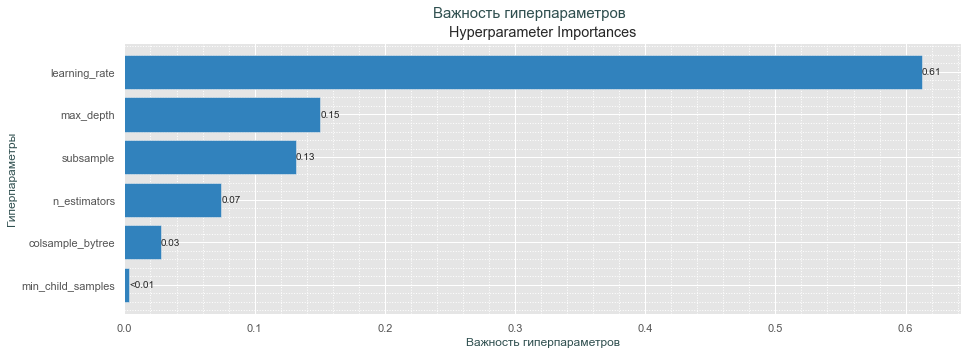

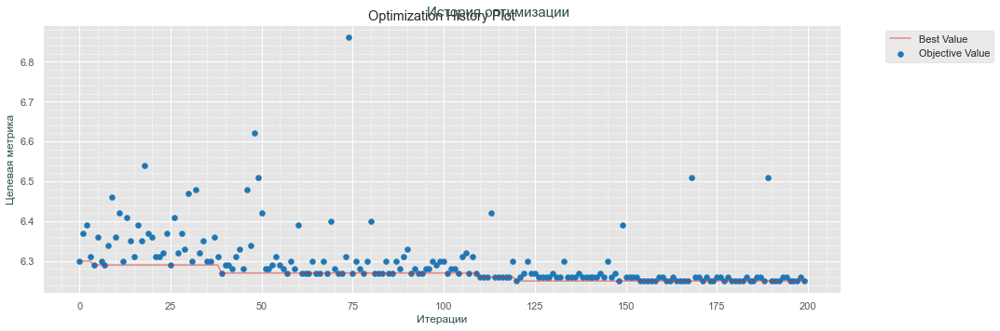

Wall time: 43.8 s


In [116]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    n_estimators = trial.suggest_int('n_estimators', 150, 350)
    max_depth = trial.suggest_int('max_depth', 2, 6)
    min_child_samples = trial.suggest_int('min_child_samples', 6, 8)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1, step=0.01)
    subsample = trial.suggest_float('subsample', 0.5, 0.9, step=0.01)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.7, 1, step=0.1)
    
    # Создаем модель с определенными параметрами
    model = LGBMRegressor(n_estimators=n_estimators,
                          max_depth=max_depth,
                          min_child_samples=min_child_samples,
                          learning_rate=learning_rate,
                          subsample=subsample,
                          colsample_bytree=colsample_bytree,
                          random_state=RANDOM_STATE)
    
    # Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)
    
    # Возвращаем значения метрики
    return score.mean()

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'n_estimators': [],
                       'max_depth': [],
                       'min_child_samples': [],
                       'learning_rate': [],
                       'subsample': [],
                       'colsample_bytree': [],
                       'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

# Сохранение модели с наилучшими параметрами
lgbm = LGBMRegressor(n_estimators=study.best_params['n_estimators'],
                     max_depth=study.best_params['max_depth'],
                     min_child_samples=study.best_params['min_child_samples'],
                     learning_rate=study.best_params['learning_rate'],
                     subsample=study.best_params['subsample'],
                     colsample_bytree=study.best_params['colsample_bytree'],
                     random_state=RANDOM_STATE)

In [117]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"])
fig.show()

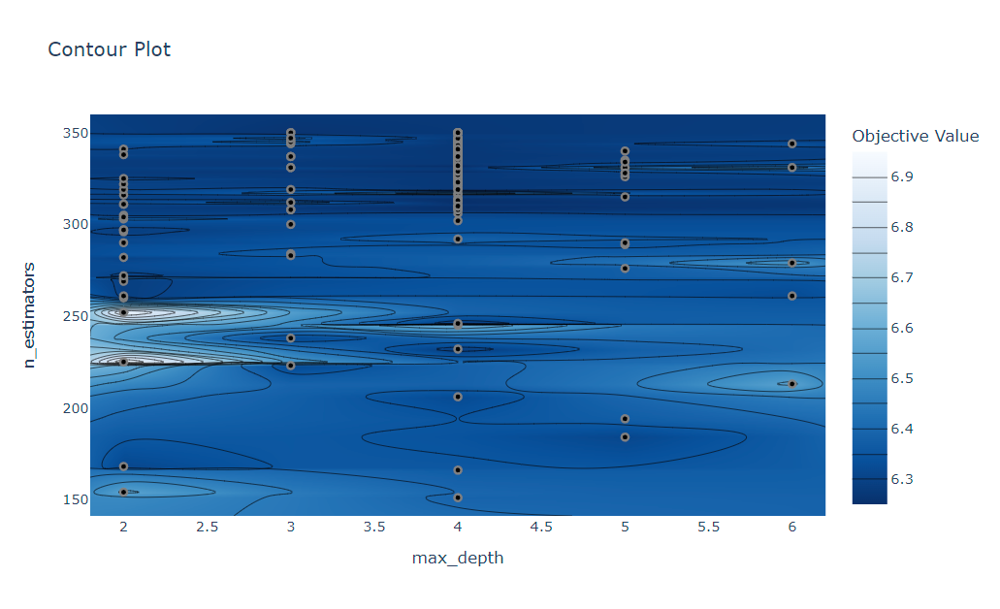

In [118]:
lgbm

LGBMRegressor(colsample_bytree=0.7, learning_rate=0.09, max_depth=2,
              min_child_samples=7, n_estimators=276, random_state=140823,
              subsample=0.76)

### Градиентный бустинг CatBoostRegressor.

[I 2023-08-24 10:28:18,439] A new study created in memory with name: no-name-040408ae-6f0a-42fc-88b3-1dc1a49dc00d
[I 2023-08-24 10:28:21,548] Trial 0 finished with value: 6.37 and parameters: {'iterations': 480, 'depth': 4, 'learning_rate': 0.09}. Best is trial 0 with value: 6.37.
[I 2023-08-24 10:28:25,071] Trial 1 finished with value: 6.31 and parameters: {'iterations': 205, 'depth': 7, 'learning_rate': 0.06999999999999999}. Best is trial 1 with value: 6.31.
[I 2023-08-24 10:28:25,277] Trial 2 finished with value: 6.67 and parameters: {'iterations': 114, 'depth': 2, 'learning_rate': 0.060000000000000005}. Best is trial 1 with value: 6.31.
[I 2023-08-24 10:28:25,708] Trial 3 finished with value: 6.55 and parameters: {'iterations': 423, 'depth': 1, 'learning_rate': 0.060000000000000005}. Best is trial 1 with value: 6.31.
[I 2023-08-24 10:28:27,567] Trial 4 finished with value: 6.33 and parameters: {'iterations': 206, 'depth': 6, 'learning_rate': 0.06999999999999999}. Best is trial 1 wi

Лучшие параметры: {'iterations': 239, 'depth': 7, 'learning_rate': 0.08}
Лучшее значение метрики: 6.3


,iterations,depth,learning_rate,score
0,239.0,7.0,0.08,6.3
1,212.0,7.0,0.06,6.3
2,221.0,7.0,0.08,6.3


<timed exec>:49: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:60: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



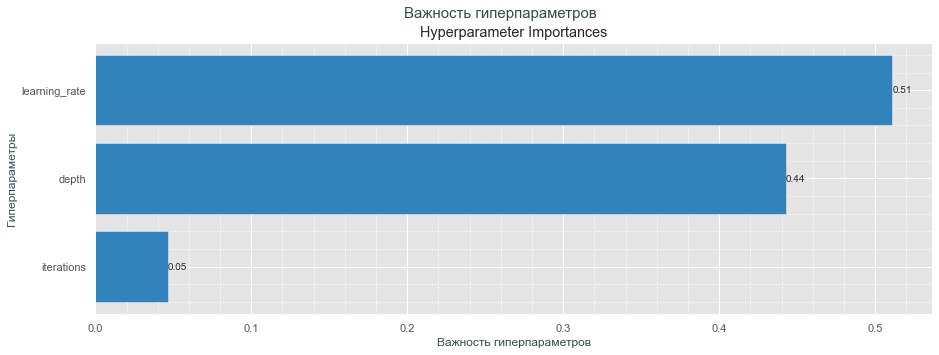

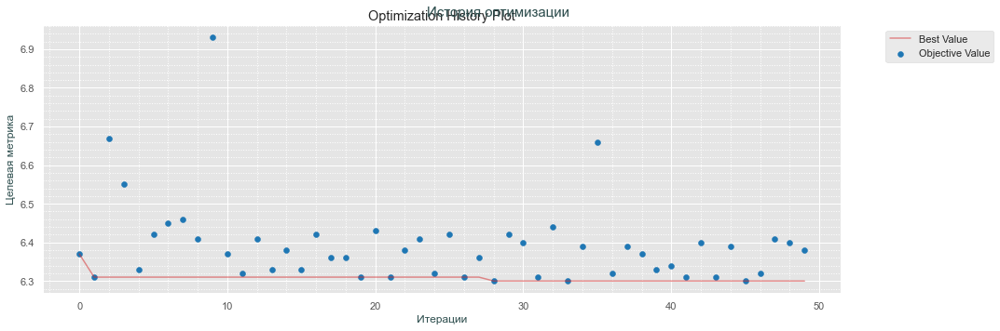

Wall time: 5min 8s


In [119]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    iterations = trial.suggest_int('iterations', 100, 500)
    depth = trial.suggest_int('depth', 1, 10)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1, step=0.01)

# Создаем модель с определенными параметрами
    model = CatBoostRegressor(iterations=iterations,
                              depth=depth,
                              learning_rate=learning_rate,
                              random_state=RANDOM_STATE,
                              silent=True)

# Оцениваем качество модели с помощью кросс-валидации
    scores = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)

# Возвращаем среднее значение метрики
    return abs(scores.mean())

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'iterations': [],
                       'depth': [],
                        'learning_rate': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры', fontsize=12, color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров', fontsize=15, color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации', fontsize=12, color='DarkSlateGray')
plt.ylabel('Целевая метрика', fontsize=12, color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n', fontsize=15, color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.show()

In [120]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["iterations", "depth"])
fig.show()

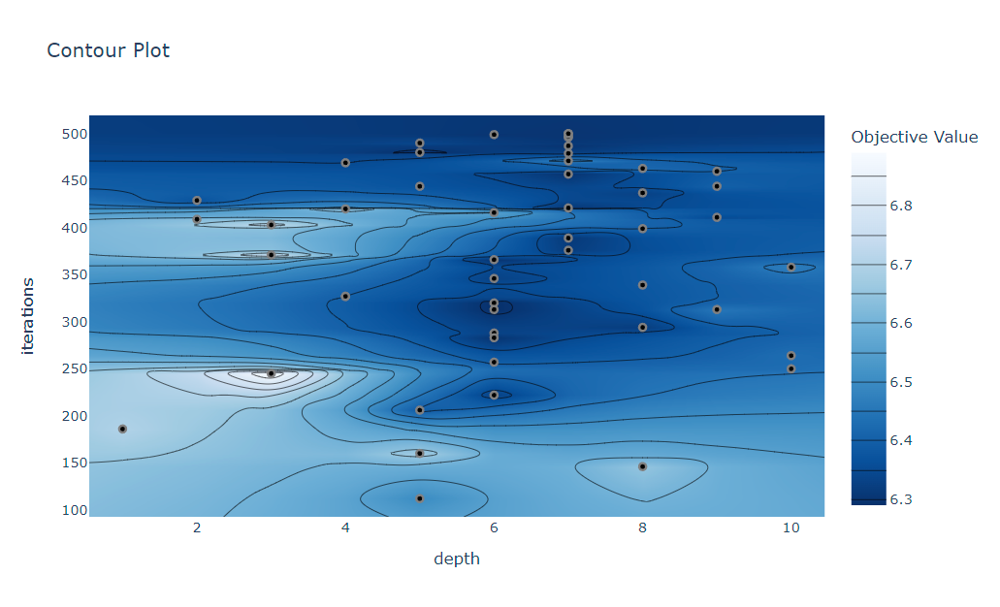

In [121]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["iterations", "learning_rate"])
fig.show()

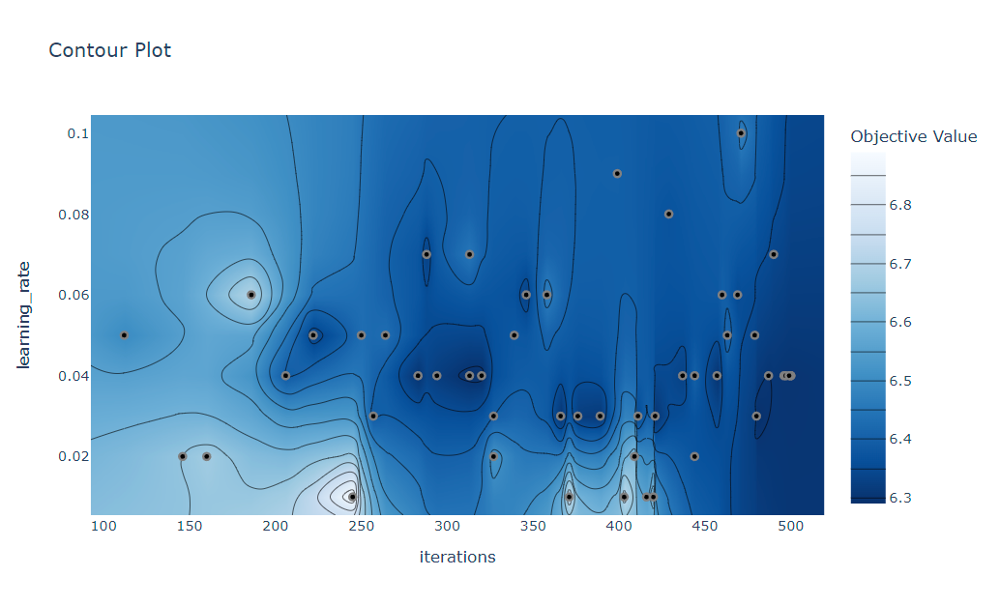

Сужаем диапозон параметров для подбора.

[I 2023-08-24 10:33:26,960] A new study created in memory with name: no-name-b3be6fe5-b320-4c8d-af84-dc7eed094f89
[I 2023-08-24 10:33:31,650] Trial 0 finished with value: 6.3 and parameters: {'iterations': 500, 'depth': 6, 'learning_rate': 0.04}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:33:32,390] Trial 1 finished with value: 6.36 and parameters: {'iterations': 469, 'depth': 2, 'learning_rate': 0.060000000000000005}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:33:35,262] Trial 2 finished with value: 6.53 and parameters: {'iterations': 517, 'depth': 5, 'learning_rate': 0.01}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:33:37,968] Trial 3 finished with value: 6.34 and parameters: {'iterations': 306, 'depth': 6, 'learning_rate': 0.06999999999999999}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:33:45,167] Trial 4 finished with value: 6.31 and parameters: {'iterations': 475, 'depth': 7, 'learning_rate': 0.03}. Best is trial 0 with value: 6.3.
[I 2023-08-24 10:33:4

Лучшие параметры: {'iterations': 278, 'depth': 4, 'learning_rate': 0.08}
Лучшее значение метрики: 6.29


,iterations,depth,learning_rate,score
0,278.0,4.0,0.08,6.29
1,346.0,5.0,0.06,6.29
2,305.0,5.0,0.07,6.29
3,329.0,6.0,0.04,6.29


<timed exec>:48: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:64: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



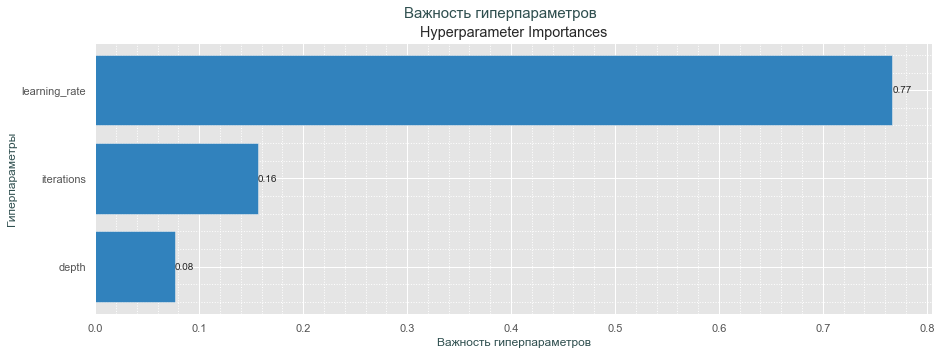

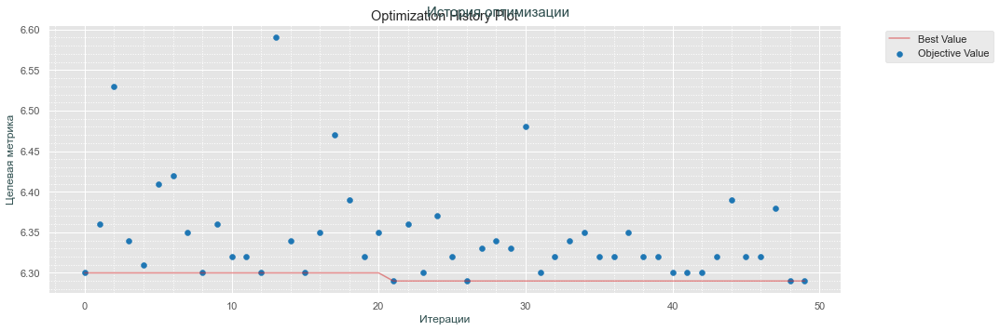

Wall time: 2min 24s


In [122]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    iterations = trial.suggest_int('iterations', 250, 600)
    depth = trial.suggest_int('depth', 2, 8)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.08, step=0.01)
# Создаем модель с определенными параметрами
    model = CatBoostRegressor(iterations=iterations,
                              depth=depth,
                              learning_rate=learning_rate,
                              random_state=RANDOM_STATE,
                              silent=True)

# Оцениваем качество модели с помощью кросс-валидации
    scores = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)

# Возвращаем среднее значение метрики
    return abs(scores.mean())

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'iterations': [],
                       'depth': [],
                        'learning_rate': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [123]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["iterations", "depth"])
fig.show()

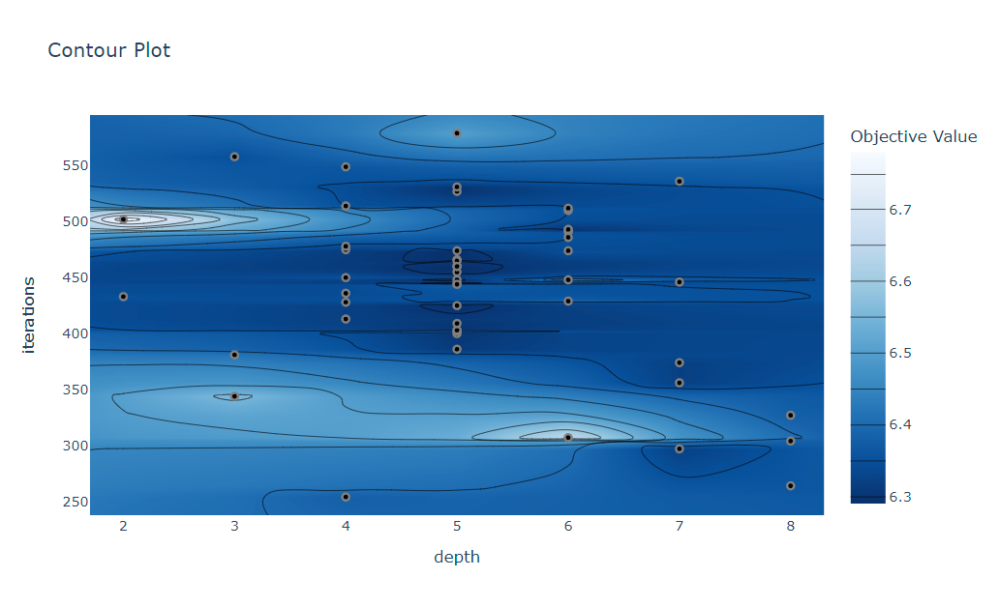

In [124]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["iterations", "learning_rate"])
fig.show()

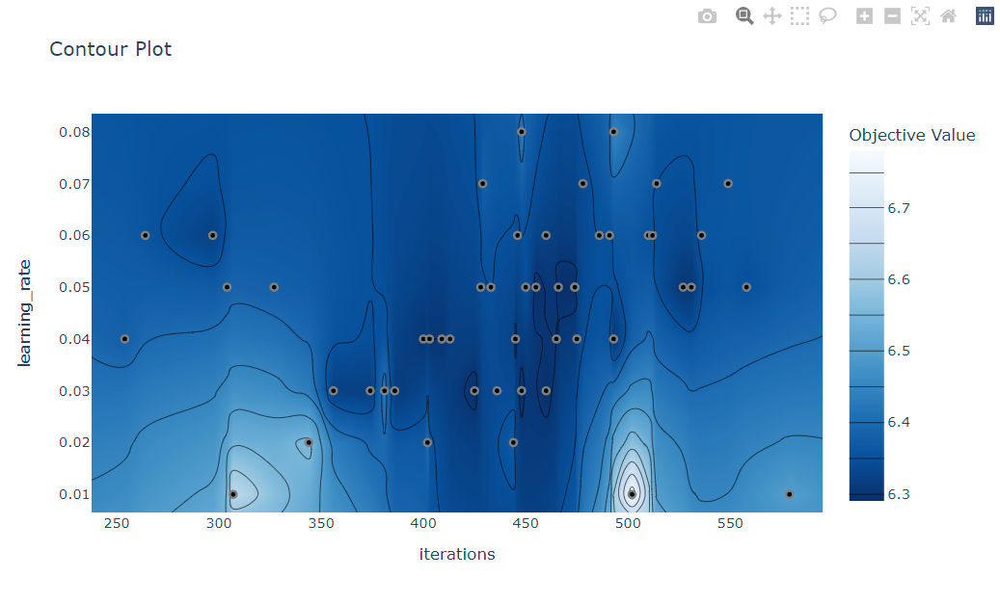

Редактируем диапазоны параметров и делаем окончательный подбор.

[I 2023-08-24 10:35:51,483] A new study created in memory with name: no-name-b1ca16d1-9e93-4d5a-bbe9-39ec2bed48d2
[I 2023-08-24 10:35:54,756] Trial 0 finished with value: 6.33 and parameters: {'iterations': 333, 'depth': 6, 'learning_rate': 0.06}. Best is trial 0 with value: 6.33.
[I 2023-08-24 10:35:58,415] Trial 1 finished with value: 6.35 and parameters: {'iterations': 416, 'depth': 6, 'learning_rate': 0.02}. Best is trial 0 with value: 6.33.
[I 2023-08-24 10:36:00,402] Trial 2 finished with value: 6.32 and parameters: {'iterations': 361, 'depth': 5, 'learning_rate': 0.03}. Best is trial 2 with value: 6.32.
[I 2023-08-24 10:36:04,443] Trial 3 finished with value: 6.29 and parameters: {'iterations': 461, 'depth': 6, 'learning_rate': 0.04}. Best is trial 3 with value: 6.29.
[I 2023-08-24 10:36:11,497] Trial 4 finished with value: 6.3 and parameters: {'iterations': 484, 'depth': 7, 'learning_rate': 0.03}. Best is trial 3 with value: 6.29.
[I 2023-08-24 10:36:13,929] Trial 5 finished wi

Лучшие параметры: {'iterations': 373, 'depth': 6, 'learning_rate': 0.04}
Лучшее значение метрики: 6.28


,iterations,depth,learning_rate,score
0,373.0,6.0,0.04,6.28
58,358.0,6.0,0.04,6.28
67,363.0,6.0,0.04,6.28
66,359.0,6.0,0.04,6.28
65,350.0,6.0,0.04,6.28
64,354.0,6.0,0.04,6.28
63,368.0,6.0,0.04,6.28
62,336.0,6.0,0.04,6.28
61,361.0,6.0,0.04,6.28
60,364.0,6.0,0.04,6.28


<timed exec>:49: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:65: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



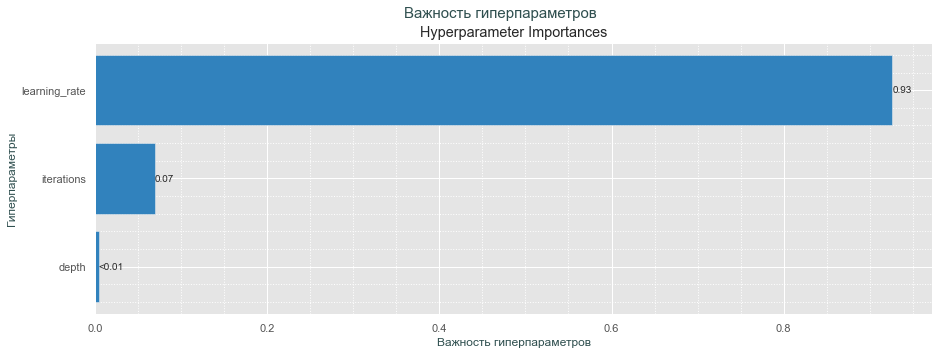

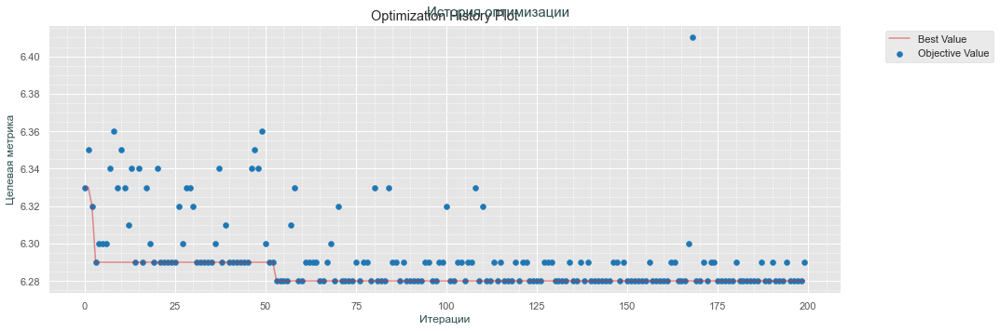

Wall time: 11min 36s


In [125]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    iterations = trial.suggest_int('iterations', 300, 500)
    depth = trial.suggest_int('depth', 5, 7)
    learning_rate = trial.suggest_float('learning_rate', 0.02, 0.06, step=0.01)

# Создаем модель с определенными параметрами
    model = CatBoostRegressor(iterations=iterations,
                              depth=depth,
                              learning_rate=learning_rate,
                              random_state=RANDOM_STATE,
                              silent=True)

# Оцениваем качество модели с помощью кросс-валидации
    scores = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)

# Возвращаем среднее значение метрики
    return abs(scores.mean())

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаем датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame({'iterations': [],
                       'depth': [],
                        'learning_rate': [],
                        'score': []})
# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаем график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Важность гиперпараметров',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Гиперпараметры',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Важность гиперпараметров',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

# Создаем график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Итерации',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Целевая метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('История оптимизации \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

# Сохранение модели с наилучшими параметрами
catboost = CatBoostRegressor(iterations=study.best_params['iterations'],
                             depth=study.best_params['depth'],
                             learning_rate=study.best_params['learning_rate'],
                             random_state=RANDOM_STATE,
                             silent=True)

In [126]:
catboost.get_params()

{'iterations': 373,
 'learning_rate': 0.04,
 'depth': 6,
 'loss_function': 'RMSE',
 'silent': True,
 'random_state': 140823}

### Support Vector Regression.

[I 2023-08-24 10:47:28,072] A new study created in memory with name: no-name-b7da7403-18ec-4f79-9549-d4776d15c34a
[I 2023-08-24 10:47:28,517] Trial 0 finished with value: 7.19 and parameters: {'C': 390.02, 'epsilon': 7.71, 'kernel': 'rbf', 'degree': 4}. Best is trial 0 with value: 7.19.
[I 2023-08-24 10:47:51,516] Trial 1 finished with value: 6.55 and parameters: {'C': 772.88, 'epsilon': 5.29, 'kernel': 'linear', 'degree': 5}. Best is trial 1 with value: 6.55.
[I 2023-08-24 10:48:18,053] Trial 2 finished with value: 6.53 and parameters: {'C': 816.83, 'epsilon': 3.3499999999999996, 'kernel': 'linear', 'degree': 3}. Best is trial 2 with value: 6.53.
[I 2023-08-24 10:48:18,471] Trial 3 finished with value: 45.6 and parameters: {'C': 240.6, 'epsilon': 2.36, 'kernel': 'poly', 'degree': 5}. Best is trial 2 with value: 6.53.
[I 2023-08-24 10:48:20,773] Trial 4 finished with value: 7.68 and parameters: {'C': 703.71, 'epsilon': 0.29000000000000004, 'kernel': 'rbf', 'degree': 3}. Best is trial 2

Лучшие параметры: {'C': 10.97, 'epsilon': 2.1199999999999997, 'kernel': 'linear', 'degree': 5}
Лучшее значение метрики: 6.45


,C,epsilon,kernel,degree,score
0,10.97,2.12,linear,5.0,6.45


<timed exec>:54: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:70: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



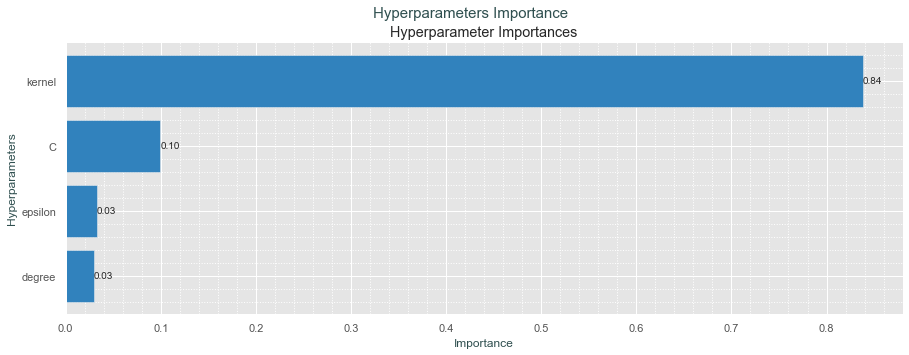

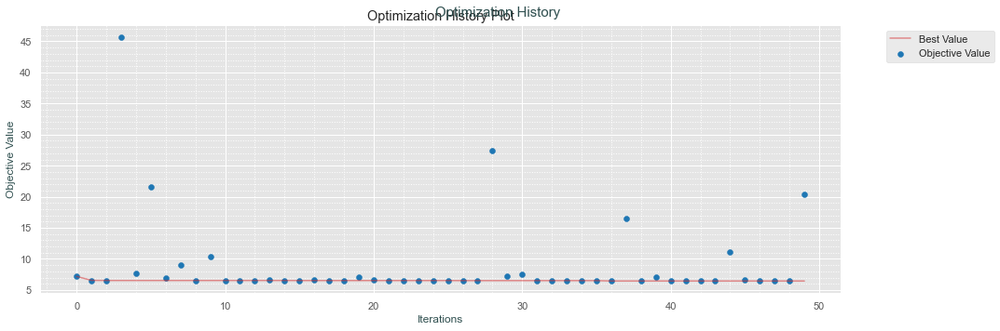

Wall time: 9min 40s


In [127]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    C = trial.suggest_float('C', 0.01, 1000, step=0.01)
    epsilon = trial.suggest_float('epsilon', 0.01, 10, step=0.01)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'poly'])
    degree = trial.suggest_int('degree', 2, 5)

    # Создаем модель SVR с определенными параметрами
    model = SVR(C=C,
                epsilon=epsilon,
                kernel=kernel,
                degree=degree,
                max_iter=-1)

    # Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)

    # Возвращает значение метрики
    return score.mean()

# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаём датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame(
    {'C': [],
     'epsilon': [],
     'kernel': [],
     'degree': [],
     'score': []}
)

# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаём график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Importance',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Hyperparameters',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Hyperparameters Importance',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

#  Создаём график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Iterations',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Objective Value',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Optimization History \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)
plt.show()

In [128]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["kernel", "epsilon"])
fig.show()

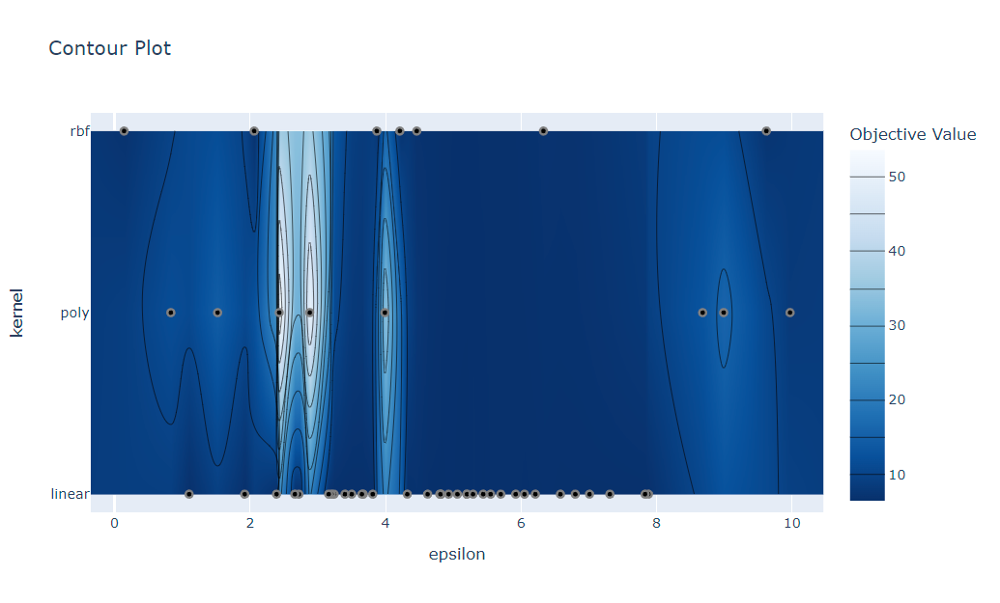

In [129]:
# Создаём график контура
fig = optuna.visualization.plot_contour(study, params=["C", "degree"])
fig.show()

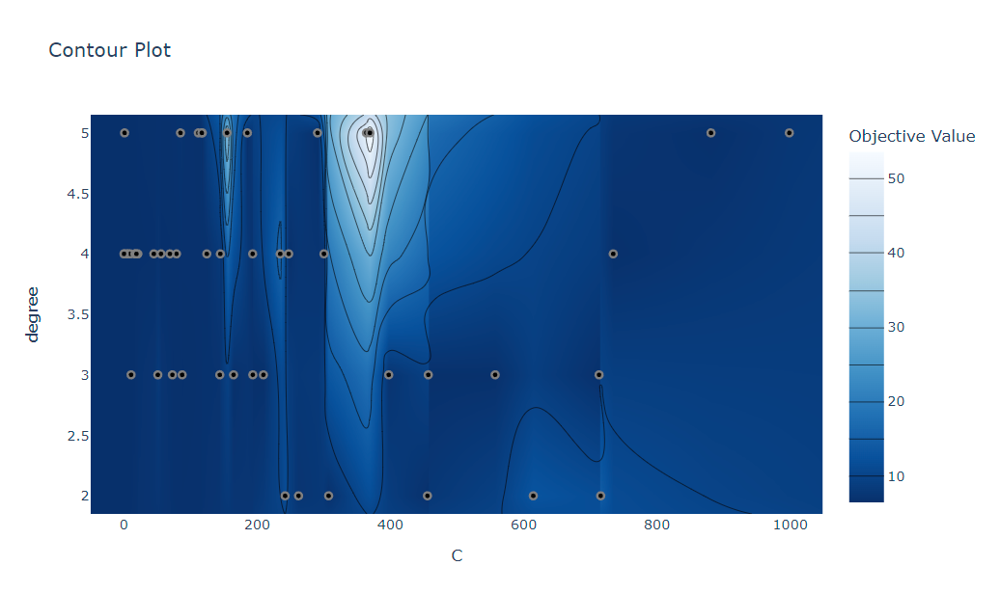

Корректируем диапазоны гиперпараметров.

[I 2023-08-24 10:57:08,292] A new study created in memory with name: no-name-a200c9c2-6db9-4536-9e7d-f570cf7c63cf
[I 2023-08-24 10:57:16,023] Trial 0 finished with value: 6.54 and parameters: {'C': 213.62, 'epsilon': 5.3, 'kernel': 'linear', 'degree': 4}. Best is trial 0 with value: 6.54.
[I 2023-08-24 10:57:29,999] Trial 1 finished with value: 6.58 and parameters: {'C': 408.39, 'epsilon': 7.1000000000000005, 'kernel': 'linear', 'degree': 4}. Best is trial 0 with value: 6.54.
[I 2023-08-24 10:57:33,419] Trial 2 finished with value: 6.57 and parameters: {'C': 143.26999999999998, 'epsilon': 6.5, 'kernel': 'linear', 'degree': 4}. Best is trial 0 with value: 6.54.
[I 2023-08-24 10:57:44,468] Trial 3 finished with value: 6.57 and parameters: {'C': 397.51, 'epsilon': 6.0, 'kernel': 'linear', 'degree': 3}. Best is trial 0 with value: 6.54.
[I 2023-08-24 10:57:45,049] Trial 4 finished with value: 6.48 and parameters: {'C': 16.700000000000003, 'epsilon': 5.6000000000000005, 'kernel': 'linear', 

Лучшие параметры: {'C': 0.3, 'epsilon': 2.5, 'kernel': 'linear', 'degree': 3}
Лучшее значение метрики: 6.42


,C,epsilon,kernel,degree,score
0,0.3,2.5,linear,3.0,6.42


<timed exec>:54: ExperimentalWarning:

plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.

<timed exec>:70: ExperimentalWarning:

plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.



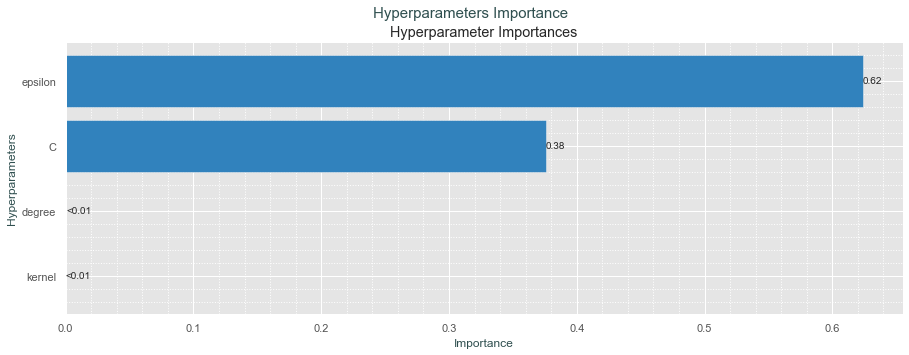

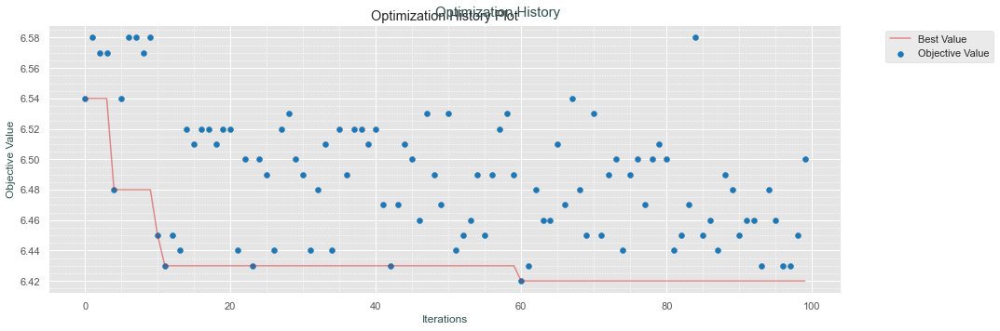

Wall time: 7min 12s


In [130]:
%%time

def objective(trial):
    # Определяем параметры для подбора
    C = trial.suggest_float('C', 0.01, 600, step=0.01)
    epsilon = trial.suggest_float('epsilon', 1, 8, step=0.1)
    kernel = trial.suggest_categorical('kernel', ['linear'])
    degree = trial.suggest_int('degree', 3, 4)

    # Создаем модель SVR с определенными параметрами
    model = SVR(C=C,
                epsilon=epsilon,
                kernel=kernel,
                degree=degree,
                max_iter=-1)

    # Оцениваем качество модели с помощью кросс-валидации
    score = round(abs(cross_val_score(model,
                                      features_train,
                                      target_train,
                                      cv=kf,
                                      scoring='neg_mean_absolute_error', n_jobs=-1)).mean(), 2)

    # Возвращает значение метрики
    return score.mean()


# Создаем объект Study и запускаем оптимизацию
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

print('Лучшие параметры:', study.best_params)
print('Лучшее значение метрики:', study.best_value)

# Создаём датафрейм с значениями гиперпараметров и метрикой
results = pd.DataFrame(
    {'C': [],
     'epsilon': [],
     'kernel': [],
     'degree': [],
     'score': []})

# Заполняем данными из best_trials
for trial in study.best_trials:
    params = trial.params
    params['score'] = trial.value
    results = results.append(params, ignore_index=True)

# Сортируем датафрейм по убыванию значения метрики
results = results.sort_values(by='score', ascending=False)

# Выводим 10 лучших моделей
display(results.head(10))

# Создаём график важности параметров
optuna.visualization.matplotlib.plot_param_importances(study)
plt.xlabel('Importance',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Hyperparameters',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Hyperparameters Importance',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor',
         linestyle=':')
plt.grid(True)

#  Создаём график истории оптимизации
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.tight_layout()
plt.xlabel('Iterations',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Objective Value',
           fontsize=12,
           color='DarkSlateGray')
plt.suptitle('Optimization History \n \n',
             fontsize=15,
             color='DarkSlateGray')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':')
plt.grid(True)
plt.show()

# Сохранение модели с наилучшими параметрами
svr = SVR(C=study.best_params['C'],
            epsilon=study.best_params['epsilon'],
            kernel=study.best_params['kernel'],
            degree=study.best_params['degree'])

In [131]:
svr

SVR(C=0.3, epsilon=2.5, kernel='linear')

### Проанализируем качество моделей.

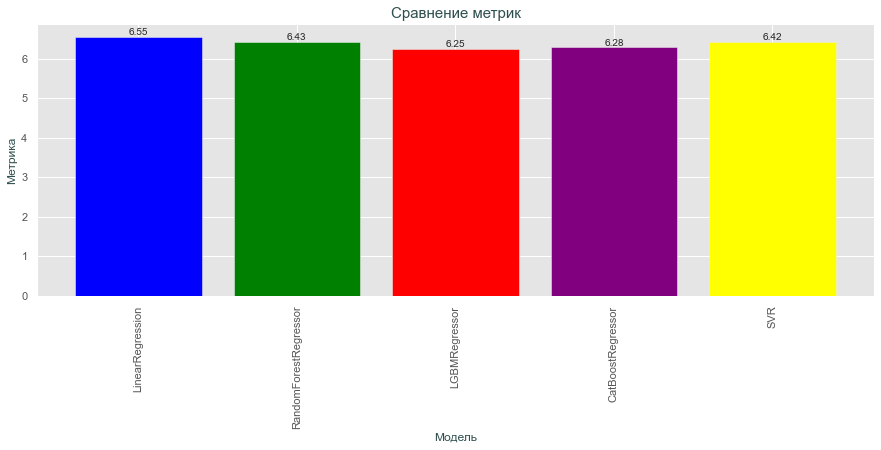

In [132]:
def calculate_metric(model):
    # Вычисление средней абсолютной ошибки с помощью кросс-валидации
    scores = cross_val_score(model,
                             features_train,
                             target_train,
                             cv=kf,
                             scoring='neg_mean_absolute_error', n_jobs=-1)
    metric = round(abs(scores.mean()), 2)
    
    return metric

metrics = {}
metrics['LinearRegression'] = calculate_metric(regressor)
metrics['RandomForestRegressor'] = calculate_metric(forest)
metrics['LGBMRegressor'] = calculate_metric(lgbm)
metrics['CatBoostRegressor'] = calculate_metric(catboost)
metrics['SVR'] = calculate_metric(svr)

models = list(metrics.keys())
values = list(metrics.values())
colors = ['blue', 'green', 'red', 'purple', 'yellow']

# Построение графика сравнения метрик
plt.bar(models, values, color=colors)
plt.xlabel('Модель',
           fontsize=12,
           color='DarkSlateGray')
plt.ylabel('Метрика',
           fontsize=12,
           color='DarkSlateGray')
plt.title('Сравнение метрик',
          fontsize=15,
          color='DarkSlateGray')
plt.xticks(rotation=90)
for i, v in enumerate(values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.show()

Все модели показали себя хорошо на кросвалидации. Лучшая - LGBMRegressor (lgbm).

## Тестирование лучшей модели.

In [133]:
model = DummyRegressor()
model.fit(features_train, target_train)
lgbm_mae_test = round(mae(target_test, model.predict(features_test)), 2)
print('На простой модели регрессии МАЕ = ', lgbm_mae_test)

На простой модели регрессии МАЕ =  8.69


In [134]:
lgbm.fit(features_train, target_train)
lgbm_mae_test = round(mae(target_test, lgbm.predict(features_test)), 2)
print('На тестовой выборке МАЕ = ', lgbm_mae_test)

На тестовой выборке МАЕ =  6.62


Наша модель превзошла по метрике модели, которая всегда предсказывает среднее значение целевой переменной и простую модель регрессии.

Полученная средняя абсолютная ошибка нас устраивает, принимаем эту модель как удовлетворяющую требованиям.

In [135]:
lgbm

LGBMRegressor(colsample_bytree=0.7, learning_rate=0.09, max_depth=2,
              min_child_samples=7, n_estimators=276, random_state=140823,
              subsample=0.76)

## Степень влияния признаков на целевой показатель.

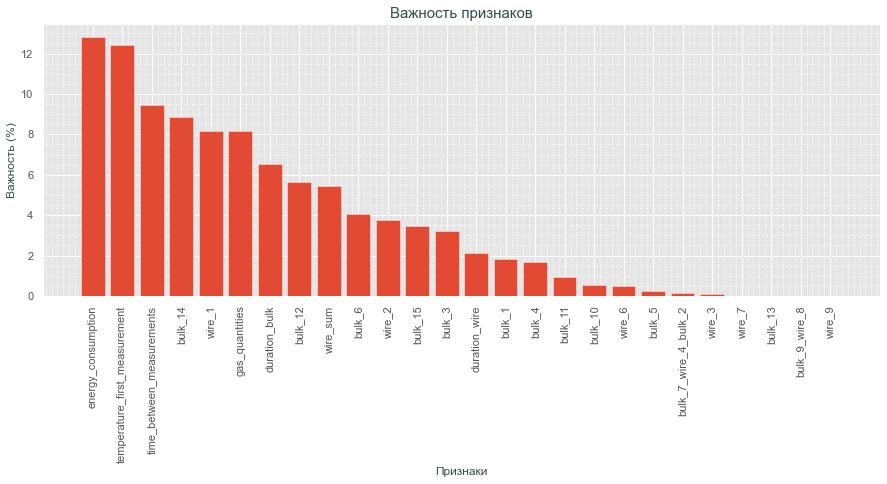

Таблица значимости признаков:


,Признаки,Важность (%)
0,energy_consumption,12.816300
1,temperature_first_measurement,12.421952
2,time_between_measurements,9.431482
3,bulk_14,8.839961
4,wire_1,8.149852
5,gas_quantities,8.149852
6,duration_bulk,6.539599
7,bulk_12,5.619454
8,wire_sum,5.455143
9,bulk_6,4.042064


In [137]:
importance = lgbm.feature_importances_
# Сортируем индексы важности модели в порядке убывания
sorted_indices = np.argsort(importance)[::-1] 
# Получаем отсортированные названия признаков
sorted_features = features_train.columns[sorted_indices] 
 # Получаем отсортированные значения важности признаков
sorted_importance = importance[sorted_indices]
# Вычисляем общую важность всех признаков
total_importance = np.sum(sorted_importance)
 # Вычисляем процентную важность каждого признака
sorted_importance_percent = (sorted_importance / total_importance) * 100  

# Создаем график
plt.figure(figsize=(15, 5))
 # Строим столбчатую диаграмму с отсортированными признаками и их важностью
plt.bar(sorted_features, sorted_importance_percent)  
plt.xticks(rotation='vertical')  
plt.xlabel('Признаки',
           fontsize=12,
           color='DarkSlateGray')  
plt.ylabel('Важность (%)',
           fontsize=12,
           color='DarkSlateGray')  
plt.title('Важность признаков',
          fontsize=15,
          color='DarkSlateGray')  
plt.minorticks_on() 
plt.grid(which='minor',
         linestyle=':')  
plt.grid(True) 
plt.show()

print("Таблица значимости признаков:")
df_importance = pd.DataFrame({"Признаки": sorted_features,
                              "Важность (%)": sorted_importance_percent}).style.background_gradient('coolwarm')
df_importance

***
**На основе анализа важности признаков можно сделать следующие выводы:**
***
***
- Наибольшую важность для целевой переменной имеют признаки:
- - `temperature_first_measurement` - температура в начале процесса обработки.
- - `energy_consumption` - потребляемая в процессе обработки энергия.
- - `time_between_measurements` - сумарное время нагрева.
**Эти признаки оказывают наибольшее влияние на предсказание целевой переменной.*
***
- *Существенно влияют на целевую переменную:*
- - `bulk_14` - сыпучий материал.
- - `wire_1` - проволочный материал.
- - `gas_quantities` - количество газа для продувки.
- - `duration_bulk` - сумарное время подачи сыпучих материалов.
- - `bulk_12` - сыпучий материал.
- - `wire_sum` - общее количество подаваемых проволочных материалов.
- - `bulk_6` - сыпучий материал.
- - `wire_2` - проволочный материал.
- - `bulk_15` - сыпучий материал.
- - `bulk_3` - сыпучий материал.
- - `duration_wire` - сумарное время подачи проволочных материалов.
- - `bulk_1` - сыпучий материал.
- - `bulk_4` - сыпучий материал.
- - `bulk_11` - сыпучий материал.
***
- *Мало Влияющие:*
- - `bulk_10` - сыпучий материал.
- - `wire_6` - проволочный материал.
- - `bulk_5` - сыпучий материал.
- -	`bulk_7` - сыпучий материал.
- - `wire_4` - проволочный материал.
- -	`bulk_2` - сыпучий материал.
- -	`wire_3` - проволочный материал.
***
- *Не оказывают влияния:*
- - `bulk_9`, `bulk_13` - сыпучие материалы.
- - `wire_7`,	`wire_8`,	`wire_9` - проволочные материалы.
***
Таким образом, наиболее важные признаки для предсказания целевой переменной включают температуру первого измерения, потребление энергии, время обработки, данные о некоторых веществах и проволоке.

## Отчёт по решению.

Перед нами стояла задача: 
- для металлургического комбината построить модель, которая предскажет температуру стали.
***
Нам были предоставлены:
- Краткое описание этапа обработки стали.
- Данные, состоящие из файлов формата `csv`, полученных из разных источников:
- - `data_arc_new.csv` — данные об электродах;
- - `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём);
- - `data_bulk_time_new.csv` — данные о подаче сыпучих материалов (время);
- - `data_gas_new.csv` — данные о продувке сплава газом;
- - `data_temp_new.csv` — результаты измерения температуры;
- - `data_wire_new.csv` — данные о проволочных материалах (объём);
- - `data_wire_time_new.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии.
***
Был составлен приблизительный план работы:

1. Описание проекта, задачи
​
2. Изучение и подготовка данных:
- Выгрузка данных
- Анализ данных
- Описание данных
​
3. Предобработка данных:
- Проверка типов данных
- Работа с пропусками
​
4. Подготовка данных:
- Проверка на мультиколлинеарность
- Формирование итоговых датафреймов
- Формирование признаков
- Формирование выборок
​
5. Обучение моделей.
​
6. Тестирование модели.
​
7. Итоговый вывод.
***
Для выполнения поставленной задачи использовались следующие библиотеки и модули:
- os: модуль для работы с операционной системой (файлы и папки)
- optuna: библиотека для оптимизации гиперпараметров моделей
- numpy: библиотека для работы с многомерными массивами и математическими функциями
- pandas: библиотека для работы с данными в виде таблиц (DataFrame)
- seaborn: библиотека для визуализации данных
- plotly.express: библиотека для создания интерактивных графиков и визуализаций
- matplotlib.pyplot: библиотека для создания статических графиков и визуализаций
- time: модуль для работы со временем
- sklearn.svm.SVR: класс для обучения модели методом опорных векторов (Support Vector Regression)
- lightgbm.LGBMRegressor: класс для обучения градиентного бустинга на деревьях (LightGBM)
- catboost.CatBoostRegressor: класс для обучения градиентного бустинга на деревьях (CatBoost)
- sklearn.dummy.DummyRegressor: класс для обучения простых базовых моделей (Dummy)
- sklearn.pipeline.make_pipeline: функция для создания конвейера из нескольких этапов обработки данных и моделей
- sklearn.preprocessing.StandardScaler: класс для стандартизации данных (Standardization)
- sklearn.linear_model.LinearRegression: класс для обучения линейной регрессии
- sklearn.ensemble.RandomForestRegressor: класс для обучения случайного леса (Random Forest)
- sklearn.model_selection.train_test_split: функция для разделения данных на обучающую и тестовую выборки
- sklearn.metrics.mean_absolute_error: функция для вычисления средней абсолютной ошибки (Mean Absolute Error)
- sklearn.model_selection.KFold: класс для разделения данных на фолды в кросс-валидации (KFold)
- sklearn.model_selection.cross_val_score: функция для оценки модели с использованием кросс-валидации
***
По требованиям заказчика.
- был зафиксирован параметр установки начального состояния генератора псевдослучайных чисел `RANDOM_STATE = 140823`
- целевая метрика $МАЕ\ngtr 6.8$
***
В ходе ознакомления с данными было установлено:
1. `df_arc`
Данные содержат информацию о начале и конце нагрева дугой, а также активной и реактивной мощности для каждого ключевого значения. Всего в данных содержится 14876 записей.
Типы данных в столбцах : 
- ключ - целочисленный,
- время начала и конца нагрева - объект,
- мощности - числовые значения.
Пропущенные значения отсутствуют.
2. `df_bulk`
Данные содержат информацию о добавлении сыпучих материалов в процессе обработки. Всего в данных содержится 3129 записей. В столбцах `Bulk 1`...`Bulk 15` указаны объемы добавленных материалов для каждого ключевого значения.

В данных имеются пропущенные значения для большинства столбцов, что означает, что не все материалы были добавлены для каждого ключевого значения.

3. `df_bulk_time`
В таблице представлены данные о времени подачи сыпучих материалов. Всего в таблице 3129 строк и 16 столбцов, как и в `df_bulk`. В столбце `key` указан ключ для каждой записи. В столбцах `Bulk 1`...`Bulk 15` указаны временные метки для выполнения операций `Bulk`. Некоторые столбцы содержат пропущенные значения. Для `key` выполнены несколько операций `Bulk`, для разных`key` разные и в рвзных количествах. (`Bulk 14` выполнялся 2806 раз, а `Bulk 8` - 1)
Данные в столбцах `Bulk 1`...`Bulk 15` представлены в формате object.

4. `df_gas`
Данные предоставляют информацию о продувке сплава газом. Набор данных содержит 3239 строк и 2 столбца: `key` и `Газ 1`. Столбец `key` представляет собой номер партии, а столбец `Газ 1` содержит числовые значения, отражающие объем газа для продувки. Оба столбца имеют правильные типы данных.

5. `df_temp`
Данные из файла содержат информацию о замерах температуры в разных моментах времени. В наборе данных представлено 18092 строк и 3 столбца:
- `key` - номер партии,
- `Время замера` - дата и время проведения замера,
- `Температура` - числовое значение температуры.

Столбец `key` представляет собой уникальный идентификатор, который, используется для связи с другими таблицами. Столбец `Время замера` содержит информацию о точной дате и времени проведения замера температуры. Столбец `Температура` содержит числовые значения, отражающие измеренную температуру.

Столбец `Температура` содержит недостающие значения (`NaN`) в некоторых строках (14665 непустых значений из 18092).

6. Информация о точной дате и времени имела тип данных `object` и была преобразована в тип `datetime` для дальнейшего анализа.
***
В ходе предобработки данных было установлено:
1. В `df_arc` записи с `2019-05-03 11:02:14` по `2019-09-06 17:26:15`, количество партий - `3214` (проводилась повторная обработка и по этому количество записей - `14876`).

2. `Активная мощность` от `0.223120` до `1.463773`. `Реактивная мощность` от `-715.479924` до `1.270284`. Отрицательное значение одно и выглядело не логично, имело более высокий порядок(e+02, остальные значения в интервале e-01 - e+00). 

3. Между активной и реактивной мощностью была установлена высокая положительная корреляция(0.97). Что позволило исправить некорректное значение реактивной мощности, заменив его на произведение "Активной мощности" на среднюю пропорцию "Реактивной мощности" к "Активной мощности". 

4. Анализируя данные по количеству обработок и партий на сталелитейном заводе, были сделаны следующие наблюдения:
- Большинство партий (51.37%) прошли 4 или 5 обработок.
- Примерно треть партий (32.75%) прошли 3, 6 или 7 обработок.
- Оставшиеся партии (15.88%) были подвергнуты 2, 8, 9, 10 или более обработкам.
- Партии с 10 и более обработками составляют менее 1% от общего количества партий.

Таким образом, основная часть партий на сталелитейном заводе проходит 4 или 5 обработок, а среднее количество обработок для одной партии : 4.63.

5. В промежуток с 13 по 18 июля отсутствуют записи в данных.(скорее всего или авария или ремонт оборудования - что-то от чего производство не работало)

6. В среднем процесс нагрева электродами длится около 3,5 минут, минимальная продолжительность обработки составляет 11 секунд, максимальная - чуть больше 15 минут.

7. Мы вычислили потребляемую энергию, умножив продолжительность дуги в секундах (разность времени окончания дуги и времени ее начала) на полную мощность ($S$).$$S=\sqrt{P^2+Q^2}$$
Где:
- $S$ — полная мощность;
- $P$ — активная мощность;
- $Q$ — реактивная мощность.
8. Объём подачи сыпучих материалов различается в зависимости от партии. Для `Bulk 8` только одна партия была зарегистрирована, для `Bulk 14` - `2806`.

Средние значения объёма подачи сыпучих материалов варьируются от `39.24` до `305.6`.

Стандартное отклонение объёма подачи сыпучих материалов находится в диапазоне от `18.28` до `191.02`, что говорит о разбросе данных внутри каждой партии.

Минимальные значения объёма подачи сыпучих материалов составляют от `6` до `49`, а максимальные значения — от `185` до `772`, что указывает на значительную разницу между минимальными и максимальными значениями внутри каждой партии.

Медианные значения объёма подачи сыпучих материалов колеблются от `31` до `298`.

Значения в первом квартиле (`25%`) варьируются от `27` до `406`, а в третьем квартиле (`75%`) — от `46` до `205`, что указывает на наличие большого разброса данных и значительные отличия между нижними и верхними квартилями.

В целом, данные о подаче сыпучих материалов (объем) показывают значительную вариабельность внутри каждой партии и различия между партиями, что связано с широким ассортиментом выпускаемой продукции (различными условиями производства и требованиями процесса).

9. В столбцах `Bulk_5` и `Bulk_12`  таблицы `data_bulk_new.csv` выявлены единичные случаи, когда значения сильно выбиваются из общей картины (аномалии).

10. Признаки `Bulk_1` - `Bulk_15` таблицы `data_bulk_time_new.csv` заменили на длительность процесса подачи сыпучих материалов (так более информативно)

11. Максимальная длительность обработки одной партии стали с применением сыпучих материалов составляет 13683 с (около 4 часов).

12. Таблица `data_gas_new.csv` содержит 3239 наблюдений (количество партий), а данные об электродах - 3214. Среднее значение количества газа составляет примерно 11. Стандартное отклонение равно приблизительно 6.22, что указывает на относительно высокую вариацию значений. Минимальное значение количества газа составляет 0.008399, а максимальное значение равно 77.995040. Первый квартиль (25%) равен 7.043089, медиана (50%) составляет 9.836267, а третий квартиль (75%) равен 13.769915.

Исходя из этой информации сделан вывод, что измерения количества газа имеют широкий диапазон значений с примерным средним значением 11.002062. Наличие относительно высокого стандартного отклонения указывает на значительную изменчивость значений количества газа. Партий металла обработанных газом больше, чем расплавленных электродами. (особенность технологии)

13. Таблица `data_temp_new.csv` содержит количество партий 3216 (количество уникальных записей в столбце key) не соотносится ни с одной из таблиц, но номера партий доходят до 3241 как в данных о продувке сплава газом. Количество дубликатов в столбце с номером партии - 14876 из 18092 строк.

14. Обнаружены пять значений температур, которые выбиваются из общей массы: 1191, 1204, 1208, 1218, 1227. Такие температуры более свойственные для закалки и не соответствуют технологическому процессу.

15. Большинство партий имели `6` или `5` замеров температур (соответственно `27.74%` и `23.6%` всех партий). 

Партии с количеством замеров `4` и `3` составляют значительную долю (соответственно `16.17%` и `5.41%`). 

Партии с количеством замеров `7` и `8` составляют значительную долю (соответственно `15.24%` и `6.37%`).

Партии, в которых делали более `8` замеров, составляют меньшую долю (всего около `4%` всех партий). Такое количество замеров требуется только в особых случаях.

Партии с количеством замеров `1` или выше `11` составляют незначительную долю (всего `0.31%` всех партий).

Таким образом, стандартное количество замеров температур в партии составляет 5-6 и оно является наиболее распространенным. Все значения за пределами этого диапазона можно считать исключениями или особыми случаями. Удалили строки, где количество замеров меньше двух.

16. В целом, `Wire 1`, `Wire 2` и `Wire 3` имеют большое количество данных (3055, 1079 и 63 наблюдения соответственно), в то время как количество данных для `Wire 4`- `Wire 9` намного меньше. Различия в средних значениях и стандартных отклонениях между проволоками указывают на разные характеристики и свойства этих материалов.

`Wire 6` использовали только один раз.

17. Признаки `Wire 1` - `Wire 15` таблицы 'data_wire_time_new.csv'` заменили на длительность процесса подачи проволочных материалов (так более информативно).

18. Максимальная длительность обработки одной партии стали с применением проволочных материалов составляет 5937 с (около 1,6 часа).

19. Заменили пропуски в предоставленных таблицах на нули, так как они связаны с особенностями технологии.

20. Названия столбцов в таблицах перевили на английский и привели к "змеиному" шрифту.

21. В ходе предобработки данных были добавлены новые признаки:
- реактивная мощность
- потребляемая энергия
- продолжительность дуги
- количество этапов обработки
- общий объем добавок (сыпучих материалов)
- общий объем добавок (проволочных материалов)
- начало подачи сыпучих материалов
- конец подачи сыпучих материалов
- начало подачи проволочных материалов
- конец подачи проволочных материалов
- время первого замера температуры
- время последнего замера температуры
- температура при первом замере
- температура при последнем замере
- время между первым и последним замером температуры

22. Данные в таблицах были агрегированны по ключу.

23. В ходе проведения анализа данных были выявлены моменты, которые уточнялись и согласовывались с представителем заказчика (Был составлен список вопросов)
***
Список Вопросов:

1. Уточнение целевого признака. 
2. Метрика.
3. Почему отсутствуют записи в данных (`data_arc_new.csv` — данные об электродах) за промежуток с 13 по 18 июля.
4. По `data_bulk_new.csv` — данные о подаче сыпучих материалов (объём):
- `Bulk 1`...`Bulk 15` - это разные материалы?
- `Bulk 8` действительно использовали один раз за период с 2019-05-03 по 2019-09-06?
- `Bulk 5` имеет одно значение `603` при условии, что значения, привышающие максимум (лежат за границей выброса) распределения: `234`, `242`, `256`, `293`. Это нормально?
- `Bulk 12` имеет одно значение `1849` при условии, что значения, привышающие максимум (лежат за границей выброса) распределения:  `496` - `853`. Это нормально?
5. Почему партий продутых больше, чем нагретых электродами?
6. Могут-ли быть перепутаны номера партий?
7. Пять значений температур, которые выбиваются из общей массы: 1191, 1204, 1208, 1218, 1227. В чем причина таких показателей? (остыл ковш, неисправность измерительной аппаратуры) Укладываются они в рамки технологии, или это аномалии?
8. Нужен-ли нагрев (по технологии) выше 1600$^{\circ}$C?
***
После уточнения информациии дообработали таблички. (удалили редкие (единичные) случаи и аномальные значения.
***
Составили окончательную таблицу для обучения моделей, объеденив все таблицы и включая только те партии, для которых доступна информация по каждому этапу подготовки сплава. Причина такого выбора состоит в том, что каждая партия проходит все этапы подготовки.

Так как целевым признаком является последняя измеренная температура, проверили, чтоб после последнего измерения температуры больше не каких манипуляций со сплавом не производилось. После этого удалили столбцы с типом данных `datetime`.

Тот факт, что между активной и реактивной мощностью высокая положительная корреляция был нами отмечен в самом начале обработки даных, была вычеслена полная мощность, которая объединяет оба этих параметра. Мы вычисляли продолжительность дуги и умножая на полную мощность определяли потребляемую энергию. Таким образом потребляемая энергия объединяет все четыре параметра. Оставим только потребляемую энергию, чтоб не создавать лишних связей между параметрами и не путать модель.

Сделали визуализацию корреляции  сильно коррелирующих переменных. Из неё видно, что некоторые переменные имеют высокую корреляцию между собой. Например, `energy_consumption` имеет высокую корреляцию с `count_arc` (0.71) и `bulk_sum` (0.5), `bulk_sum` в свою очередь сильно коррелирует с `bulk_12` (0.87). Удалили `count_arc` и `bulk_sum`.

Видна тесная взаимосвязь `bulk_7`-`wire_4` и `bulk_9`-`wire_8`.

Такая высокая корреляция может указывать на наличие мультиколлинеарности между этими переменными. Мультиколлинеарность может внести нестабильность и неоднозначность в регрессионные модели, и затруднить интерпретацию важности каждой переменной.

Для избавления от мультиколлинеарности объеденили попарно `bulk_7`-`wire_4` и `bulk_9`-`wire_8`.
После чего появилась корреляция между `bulk_7_wire_4` и `bulk_2`. Объеденили их, создав bulk_7_wire_4_bulk_2.

Прямой зависимости целевого признака от какого-либо параметра нет. Без построения модели нельзя сказать от чего зависит температура на заключительном этапе.
***
Для обучения моделей подготовили выборки (обучающую и тестовую c разбивкой $\frac{2}{3}$ и $\frac{1}{3}$ соответственно). 

Выделили целевой признак и функциональные признаки.

Так как признаки имеют разную размерность обучаили и провели стандартизацию на тренировочных данных, а затем провели ту же стандартизацию на тестовых данных.

Вычислили среднюю абсолютную ошибку (MAE=7.88) для модели, которая всегда предсказывает среднее значение целевой переменной. Получили таким образом базовую метрику для сравнения с другими моделями. Это позволило оценить, насколько хорошо другие модели справляются с прогнозированием по сравнению с этой "наивной" моделью.

Cоздали объект `KFold` для разделения датасета для кросс-валидации.

- LinearRegression() (линейная регрессия) выдала $МАЕ = 6.55$
- Случайный лес RandomForestRegressor - $МАЕ = 6.43$
- Градиентный бустинг LightGBM - $МАЕ = 6.25$
- Градиентный бустинг CatBoostRegressor - $МАЕ = 6.28$
- Support Vector Regression - $МАЕ = 6.42$

Для подбора гиперпараметров моделей использовали библиотеку для автоматической оптимизации параметров модели `Optuna`. Производили подбор поэтапно уменьшая интервалы параметров для подбора, используя для этих целей визуализацию (таблицы с параметрами моделей, показавших лучшую метрику при подборе параметров, графики важности гиперпараметров, графики истории оптимизации и графики контура для разных параметров)

Все модели показали метрику лучше, чем "наивная" модель. Более того они удовлетворяют требованиям заказчика $МАЕ\ngtr 6.8$
***
С целью выбора наилучшей модели провели визуализацию значений полученных метрик на кросс-валидации.
Лучшая - LGBMRegressor с параметрами:
- `colsample_bytree` : `0.7`,
- `learning_rate` : `0.09`,
- `max_depth` : `2`, 
- `min_child_samples` : `7`,
- `n_estimators` : `276`,
- `random_state` : `140823`, 
- `subsample` : `0.76`
***
Проведено тестирование лучшей модели (на отложеной выборке). Получена $МАЕ = 6.62$, что удовлетворяют требованиям заказчика $МАЕ\ngtr 6.8$. Дополнительно было проведено сравнение с простой моделью регрессии DummyRegressor, выдавшей $МАЕ = 8.69$.

Результаты тестирования показали, что нам удалось создать достойную модель, удовлетворяющую требованиям заказчика.
***
Было проведено исследование степени влияния признаков на целевой показатель.

**На основе анализа важности признаков можно сделать следующие выводы:**
- Наибольшую важность для целевой переменной имеют признаки:
- - `temperature_first_measurement` - температура в начале процесса обработки.
- - `energy_consumption` - потребляемая в процессе обработки энергия.
- - `time_between_measurements` - сумарное время нагрева.
**Эти признаки оказывают наибольшее влияние на предсказание целевой переменной.*

- *Существенно влияют на целевую переменную:*
- - `bulk_14` - сыпучий материал.
- - `wire_1` - проволочный материал.
- - `gas_quantities` - количество газа для продувки.
- - `duration_bulk` - сумарное время подачи сыпучих материалов.
- - `bulk_12` - сыпучий материал.
- - `wire_sum` - общее количество подаваемых проволочных материалов.
- - `bulk_6` - сыпучий материал.
- - `wire_2` - проволочный материал.
- - `bulk_15` - сыпучий материал.
- - `bulk_3` - сыпучий материал.
- - `duration_wire` - сумарное время подачи проволочных материалов.
- - `bulk_1` - сыпучий материал.
- - `bulk_4` - сыпучий материал.
- - `bulk_11` - сыпучий материал.

- *Мало Влияющие:*
- - `bulk_10` - сыпучий материал.
- - `wire_6` - проволочный материал.
- - `bulk_5` - сыпучий материал.
- -	`bulk_7` - сыпучий материал.
- - `wire_4` - проволочный материал.
- -	`bulk_2` - сыпучий материал.
- -	`wire_3` - проволочный материал.

- *Не оказывают влияния:*
- - `bulk_9`, `bulk_13` - сыпучие материалы.
- - `wire_7`,	`wire_8`,	`wire_9` - проволочные материалы.

Таким образом, наиболее важные признаки для предсказания целевой переменной включают температуру первого измерения, потребление энергии, время обработки, данные о некоторых веществах и проволоке.

**План работы выполнен полностью, поставленная задача решена.**